# Apartamentos a venda em São Paulo

## Importando as bibliotecas necessárias

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
import seaborn as sns
import statsmodels.api as sm
import locale

## Definindo configurações globais

In [2]:
np.random.seed(123)

alpha = .05

plt.rc('figure', figsize=(16, 7))

pd.set_option('display.max_columns', 50)
pd.set_option('display.float_format', '{:.2f}'.format)

locale.setlocale(locale.LC_MONETARY, 'PT_BR.UTF-8')

'PT_BR.UTF-8'

## Conhecendo os dados

### Fonte dos dados

https://www.kaggle.com/datasets/jlgrego/apartamentos-venda-na-cidade-de-sao-paulo-sp

### Carregando os dados

In [3]:
df = pd.read_excel('./data/Apartamentos.xlsx')
df.head()

,id,valor_total,unit,area_util,quartos,vagas,condominio,suites,banheiros,piscina,academia,quadra,endereco,link,bairro,media_bairro,qtd_dados_bairro,media_idh,media_gini,expectativa_vida,renda_percapita,estacao_prox,linha_prox,dist,lat,lon
0,2445,2083000,10415.00,200,3,3,4800.00,3,5,1,0,0,"Rua Ministro Gabriel de Rezende Passos, 1 - Mo...",https://www.vivareal.com.br/imovel/apartamento...,MOEMA,11915.03,7.00,0.94,0.49,81.95,6721.23,MOEMA,LILAS,682.77,-23.60,-46.67
1,1941,2500000,7142.86,350,4,3,4500.00,4,8,1,0,0,"Rua República do Iraque - Campo Belo, São Paul...",https://www.vivareal.com.br/imovel/apartamento...,CAMPO BELO,12549.38,6.00,0.84,0.55,78.77,3852.12,CAMPO BELO,LILAS,1313.04,-23.62,-46.67
2,1581,3600000,10055.87,358,4,4,4400.00,4,4,1,0,1,"Avenida Pablo Neruda - Moema, São Paulo - SP",https://www.vivareal.com.br/imovel/apartamento...,PARELHEIROS,6903.51,3.00,0.71,0.44,73.15,597.91,CAPÃO REDONDO,LILAS,10213.11,-23.75,-46.75
3,1574,2600000,10833.33,240,4,4,4067.00,3,5,1,0,0,"Moema, São Paulo - SP",https://www.vivareal.com.br/imovel/apartamento...,MOEMA,11915.03,7.00,0.94,0.49,81.95,6721.23,EUCALIPTOS,LILAS,952.92,-23.60,-46.67
4,2253,2750000,9821.43,280,3,4,4000.00,2,5,0,0,0,"Rua Doutor Gabriel dos Santos - Santa Cecília,...",https://www.vivareal.com.br/imovel/apartamento...,SANTA CECILIA,9926.60,25.00,0.88,0.49,80.44,2572.45,MARECHAL DEODORO,VERMELHA,419.34,-23.54,-46.66


### Tratando as colunas do dataset

In [4]:
df.drop(['id', 'unit', 'link', 'media_bairro', 'qtd_dados_bairro', 'media_gini', 'lat', 'lon'], axis=1, inplace=True)

In [5]:
df.columns = (
    'Valor',
    'Área',
    'Quartos',
    'Vagas',
    'Condomínio',
    'Suítes',
    'Banheiros',
    'Piscina',
    'Academia',
    'Quadra',
    'Endereço',
    'Bairro',
    'Média IDH',
    'Expectativa de vida',
    'Renda percapita',
    'Estação próxima',
    'Linha próxima',
    'Distância'
)

<font color='yellow'>
Deletadas as colunas: id, unit, link, qtd_dados_bairro, media_gini, lat, lon e renomeadas as colunas restantes
</font>

### Dados básicos sobre o dataset

In [6]:
df.shape

(2494, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2494 entries, 0 to 2493
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Valor                2494 non-null   int64  
 1   Área                 2494 non-null   int64  
 2   Quartos              2494 non-null   int64  
 3   Vagas                2494 non-null   int64  
 4   Condomínio           2259 non-null   float64
 5   Suítes               2494 non-null   int64  
 6   Banheiros            2494 non-null   int64  
 7   Piscina              2494 non-null   int64  
 8   Academia             2494 non-null   int64  
 9   Quadra               2494 non-null   int64  
 10  Endereço             2494 non-null   object 
 11  Bairro               2494 non-null   object 
 12  Média IDH            2494 non-null   float64
 13  Expectativa de vida  2494 non-null   float64
 14  Renda percapita      2494 non-null   float64
 15  Estação próxima      2494 non-null   o

In [8]:
df.describe()

,Valor,Área,Quartos,Vagas,Condomínio,Suítes,Banheiros,Piscina,Academia,Quadra,Média IDH,Expectativa de vida,Renda percapita,Distância
count,2494.00,2494.00,2494.00,2494.00,2259.00,2494.00,2494.00,2494.00,2494.00,2494.00,2494.00,2494.00,2494.00,2494.00
mean,543661.16,71.12,2.28,1.23,606.03,0.65,1.74,0.37,0.17,0.31,0.79,77.04,1584.94,2844.07
std,505265.95,43.32,0.63,1.08,554.35,0.80,1.02,0.48,0.37,0.46,0.06,2.27,1109.44,2723.75
min,80000.00,22.00,1.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.69,72.41,522.52,31.32
25%,265000.00,49.00,2.00,1.00,350.00,0.00,1.00,0.00,0.00,0.00,0.75,75.38,863.32,927.75
50%,380000.00,60.00,2.00,1.00,485.00,0.00,1.00,0.00,0.00,0.00,0.79,77.18,1243.47,2030.33
75%,598000.00,74.00,3.00,1.00,650.00,1.00,2.00,1.00,0.00,1.00,0.83,78.44,1788.62,3841.59
max,3950000.00,420.00,5.00,39.00,4800.00,4.00,8.00,1.00,1.00,1.00,0.94,81.95,6721.23,26101.13


### <font color='red'>Podemos observar dados errôneos: Condomínio a R$1,00</font>

### Tratando os dados do dataset

In [9]:
df.query('Condomínio < 50').shape[0]

33

In [10]:
df = df[~(df['Condomínio'] < 50)]
df.describe()

,Valor,Área,Quartos,Vagas,Condomínio,Suítes,Banheiros,Piscina,Academia,Quadra,Média IDH,Expectativa de vida,Renda percapita,Distância
count,2461.00,2461.00,2461.00,2461.00,2226.00,2461.00,2461.00,2461.00,2461.00,2461.00,2461.00,2461.00,2461.00,2461.00
mean,541655.60,71.03,2.28,1.23,614.99,0.64,1.74,0.37,0.16,0.31,0.79,77.02,1580.97,2859.75
std,505168.46,43.38,0.63,1.08,553.50,0.80,1.02,0.48,0.37,0.46,0.06,2.27,1111.12,2728.15
min,80000.00,22.00,1.00,0.00,50.00,0.00,1.00,0.00,0.00,0.00,0.69,72.41,522.52,31.32
25%,265000.00,49.00,2.00,1.00,350.00,0.00,1.00,0.00,0.00,0.00,0.75,75.38,863.32,941.76
50%,380000.00,60.00,2.00,1.00,490.00,0.00,1.00,0.00,0.00,0.00,0.79,77.18,1234.73,2049.60
75%,595000.00,74.00,3.00,1.00,656.00,1.00,2.00,1.00,0.00,1.00,0.83,78.41,1788.62,3857.58
max,3950000.00,420.00,5.00,39.00,4800.00,4.00,8.00,1.00,1.00,1.00,0.94,81.95,6721.23,26101.13


<font color='yellow'>Eliminando registros com condomínio abaixo de R$50,00</font>

In [11]:
df['Piscina'].replace({0: False, 1: True}, inplace=True)
df['Academia'].replace({0: False, 1: True}, inplace=True)
df['Quadra'].replace({0: False, 1: True}, inplace=True)

<font color='yellow'>Substituindo 0 e 1 por False e True respectivamente nas colunas Piscina, Academia e Quadra</font>

In [12]:
zona_mapping = {
    'Norte': ['MANDAQUI', 'VILA GUILHERME', 'TREMEMBE', 'VILA MARIA', 'VILA MEDEIROS', 'CASA VERDE', 'SANTANA', 'TUCURUVI', 'JACANA'],

    'Sul': ['CID ADEMAR', 'JARDIM ANGELA', 'PARELHEIROS', 'SACOMA', 'JARDIM SAO LUIS', 'CAMPO BELO', 'VILA MARIANA', 'SAUDE', 'CAMPO GRANDE', 'SANTO AMARO', 'VILA ANDRADE', 'CURSINO', 'JARDIM PAULISTA', 'CIDADE DUTRA', 'SOCORRO', 'CAMPO LIMPO', 'CAMBUCI', 'PEDREIRA', 'GRAJAU', 'CID DUTRA', 'VILA SONIA', 'CAPAO REDONDO', 'JABAQUARA', 'MOEMA', 'IPIRANGA', 'MORUMBI'],

    'Leste': ['SAO LUCAS', 'PARQUE DO CARMO', 'CANGAIBA', 'CID TIRADENTES', 'JOSE BONIFACIO', 'ITAIM PAULISTA', 'ERMELINO MATARAZZO', 'ITAQUERA', 'PENHA', 'SAPOPEMBA', 'SAO MIGUEL', 'SAO MATEUS', 'MOOCA', 'VILA FORMOSA', 'BELEM', 'CARRAO', 'AGUA RASA', 'VILA PRUDENTE', 'VILA MATILDE', 'VILA CURUCA', 'ARTUR ALVIM', 'CID LIDER', 'PONTE RASA', 'VILA JACUI', 'TATUAPE', 'ARICANDUVA', 'LAJEADO', 'GUAIANASES'],

    'Oeste': ['ALTO DE PINHEIROS', 'PINHEIROS', 'JARDIM PAULISTA', 'JARDIM SAO LUIS', 'JARDIM ANGELA', 'CACHOEIRINHA', 'LIMAO', 'FREGUESIA DO O', 'JARAGUA', 'BRASILANDIA', 'VILA LEOPOLDINA', 'LAPA', 'RIO PEQUENO', 'ANHANGUERA', 'JAGUARE', 'PIRITUBA', 'SAO DOMINGOS', 'PERUS', 'PERDIZES', 'RAPOSO TAVARES', 'BUTANTA'],
    
    'Centro': ['CONSOLACAO', 'BELA VISTA', 'BARRA FUNDA', 'REPUBLICA', 'SE', 'SANTA CECILIA', 'BARRA FUNDA', 'LIBERDADE', 'BOM RETIRO', 'BRAS']
}

def get_zona(bairro):
    for zona, bairros in zona_mapping.items():
        if bairro in bairros:
            return zona

df['Zona'] = df['Bairro'].apply(get_zona)

<font color='yellow'>Acrescentando a coluna Zona com base no bairro do apartamento</font>

In [13]:
df.head()

,Valor,Área,Quartos,Vagas,Condomínio,Suítes,Banheiros,Piscina,Academia,Quadra,Endereço,Bairro,Média IDH,Expectativa de vida,Renda percapita,Estação próxima,Linha próxima,Distância,Zona
0,2083000,200,3,3,4800.00,3,5,True,False,False,"Rua Ministro Gabriel de Rezende Passos, 1 - Mo...",MOEMA,0.94,81.95,6721.23,MOEMA,LILAS,682.77,Sul
1,2500000,350,4,3,4500.00,4,8,True,False,False,"Rua República do Iraque - Campo Belo, São Paul...",CAMPO BELO,0.84,78.77,3852.12,CAMPO BELO,LILAS,1313.04,Sul
2,3600000,358,4,4,4400.00,4,4,True,False,True,"Avenida Pablo Neruda - Moema, São Paulo - SP",PARELHEIROS,0.71,73.15,597.91,CAPÃO REDONDO,LILAS,10213.11,Sul
3,2600000,240,4,4,4067.00,3,5,True,False,False,"Moema, São Paulo - SP",MOEMA,0.94,81.95,6721.23,EUCALIPTOS,LILAS,952.92,Sul
4,2750000,280,3,4,4000.00,2,5,False,False,False,"Rua Doutor Gabriel dos Santos - Santa Cecília,...",SANTA CECILIA,0.88,80.44,2572.45,MARECHAL DEODORO,VERMELHA,419.34,Centro


### Variáveis utilizadas

> Valor 

Valor do apartamento em R$

<br/>

> Área

Área do apartamento em m²

<br/>

> Quartos

Quantidade de quartos do apartamento

<br/>

> Vagas

Quantidade de vagas do apartamento

<br/>

> Condomínio

Valor do condomínio em R$

<br/>

> Suítes

Quantidade de suítes do apartamento

<br/>

> Banheiros

Quantidade de banheiros do apartamento

<br/>

> Piscina

Se o apartamento possui piscina

- False
- True

<br/>

> academia

Se o apartamento possui academia

- False
- True

<br/>

> quadra

Se o apartamento possui quadra

- False
- True

<br/>

> Endereço

Endereço do apartamento

<br/>

> Bairro

Bairro do apartamento

<br/>

> Média IDH

Média de IDH do Bairro

<br/>

> Expectativa de vida

Expectativa de vida do bairro

<br/>

> Renda percapita

Renda percapita do bairro

<br/>

> Estação próxima

Estação mais próxima do apartamento

<br/>

> Linha próxima

Linha da estação mais próxima do apartamento

<br/>

> Distância

Distância em metros (m) do apartamento até a estação mais próxima

<br/>

> Zona

Zona de São Paulo em que o apartamento está localizado

- Centro
- Norte
- Sul
- Leste
- Oeste

## Analisando os dados

### Correlação entre as variáveis

In [14]:
matriz_correlacao = df.corr(numeric_only=True)
matriz_correlacao

,Valor,Área,Quartos,Vagas,Condomínio,Suítes,Banheiros,Piscina,Academia,Quadra,Média IDH,Expectativa de vida,Renda percapita,Distância
Valor,1.00,0.83,0.55,0.48,0.82,0.76,0.82,0.15,0.05,0.01,0.50,0.45,0.62,-0.24
Área,0.83,1.00,0.64,0.50,0.88,0.69,0.78,0.08,0.01,-0.01,0.31,0.28,0.43,-0.16
Quartos,0.55,0.64,1.00,0.40,0.55,0.56,0.63,0.08,0.03,0.06,0.15,0.13,0.22,-0.09
Vagas,0.48,0.50,0.40,1.00,0.46,0.43,0.47,0.12,0.08,0.07,0.17,0.15,0.23,-0.08
Condomínio,0.82,0.88,0.55,0.46,1.00,0.65,0.74,0.11,0.03,-0.01,0.43,0.39,0.55,-0.20
Suítes,0.76,0.69,0.56,0.43,0.65,1.00,0.84,0.22,0.10,0.03,0.39,0.37,0.44,-0.24
Banheiros,0.82,0.78,0.63,0.47,0.74,0.84,1.00,0.17,0.06,0.02,0.42,0.40,0.49,-0.25
Piscina,0.15,0.08,0.08,0.12,0.11,0.22,0.17,1.00,0.35,0.38,0.18,0.19,0.15,-0.15
Academia,0.05,0.01,0.03,0.08,0.03,0.10,0.06,0.35,1.00,0.26,0.10,0.11,0.07,-0.08
Quadra,0.01,-0.01,0.06,0.07,-0.01,0.03,0.02,0.38,0.26,1.00,-0.02,-0.02,-0.04,-0.04


Text(0.5, 1.05, 'Correlação entre as variáveis')

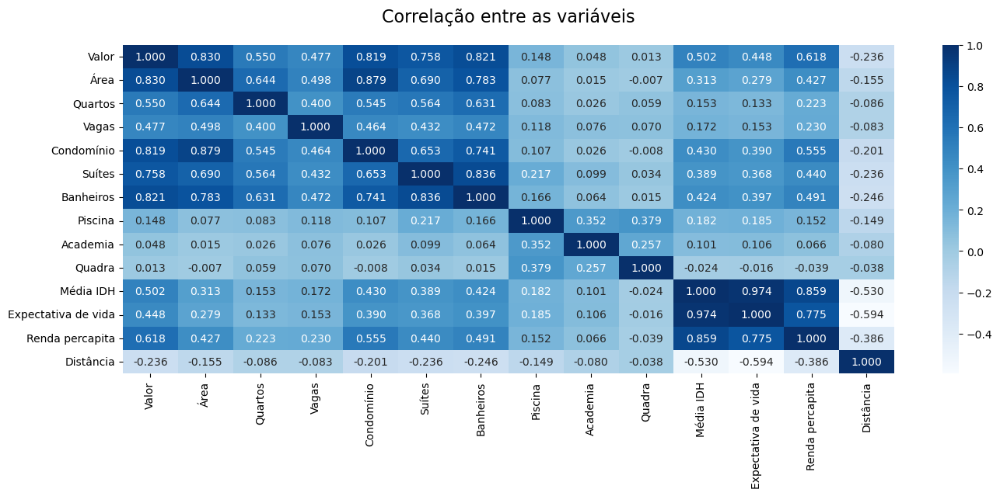

In [15]:
plt.figure(figsize=(16, 5.5))

ax = sns.heatmap(matriz_correlacao, annot=True, fmt='.3f', cmap="Blues")
ax.set_title('Correlação entre as variáveis', fontsize=16, y=1.05)

### Variável Valor

#### Distribuição dos valores dos apartamentos

In [16]:
from scipy.stats import normaltest

def is_normal(X):
    _, pvalue = normaltest(X)

    if pvalue <= alpha:
        print('Não segue uma normal')
    else:
        print('Segue uma normal')

is_normal(df['Valor'])

Não segue uma normal


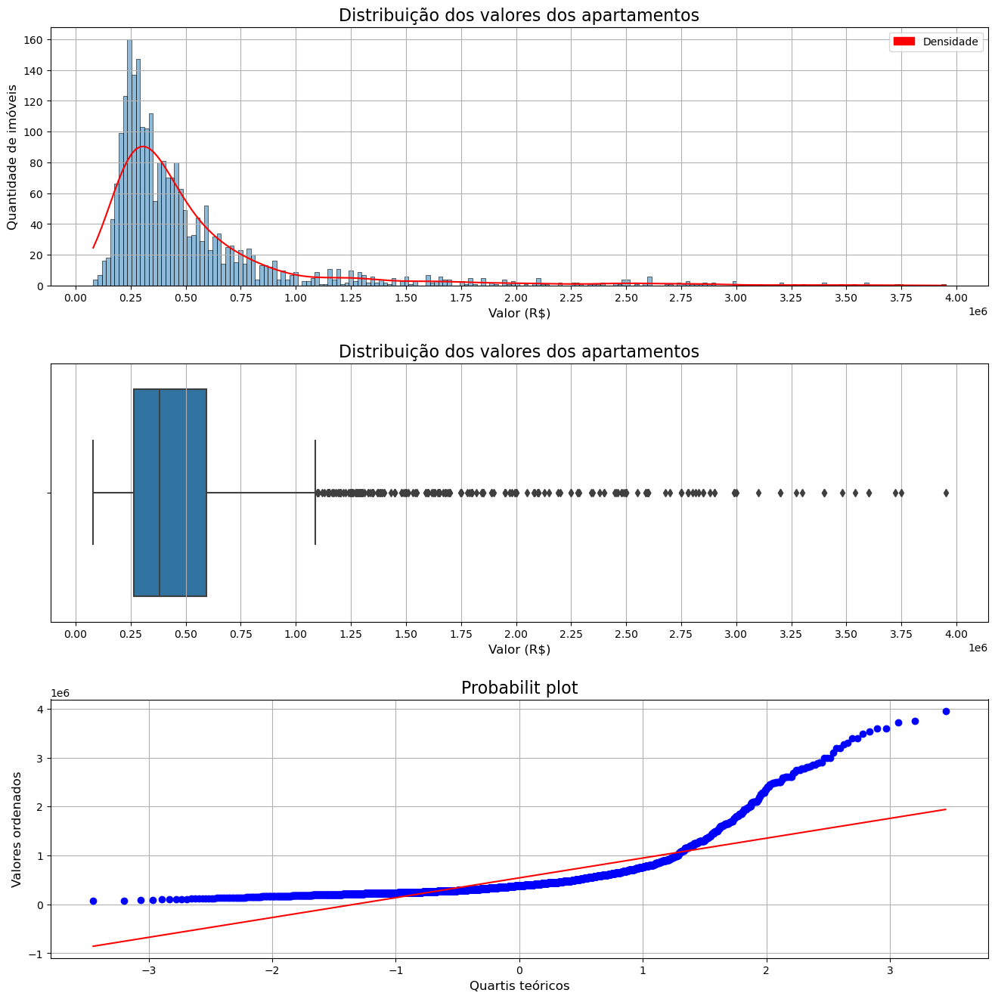

In [17]:
from scipy.stats import probplot

_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(df, x='Valor', bins=200, kde=True, ax=axes[0])
axes[0].set_title('Distribuição dos valores dos apartamentos', fontsize=16)
axes[0].set_xlabel('Valor (R$)', fontsize=12)
axes[0].set_ylabel('Quantidade de imóveis', fontsize=12)
axes[0].grid()
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=2.5e5))
axes[0].lines[0].set_color('red')
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

sns.boxplot(df, x='Valor', ax=axes[1])
axes[1].set_title('Distribuição dos valores dos apartamentos', fontsize=16)
axes[1].set_xlabel('Valor (R$)', fontsize=12)
axes[1].grid(axis='x')
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=2.5e5))

(_, (_, _, _)) = probplot(df['Valor'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Obtendo as medidas de tendência central

In [18]:
def price(value: float):
    return locale.currency(value, grouping=True)

print(f'O preço médio é {price(df["Valor"].mean())}')
print(f'O preço mediano é {price(df["Valor"].median())}')
print(f'O preço modal é {price(df["Valor"].mode()[0])}')

O preço médio é R$ 541.655,60
O preço mediano é R$ 380.000,00
O preço modal é R$ 350.000,00


#### Obtendo o desvio padrão

In [19]:
print(f'O desvio padrão é {price(df["Valor"].std())}')

O desvio padrão é R$ 505.168,46


#### Separando os valores em classes

In [20]:
valor_maximo = df['Valor'].max()
valor_maximo

3950000

In [21]:
passo_classes = valor_maximo / 10
passo_classes

395000.0

In [22]:
classes = {
    'range': [round(x, 2) for x in np.arange(0, valor_maximo + 1, passo_classes)],
    'label': [chr(x) for x in range(65, 75)]
}
classes

{'range': [0.0,
  395000.0,
  790000.0,
  1185000.0,
  1580000.0,
  1975000.0,
  2370000.0,
  2765000.0,
  3160000.0,
  3555000.0,
  3950000.0],
 'label': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']}

In [23]:
valores_por_classe = pd.value_counts(
    pd.cut(
        df['Valor'],
        classes['range'],
        labels=classes['label'],
    )
).to_frame()

valores_por_classe.index.name = 'Classe'
valores_por_classe.columns = ['Quantidade de apartamentos']

valores_por_classe['Limites'] = pd.value_counts(
    pd.cut(
        df['Valor'],
        classes['range']    
    )
).to_frame().index

valores_por_classe

,Quantidade de apartamentos,Limites
Classe,,
A,1300,"(0.0, 395000.0]"
B,799,"(395000.0, 790000.0]"
C,155,"(790000.0, 1185000.0]"
D,78,"(1185000.0, 1580000.0]"
E,49,"(1580000.0, 1975000.0]"
G,28,"(2370000.0, 2765000.0]"
F,24,"(1975000.0, 2370000.0]"
H,15,"(2765000.0, 3160000.0]"
I,8,"(3160000.0, 3555000.0]"


Text(0, 0.5, 'Quantidade de apartamentos')

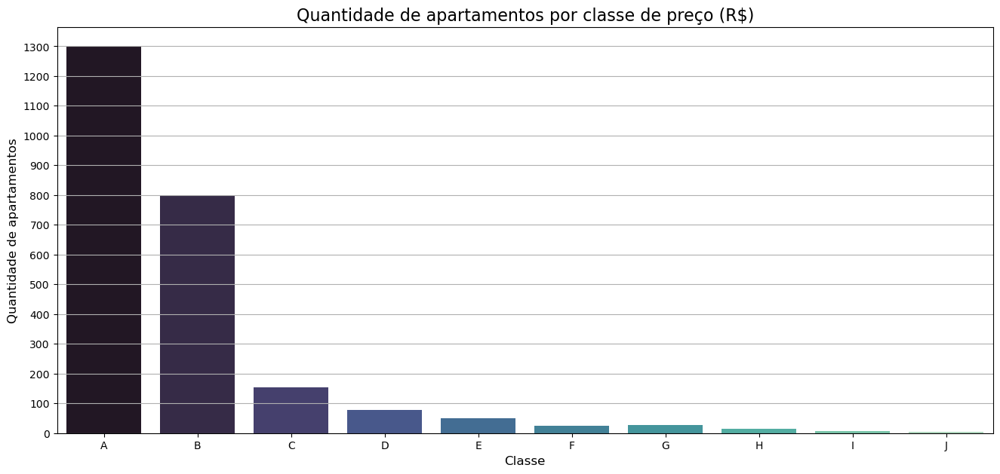

In [24]:
ax = sns.barplot(
    x=valores_por_classe.index,
    y=valores_por_classe['Quantidade de apartamentos'],
    palette='mako'
)
ax.grid(axis='y')
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=100))
ax.set_title('Quantidade de apartamentos por classe de preço (R$)', fontsize=16)
ax.set_xlabel('Classe', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)

> <h4>Conclusões</h4>
>
> - A MAIOR parte dos apartamentos pertence a classe A (até R$395.000,00)
>
> - A MENOR parte dos apartamentos pertence a classe J (de R$3.555.000,00 até R$3.950.000,00)
>
> - Quanto maior o preço há menos apartamentos a venda
>
> - A distribuição dos valors dos apartamentos tem assimetria a direita

---

### Variável Área

#### Distribuição dos valores das áreas

In [25]:
is_normal(df['Área'])

Não segue uma normal


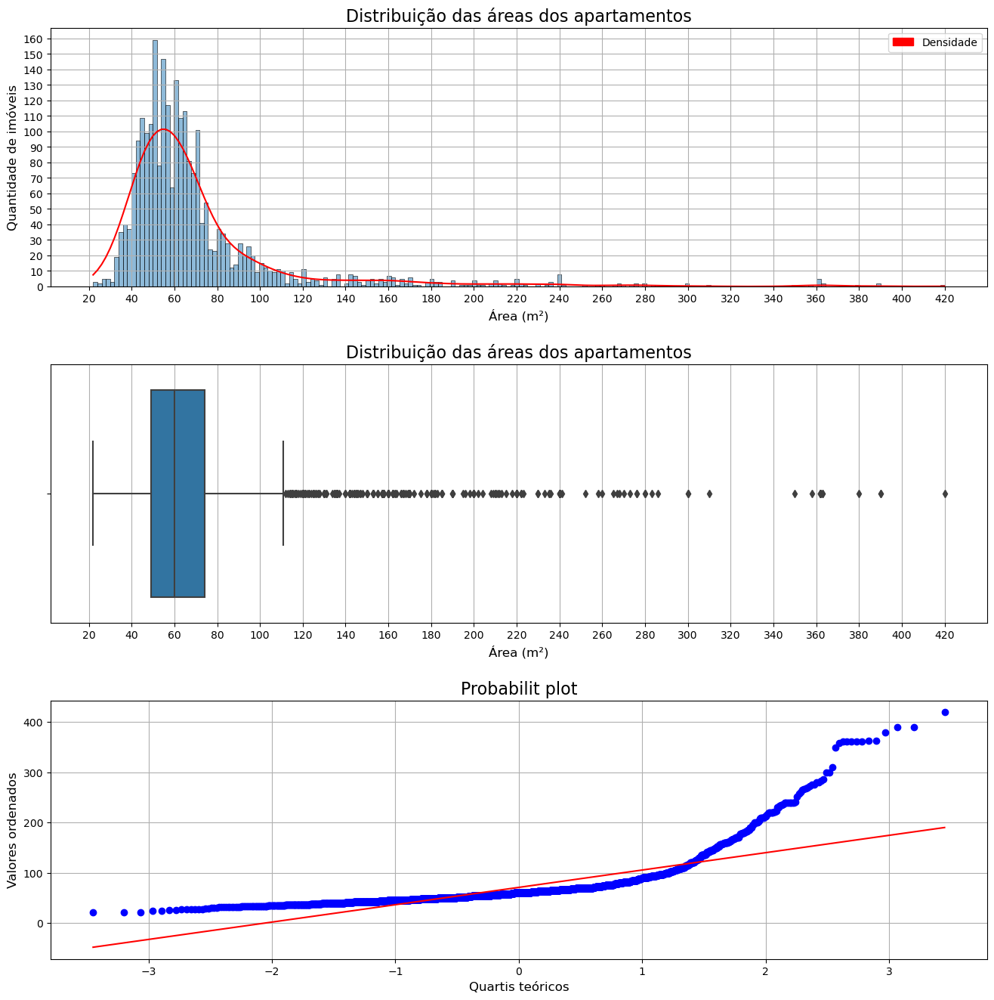

In [26]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(df, x='Área', bins=200, kde=True, ax=axes[0])

axes[0].set_title('Distribuição das áreas dos apartamentos', fontsize=16)
axes[0].set_xlabel('Área (m²)', fontsize=12)
axes[0].set_ylabel('Quantidade de imóveis', fontsize=12)
axes[0].grid()
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=10))
axes[0].lines[0].set_color('red')
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

sns.boxplot(df, x='Área', ax=axes[1])
axes[1].set_title('Distribuição das áreas dos apartamentos', fontsize=16)
axes[1].set_xlabel('Área (m²)', fontsize=12)
axes[1].grid(axis='x')
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=20))


(_, (_, _, _)) = probplot(df['Área'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Obtendo as medidas de tendência central

In [27]:
print(f'A área média é {df["Área"].mean():.2f}m²')
print(f'A área mediana é {df["Área"].median():.2f}m²')
print(f'A área modal é {df["Área"].mode()[0]:.2f}m²')

A área média é 71.03m²
A área mediana é 60.00m²
A área modal é 50.00m²


#### Obtendo o desvio padrão

In [28]:
print(f'O desvio padrão é {df["Área"].std():.2f}m²')

O desvio padrão é 43.38m²


#### Separando os valores em classes

In [29]:
valor_maximo = df['Área'].max()
valor_maximo

420

In [30]:
passo_classes = valor_maximo / 10
passo_classes

42.0

In [31]:
classes = {
    'range': [round(x, 2) for x in np.arange(0, valor_maximo + 1, passo_classes)],
    'label': [chr(x) for x in range(65, 75)]
}
classes

{'range': [0.0,
  42.0,
  84.0,
  126.0,
  168.0,
  210.0,
  252.0,
  294.0,
  336.0,
  378.0,
  420.0],
 'label': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']}

In [32]:
areas_por_classe = pd.value_counts(
    pd.cut(
        df['Área'],
        classes['range'],
        labels=classes['label'],
    )
).to_frame()

areas_por_classe.index.name = 'Classe'
areas_por_classe.columns = ['Quantidade de apartamentos']

areas_por_classe['Limites'] = pd.value_counts(
    pd.cut(
        df['Área'],
        classes['range']    
    )
).to_frame().index

areas_por_classe

,Quantidade de apartamentos,Limites
Classe,,
B,1746,"(42.0, 84.0]"
A,284,"(0.0, 42.0]"
C,250,"(84.0, 126.0]"
D,82,"(126.0, 168.0]"
E,41,"(168.0, 210.0]"
F,29,"(210.0, 252.0]"
G,13,"(252.0, 294.0]"
I,9,"(336.0, 378.0]"
J,4,"(378.0, 420.0]"


Text(0, 0.5, 'Quantidade de apartamentos')

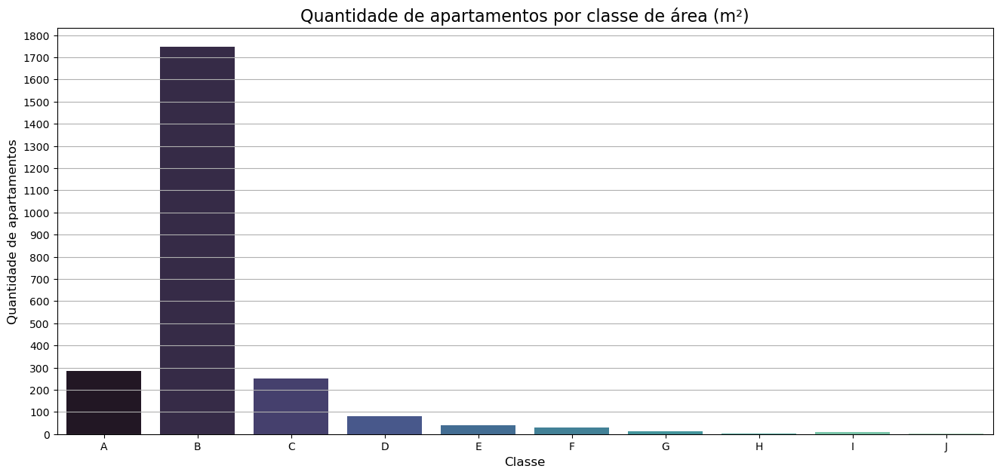

In [33]:
ax = sns.barplot(
    x=areas_por_classe.index,
    y=areas_por_classe['Quantidade de apartamentos'],
    palette='mako'
)
ax.grid(axis='y')
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=100))
ax.set_title('Quantidade de apartamentos por classe de área (m²)', fontsize=16)
ax.set_xlabel('Classe', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)

#### Relação entre o valor do apartamento e a área

In [34]:
df[['Valor', 'Área']].corr().loc['Área']['Valor']

0.8295445427504672

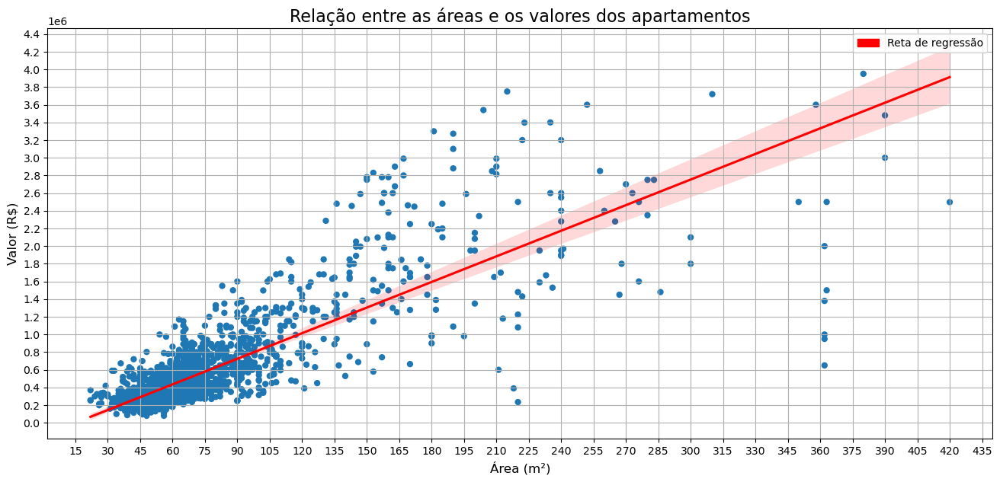

In [35]:
ax = sns.scatterplot(df, x='Área', y='Valor', edgecolor='none')
sns.regplot(df, x='Área', y='Valor', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre as áreas e os valores dos apartamentos', fontsize=16)
ax.set_xlabel('Área (m²)', fontsize=12)
ax.set_ylabel('Valor (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=15))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Rodando uma regressão linear para Área e Valor

In [36]:
X = sm.add_constant(df['Área'])
X.head()

,const,Área
0,1.00,200
1,1.00,350
2,1.00,358
3,1.00,240
4,1.00,280


In [37]:
Y = df['Valor']
Y.head()

0    2083000
1    2500000
2    3600000
3    2600000
4    2750000
Name: Valor, dtype: int64

In [38]:
reg_area_valor = sm.OLS(Y, X).fit()
print(reg_area_valor.summary())

                            OLS Regression Results                            
Dep. Variable:                  Valor   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.688
Method:                 Least Squares   F-statistic:                     5426.
Date:                Tue, 22 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:01:22   Log-Likelihood:                -34377.
No. Observations:                2461   AIC:                         6.876e+04
Df Residuals:                    2459   BIC:                         6.877e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.445e+05   1.09e+04    -13.242      0.0

#### Obtendo os parâmetros do modelo

In [39]:
b1, b2 = reg_area_valor.params

print(f'b1 = {b1}')
print(f'b2 = {b2}')

b1 = -144524.9597532375
b2 = 9659.815777461634


#### Obtendo o intervalo de confiança para os parâmetros

In [40]:
conf_int = reg_area_valor.conf_int(alpha=alpha)
conf_int.columns = ('Limite inferior', 'Limite superior')
conf_int.index = ('b1', 'b2')
conf_int

,Limite inferior,Limite superior
b1,-165927.48,-123122.44
b2,9402.66,9916.97


#### Obtendo os valores previstos

In [41]:
area_valor = df[['Área', 'Valor']]
area_valor['Valor previsto'] = reg_area_valor.predict()
area_valor

C:\Users\alber\AppData\Local\Temp\ipykernel_4008\2294511949.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  area_valor['Valor previsto'] = reg_area_valor.predict()


,Área,Valor,Valor previsto
0,200,2083000,1787438.20
1,350,2500000,3236410.56
2,358,3600000,3313689.09
3,240,2600000,2173830.83
4,280,2750000,2560223.46
...,...,...,...
2489,45,120000,290166.75
2490,45,120000,290166.75
2491,45,120000,290166.75
2492,34,100300,183908.78


#### Teste de hipótese para nulidade do coeficiente angular

### $H_0: \beta_2 = 0$
### $H_1: \beta_2 \neq 0$

In [42]:
pvalue = reg_area_valor.pvalues[1]
pvalue

0.0

In [43]:
if pvalue <= alpha:
    print('O valor de B² não é 0')
else:
    print('O valor de B² é 0')

O valor de B² não é 0


#### Analisando os resíduos do modelo

In [44]:
reg_area_valor.resid

0       295561.80
1      -736410.56
2       286310.91
3       426169.17
4       189776.54
          ...    
2489   -170166.75
2490   -170166.75
2491   -170166.75
2492    -83608.78
2493   -316424.72
Length: 2461, dtype: float64

In [45]:
print(f'A média dos resíduos é {round(reg_area_valor.resid.mean(), 2)}')

A média dos resíduos é -0.0


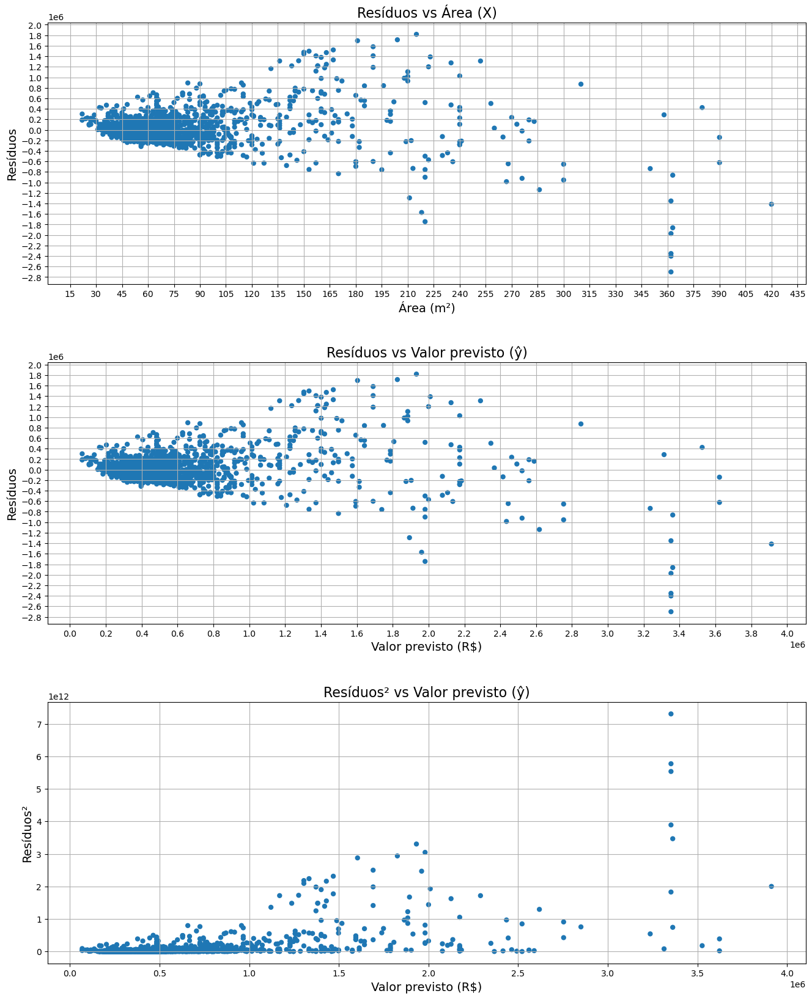

In [46]:
_, axes = plt.subplots(3, figsize=(16, 20))
plt.subplots_adjust(hspace=.3)

sns.scatterplot(area_valor, x='Área', y=reg_area_valor.resid, edgecolor='none', ax=axes[0])
axes[0].set_title('Resíduos vs Área (X)', fontsize=16)
axes[0].set_xlabel('Área (m²)', fontsize=14)
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=15))

sns.scatterplot(area_valor, x='Valor previsto', y=reg_area_valor.resid, edgecolor='none', ax=axes[1])
axes[1].set_title('Resíduos vs Valor previsto (ŷ)', fontsize=16)
axes[1].set_xlabel('Valor previsto (R$)', fontsize=14)
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))

for i in range(2):
    axes[i].grid()
    axes[i].set_ylabel('Resíduos', fontsize=14)
    axes[i].yaxis.set_major_locator(ticker.MultipleLocator(base=2e5))

sns.scatterplot(area_valor, x='Valor previsto', y=reg_area_valor.resid ** 2, edgecolor='none', ax=axes[2])
axes[2].set_title('Resíduos² vs Valor previsto (ŷ)', fontsize=16)
axes[2].set_xlabel('Valor previsto (R$)', fontsize=14)
axes[2].set_ylabel('Resíduos²', fontsize=14)
axes[2].grid()

#### Verificando a normalidade dos resíduos

In [47]:
is_normal(reg_area_valor.resid)

Não segue uma normal


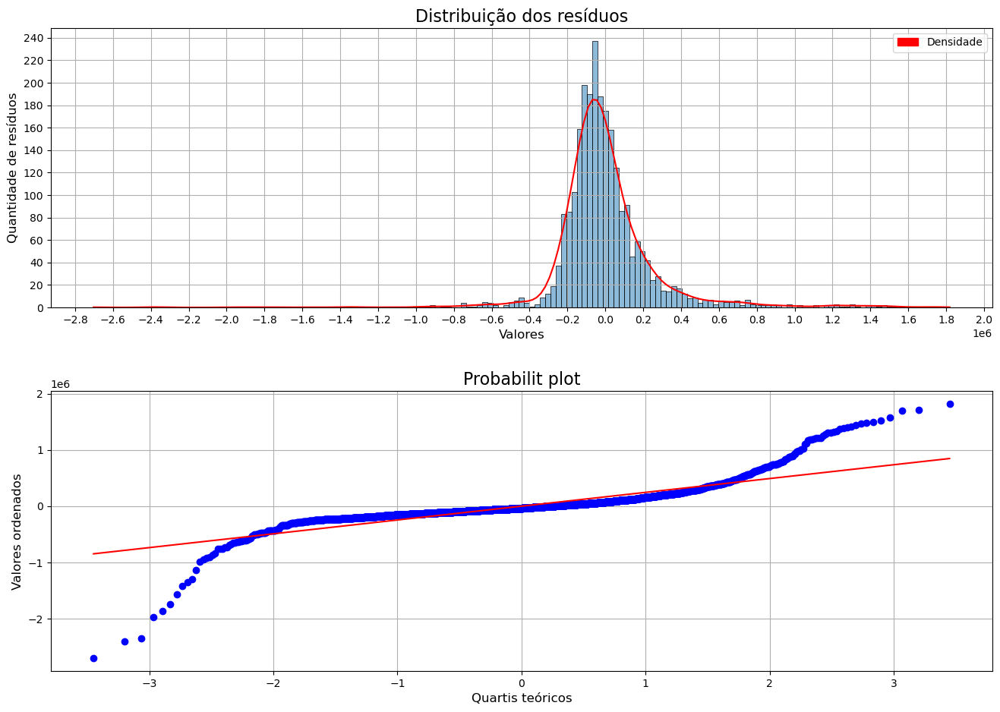

In [48]:
_, axes = plt.subplots(2, figsize=(16, 11))
plt.subplots_adjust(hspace=.3)

sns.histplot(reg_area_valor.resid, kde=True, ax=axes[0])
axes[0].set_title('Distribuição dos resíduos', fontsize=16)
axes[0].set_xlabel('Valores', fontsize=12)
axes[0].set_ylabel('Quantidade de resíduos', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

(_, (_, _, _)) = probplot(reg_area_valor.resid, plot=axes[1])
axes[1].set_title('Probabilit plot', fontsize=16)
axes[1].set_xlabel('Quartis teóricos', fontsize=12)
axes[1].set_ylabel('Valores ordenados', fontsize=12)
axes[1].grid()

#### Obtendo $R^2$ do modelo

In [49]:
reg_area_valor.rsquared

0.6881441484070816

#### Prevendo valores

#### Previsão para São Paulo em geral

In [50]:
def calcular_valor(area: float):
    valor_previsto = reg_area_valor.predict([1, area])[0]

    print(f'No contexto da cidade de São Paulo, o valor previsto para um apartamento de {area}m² é de {price(valor_previsto)}')

calcular_valor(50)

No contexto da cidade de São Paulo, o valor previsto para um apartamento de 50m² é de R$ 338.465,83


#### Previsão por zona

In [51]:
zonas = df['Zona'].unique()

def calcular_valor_por_area_zona(area: float):
    XY_zonas = {}

    print(f'Para um apartamento de {area}m²:\n')

    for zona in zonas:
        XY_zonas[zona] = {
            'X': sm.add_constant(df.query(f'Zona == "{zona}"')['Área']),
            'Y': df.query(f'Zona == "{zona}"')['Valor']
        }


    for zona, zona_data in XY_zonas.items():
        model = sm.OLS(zona_data['Y'], zona_data['X']).fit()
        valor_previsto = model.predict([1, area])[0]

        if zona == 'Centro':
            print(f'{zona.upper()} - {price(valor_previsto)}')
        else:
            print(f'ZONA {zona.upper()} - {price(valor_previsto)}')

calcular_valor_por_area_zona(50)

Para um apartamento de 50m²:

ZONA SUL - R$ 385.869,29
CENTRO - R$ 442.976,61
ZONA OESTE - R$ 292.804,14
ZONA LESTE - R$ 279.767,97
ZONA NORTE - R$ 335.847,22


> <h4>Conclusões</h4>
>
> - Há mais apartamentos com menor área útil do que com maior área útil
>
> - A distribuição das áreas dos apartamentos tem assimetria a direita
>
> - A MAIOR parte dos apartamentos está na classe B (de 42m² a 84m²)
>
> - A MENOR parte dos apartamentos está na classe H (de 294m² a 336m²)
>
> - O coeficiente angular ($\beta_2$) da regressão linear entre Área e Valor NÃO é 0
>
> - A distribuição dos resíduos da regressão linear entre Área e Valor NÃO segue uma normal
>
> - O $R^2$ da regresão linear entre Área e Valor é razoável - 0.68
>
> - A variância ($S$) dos resíduos ($u$) da regressão linear entre Área e Valor não é a mesma para todos os valores de Área ($X$)
>
> - A ZONA com o MAIOR preço previsto para um apartamento de 50m² é o CENTRO - R$441.934,86
>
> - A ZONA com o MENOR preço previsto para um apartamento de 50m² é a ZONA LESTE - R$279.767,97

### Variável Zona

#### Quantidade de apartamentos a venda por zona

In [52]:
apartamentos_zona = df['Zona'].value_counts()
apartamentos_zona

Zona
Leste     828
Sul       700
Oeste     405
Norte     280
Centro    248
Name: count, dtype: int64

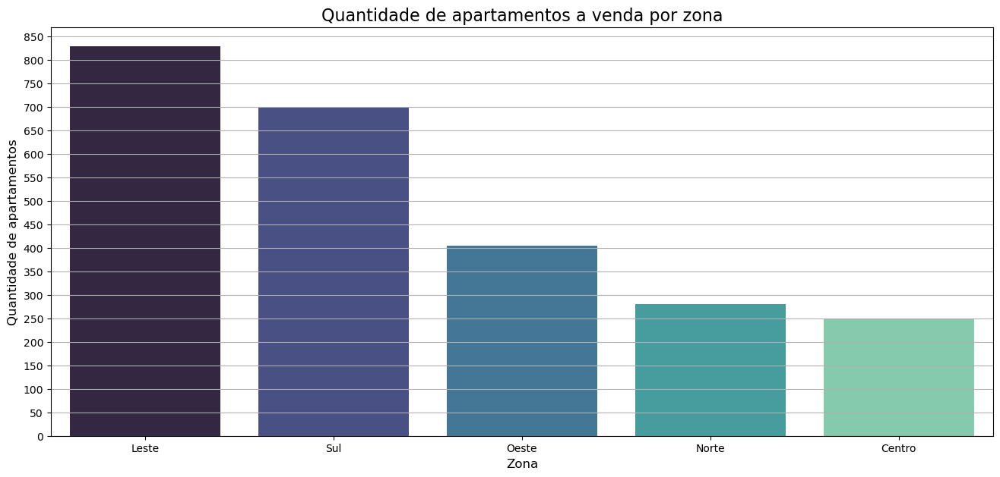

In [53]:
ax = sns.barplot(x=apartamentos_zona.index, y=apartamentos_zona.values, palette='mako')
ax.grid(axis='y')
ax.set_title('Quantidade de apartamentos a venda por zona', fontsize=16)
ax.set_xlabel('Zona', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=50))

#### Obtendo as medidas de tendência central para Valor em cada zona

In [54]:
def mode(x):
    return x.mode()[0] if not x.empty else None

tendencia_central_valor_zona = df.groupby('Zona')['Valor'].agg(['mean', 'median', mode])
tendencia_central_valor_zona.columns = ('Valor médio', 'Valor mediano', 'Valor modal')
tendencia_central_valor_zona.sort_values('Valor médio', ascending=False, inplace=True)

tendencia_central_valor_zona

,Valor médio,Valor mediano,Valor modal
Zona,,,
Oeste,667366.10,430000.00,350000
Centro,654321.14,481000.00,450000
Sul,644645.35,417000.00,350000
Norte,506150.48,428500.00,430000
Leste,371359.46,290000.00,280000


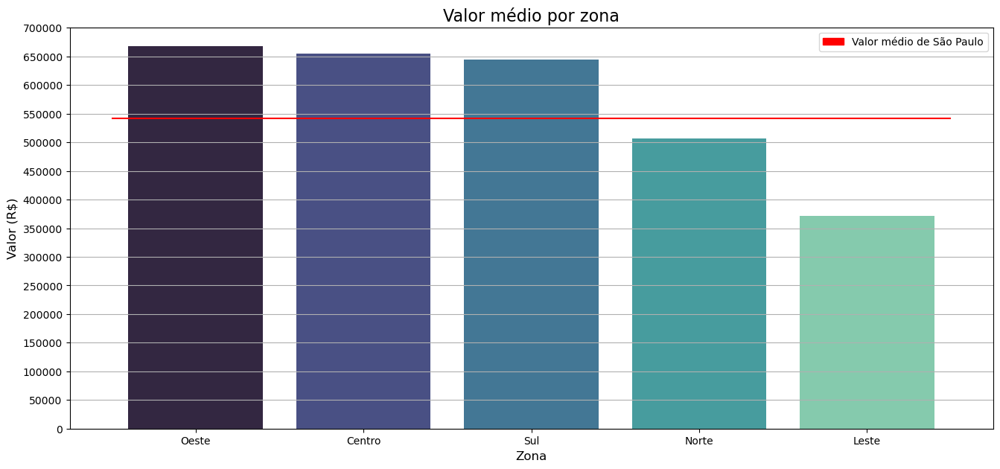

In [55]:
ax = sns.barplot(
    x=tendencia_central_valor_zona.index,
    y=tendencia_central_valor_zona['Valor médio'],
    palette='mako'
)

ax.set_title('Valor médio por zona', fontsize=16)
ax.set_xlabel('Zona', fontsize=12)
ax.set_ylabel('Valor (R$)', fontsize=12)
ax.hlines(y=df['Valor'].mean(), xmin=-.5, xmax=4.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5e4))
ax.grid(axis='y')

#### Distribuição dos valores por zona

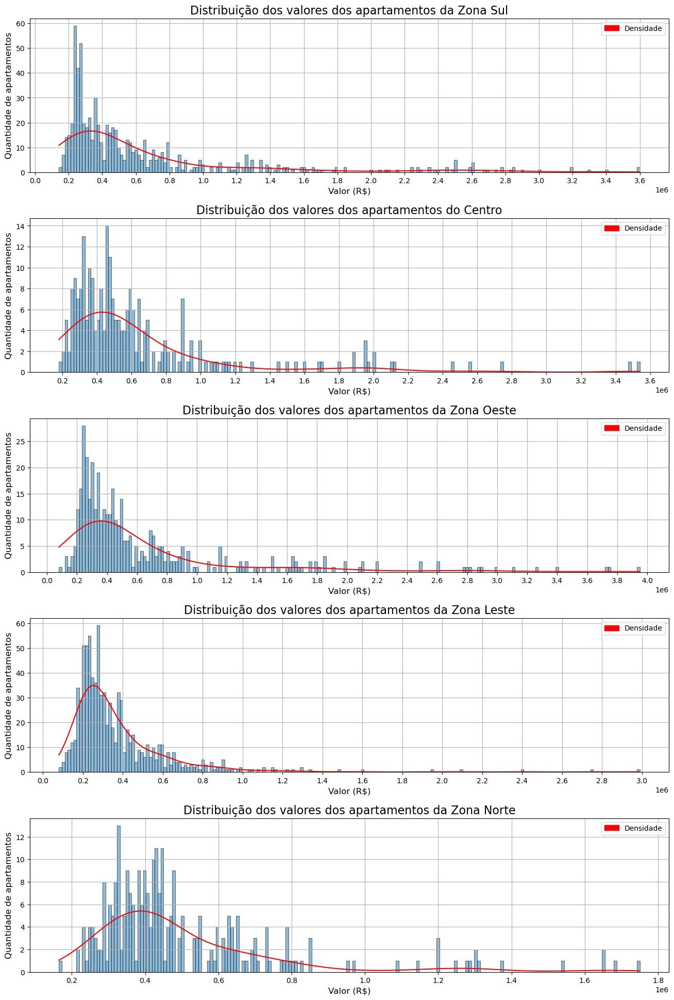

In [56]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    sns.histplot(df.query(f'Zona == "{zona}"')['Valor'], kde=True, ax=axes[i], bins=200)

    if zona == 'Centro':
        axes[i].set_title(f'Distribuição dos valores dos apartamentos do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Distribuição dos valores dos apartamentos da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Valor (R$)', fontsize=12)
    axes[i].set_ylabel('Quantidade de apartamentos', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

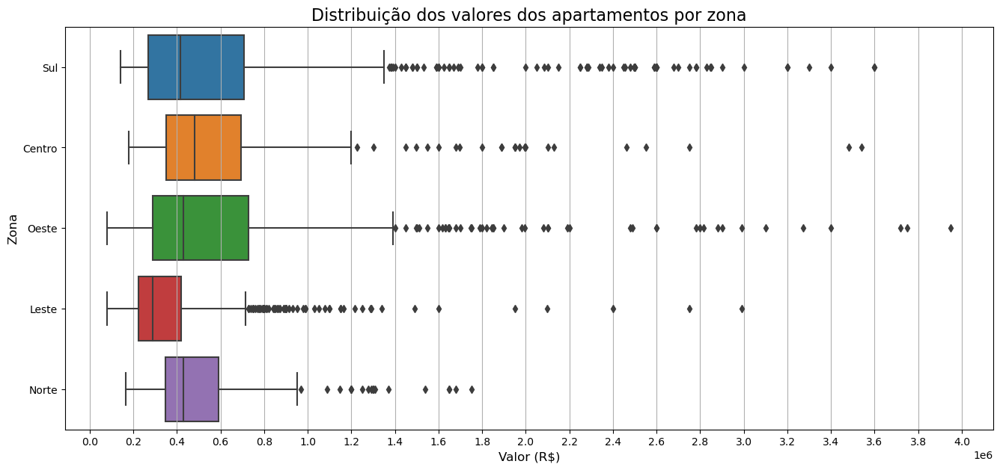

In [57]:
ax = sns.boxplot(df, x='Valor', y='Zona')

ax.set_title(f'Distribuição dos valores dos apartamentos por zona', fontsize=16)
ax.set_ylabel('Zona', fontsize=12)
ax.set_xlabel('Valor (R$)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
ax.grid(axis='x')

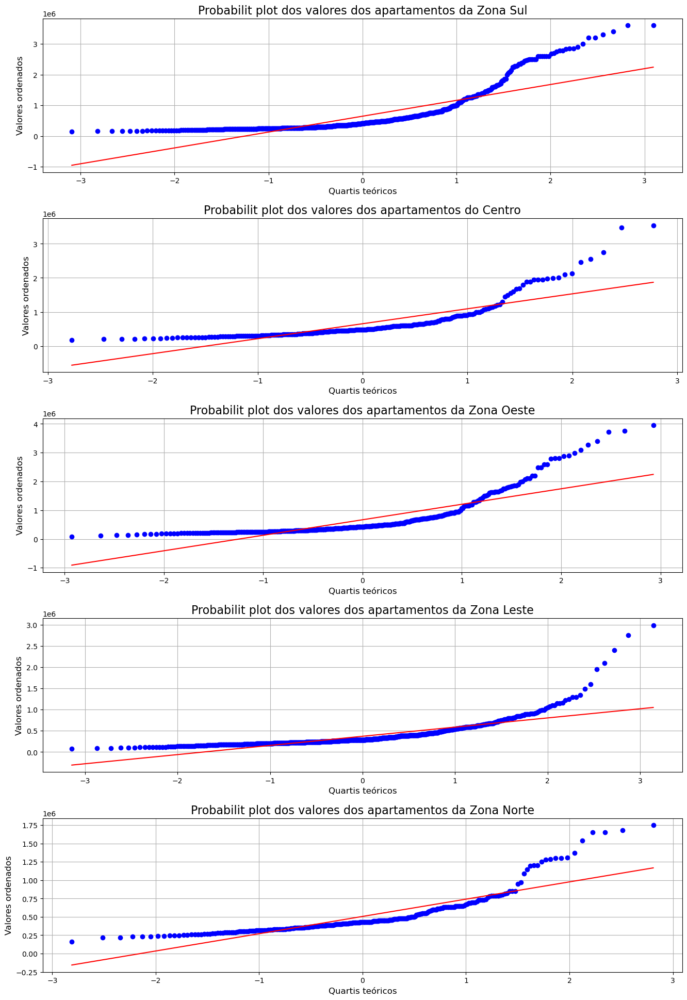

In [58]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    (_, (_, _, _)) = probplot(df.query(f'Zona == "{zona}"')['Valor'], plot=axes[i])

    if zona == 'Centro':
        axes[i].set_title(f'Probabilit plot dos valores dos apartamentos do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Probabilit plot dos valores dos apartamentos da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### Obtendo as medidas de tendência central para Área em cada zona

In [59]:
tendencia_central_area_zona = df.groupby('Zona')['Área'].agg(['mean', 'median', mode])
tendencia_central_area_zona.columns = ('Área média', 'Área mediana', 'Área modal')
tendencia_central_area_zona.sort_values('Área média', ascending=False, inplace=True)

tendencia_central_area_zona

,Área média,Área mediana,Área modal
Zona,,,
Sul,81.57,62.00,50
Oeste,76.49,64.00,50
Centro,72.57,60.00,55
Norte,70.27,65.00,60
Leste,59.26,55.00,45


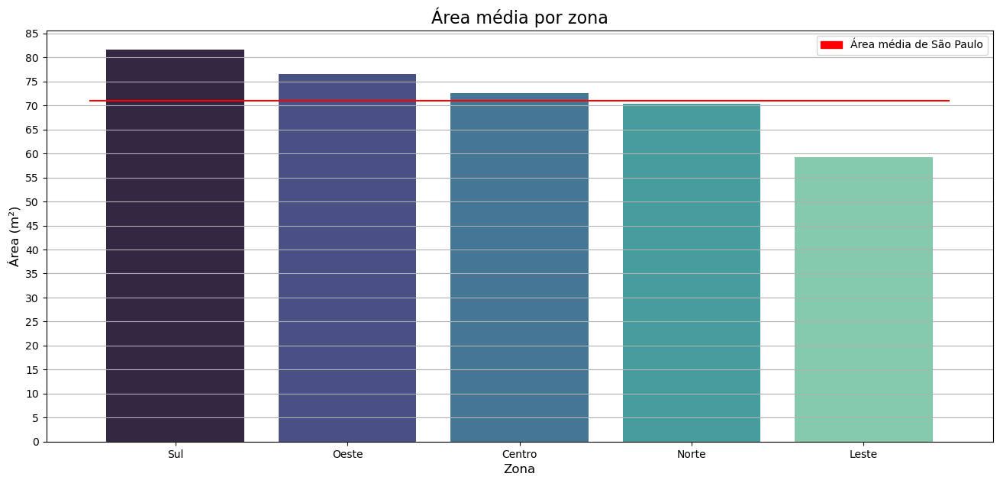

In [60]:
ax = sns.barplot(
    x=tendencia_central_area_zona.index,
    y=tendencia_central_area_zona['Área média'],
    palette='mako'
)

ax.set_title('Área média por zona', fontsize=16)
ax.set_xlabel('Zona', fontsize=12)
ax.set_ylabel('Área (m²)', fontsize=12)
ax.hlines(y=df['Área'].mean(), xmin=-.5, xmax=4.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
ax.grid(axis='y')

#### Distribuição das áreas por zona

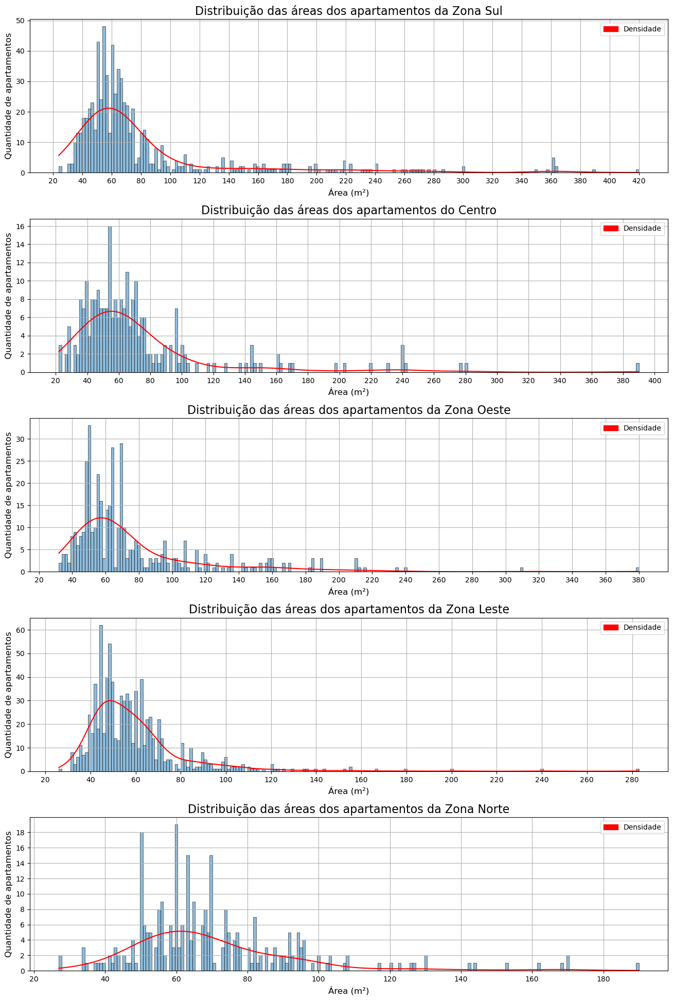

In [61]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    sns.histplot(df.query(f'Zona == "{zona}"')['Área'], kde=True, ax=axes[i], bins=200)

    if zona == 'Centro':
        axes[i].set_title(f'Distribuição das áreas dos apartamentos do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Distribuição das áreas dos apartamentos da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Área (m²)', fontsize=12)
    axes[i].set_ylabel('Quantidade de apartamentos', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=20))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

axes[4].yaxis.set_major_locator(ticker.MultipleLocator(base=2))

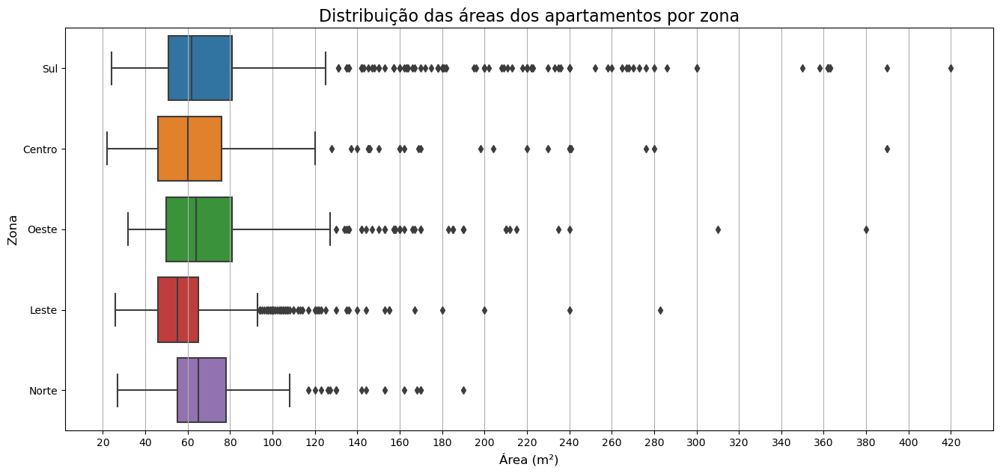

In [62]:
ax = sns.boxplot(df, x='Área', y='Zona')

ax.set_title(f'Distribuição das áreas dos apartamentos por zona', fontsize=16)
ax.set_ylabel('Zona', fontsize=12)
ax.set_xlabel('Área (m²)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20))
ax.grid(axis='x')

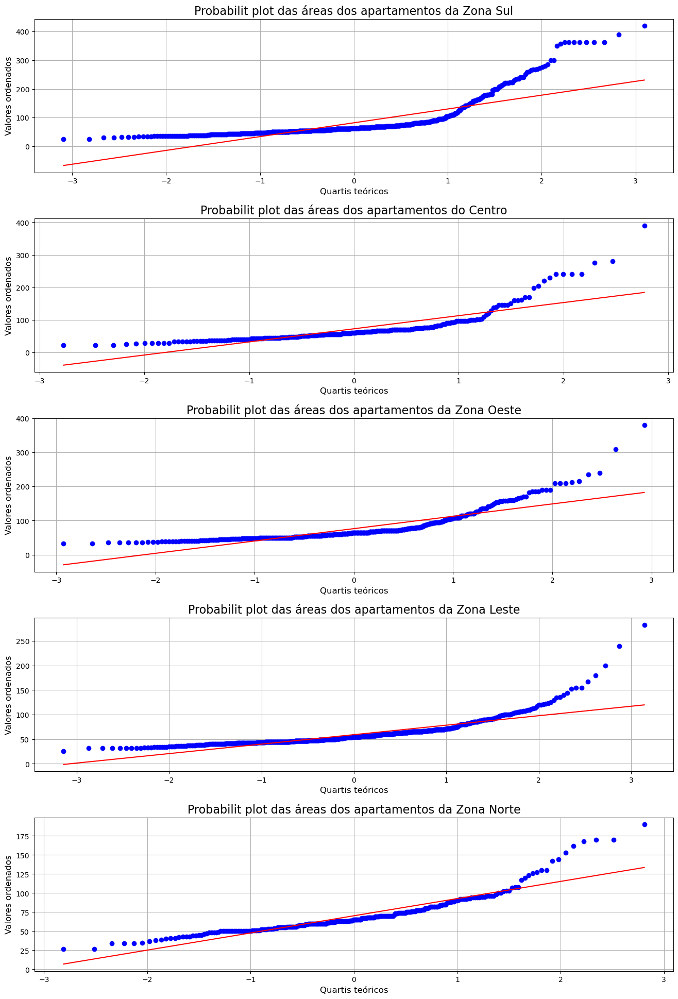

In [63]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    (_, (_, _, _)) = probplot(df.query(f'Zona == "{zona}"')['Área'], plot=axes[i])

    if zona == 'Centro':
        axes[i].set_title(f'Probabilit plot das áreas dos apartamentos do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Probabilit plot das áreas dos apartamentos da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### Relação entre Área e Valor por Zona

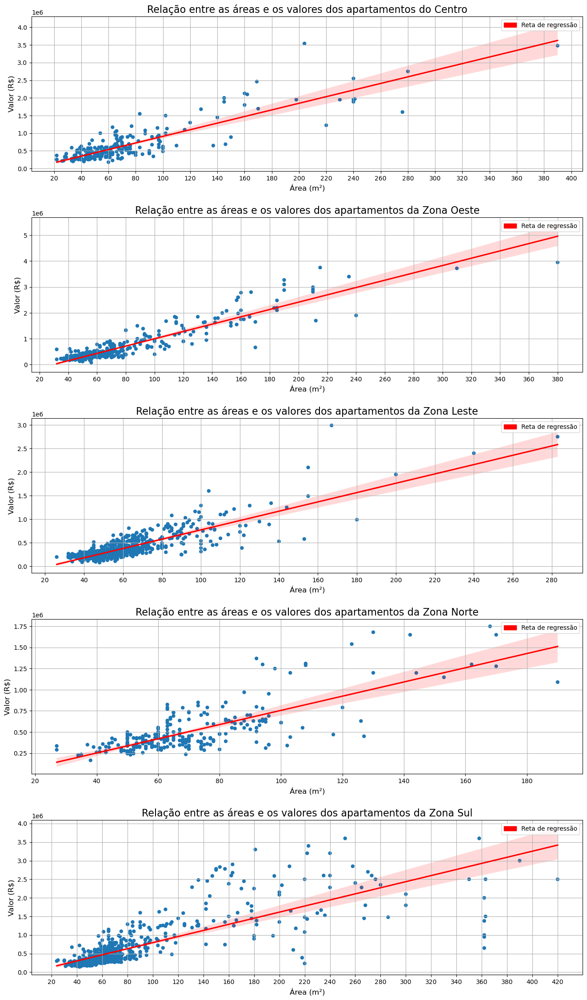

In [64]:
_, axes = plt.subplots(5, figsize=(16, 28))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    i -=1

    sns.scatterplot(df.query(f'Zona == "{zona}"'), x='Área', y='Valor', edgecolor='none', ax=axes[i])
    sns.regplot(df.query(f'Zona == "{zona}"'), x='Área', y='Valor', ax=axes[i], color='red', ci=95, scatter=False)   

    if zona == 'Centro':
        axes[i].set_title(f'Relação entre as áreas e os valores dos apartamentos do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Relação entre as áreas e os valores dos apartamentos da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Área (m²)', fontsize=12)
    axes[i].set_ylabel('Valor (R$)', fontsize=12)
    axes[i].grid()
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=20))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Reta de regressão'])

> <h4>Conclusões</h4>
>
> - A MAIOR parte dos apartamentos a venda estão na Zona Leste - 828 apartamentos
>
> - A MENOR parte dos apartamentos a venda estão no Centro - 248 apartamentos
>
> - A zona com o MAIOR VALOR MÉDIO é a Zona Oeste - R$666.214,95
>
> - A zona com o MENOR VALOR MÉDIO é a Zona Leste - R$371.359,46
> 
> - A zona com o MAIOR VALOR MEDIANO é o Centro - R$480.000,00
> 
> - A zona com o MENOR VALOR MEDIANO é a Zona Leste - R$290.000,00
> 
> - A zona com o MAIOR VALOR MODAL é o Centro- R$450.000,00
> 
> - A zona com o MENOR VALOR MODAL é a Zona Leste- R$280.000,00
>
> - O VALOR MÉDIO da Zona Oeste, Centro e Zona Sul estão ACIMA do VALOR MÉDIO de São Paulo
>
> - O VALOR MÉDIO da Zona Norte e Zona Leste estão ABAIXO do VALOR MÉDIO de São Paulo
>
> - Todas as distribuições de VALORES por zona possuem assimetria a direita
>
> - A Zona com a MAIOR ÁREA MÉDIA é a Zona Sul - 81,53m²
>
> - A Zona com a MENOR ÁREA MÉDIA é a Zona Leste - 59,26m²
>
> - A Zona com a MAIOR ÁREA MEDIANA é a Zona Norte - 65m²
>
> - A Zona com a MENOR ÁREA MEDIANA é a Zona Leste - 55m²
>
> - A Zona com a MAIOR ÁREA MODAL é a Zona Norte - 60m²
>
> - A Zona com a MENOR ÁREA MODAL é a Zona Leste - 45m²
>
> - O ÁREA MÉDIA da Zona Oeste, Centro e Zona Sul estão ACIMA do ÁREA MÉDIA de São Paulo
>
> - O ÁREA MÉDIA da Zona Norte e Zona Leste estão ABAIXO do ÁREA MÉDIA de São Paulo

### Variável Quartos

#### Quantidade de apartamentos por quantidade de quartos

In [65]:
quartos_apartamento = df['Quartos'].value_counts().to_frame()
quartos_apartamento.columns = ['Quantidade de apartamentos']
quartos_apartamento

,Quantidade de apartamentos
Quartos,
2,1587
3,646
1,143
4,80
5,5


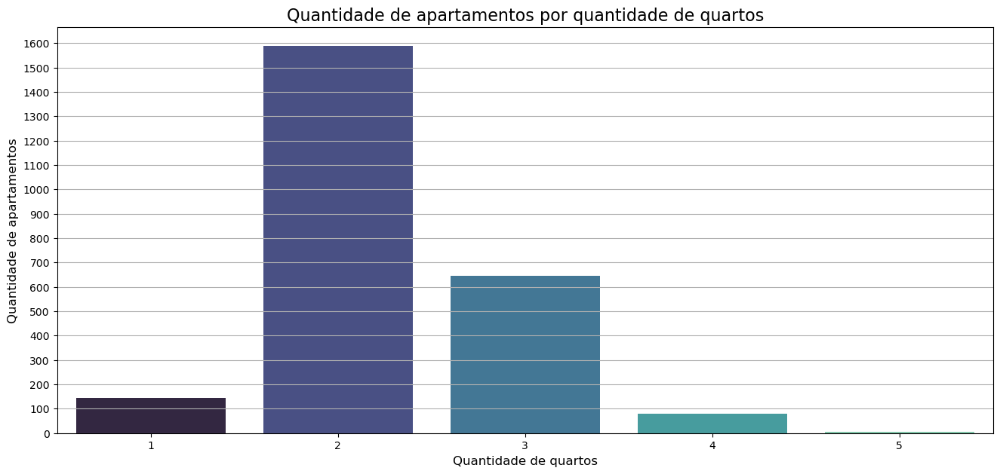

In [66]:
ax = sns.barplot(
    x=quartos_apartamento.index,
    y=quartos_apartamento['Quantidade de apartamentos'],
    palette='mako'
)

ax.set_title('Quantidade de apartamentos por quantidade de quartos', fontsize=16)
ax.set_xlabel('Quantidade de quartos', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1e2))
ax.grid(axis='y')

#### Obtendo as medidas de tendência central

In [67]:
print(f'A quantidade média de quartos é {df["Quartos"].mean().round(3)} quartos ~ {round(df["Quartos"].mean())} quartos')
print(f'A quantidade mediana de quartos é {round(df["Quartos"].median())} quartos')
print(f'A quantidade modal de quartos é {df["Quartos"].mode()[0]} quartos')

A quantidade média de quartos é 2.275 quartos ~ 2 quartos
A quantidade mediana de quartos é 2 quartos
A quantidade modal de quartos é 2 quartos


#### Obtendo as medidas de tendência central para quantidade de quartos em cada zona

In [68]:
tendencia_central_quartos_zona = df.groupby('Zona')['Quartos'].agg(['mean', 'median', mode])
tendencia_central_quartos_zona.columns = ('Qtd quartos média', 'Qtd quartos mediana', 'Qtd quartos modal')
tendencia_central_quartos_zona.sort_values('Qtd quartos média', ascending=False, inplace=True)

tendencia_central_quartos_zona

,Qtd quartos média,Qtd quartos mediana,Qtd quartos modal
Zona,,,
Oeste,2.41,2.00,2
Norte,2.38,2.00,2
Sul,2.35,2.00,2
Leste,2.23,2.00,2
Centro,1.90,2.00,2


#### Distribuição dos Valores conforme a quantidade de quartos

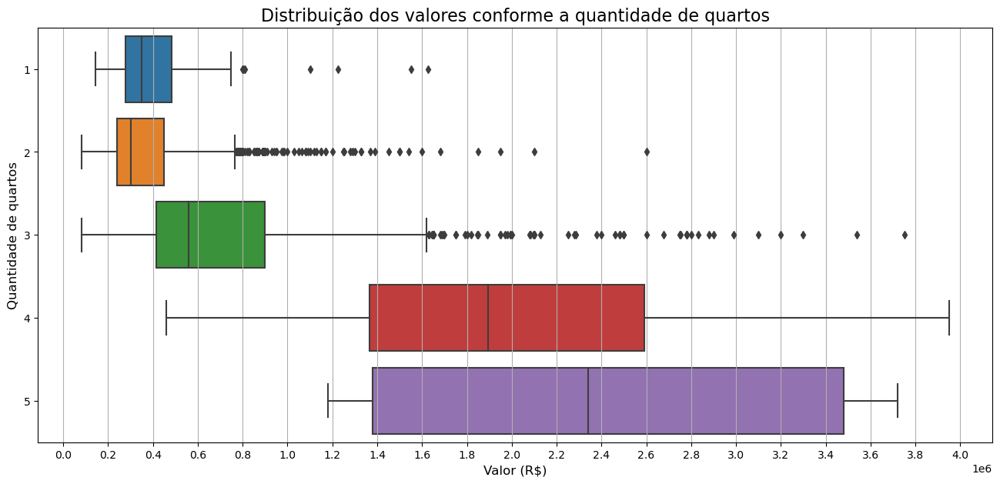

In [69]:
ax = sns.boxplot(df, x='Valor', y='Quartos', orient='h')

ax.set_title(f'Distribuição dos valores conforme a quantidade de quartos', fontsize=16)

ax.set_xlabel('Valor (R$)', fontsize=12)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.grid(axis='x')
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))

#### Distribuição das Áreas conforme a quantidade de quartos

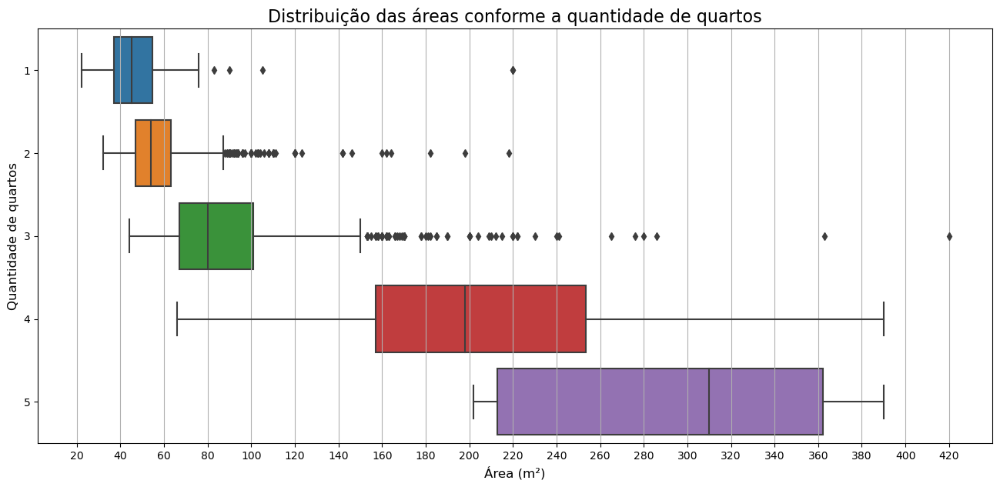

In [70]:
ax = sns.boxplot(df, x='Área', y='Quartos', orient='h')

ax.set_title(f'Distribuição das áreas conforme a quantidade de quartos', fontsize=16)

ax.set_xlabel('Área (m²)', fontsize=12)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.grid(axis='x')
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20))

#### Distribuição da quantidade de quartos por zona

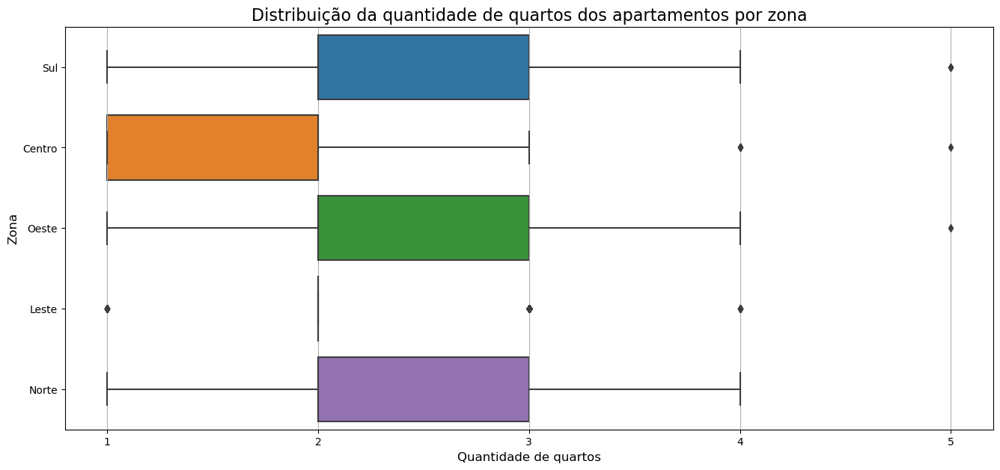

In [71]:
ax = sns.boxplot(df, x='Quartos', y='Zona')

ax.set_title(f'Distribuição da quantidade de quartos dos apartamentos por zona', fontsize=16)
ax.set_ylabel('Zona', fontsize=12)
ax.set_xlabel('Quantidade de quartos', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=1))
ax.grid(axis='x')

#### Distribuição dos valores por zona conforme a quantidade de quartos

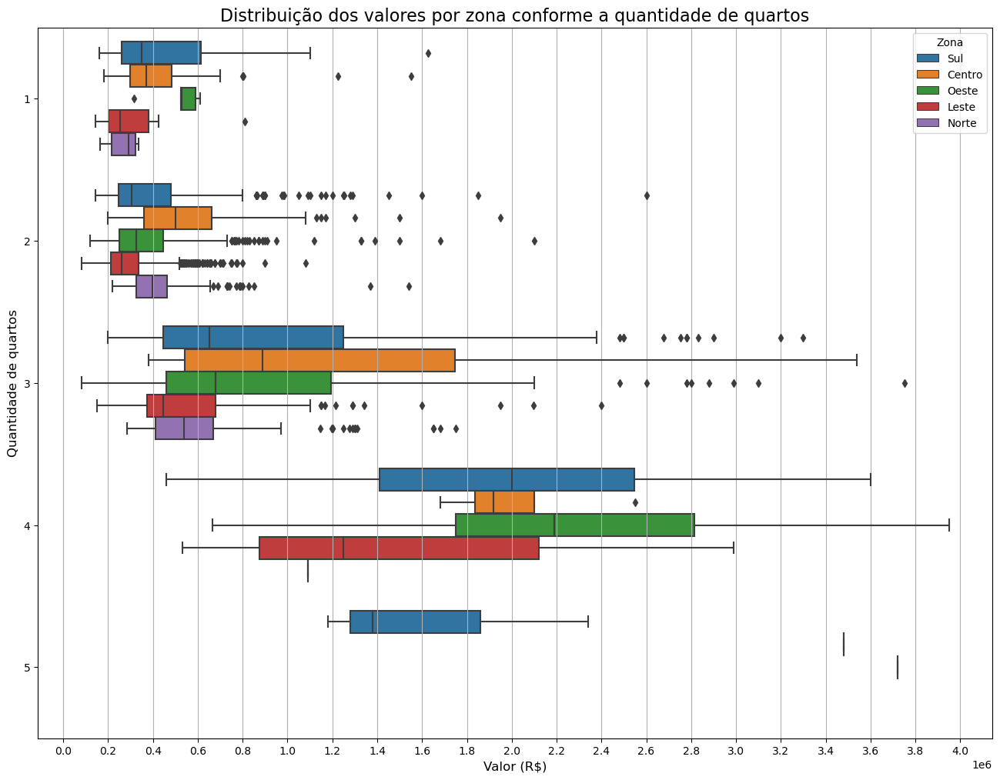

In [72]:
plt.figure(figsize=(16, 12))
ax = sns.boxplot(df, x='Valor', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição dos valores por zona conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Valor (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1))
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
ax.grid(axis='x')

#### Distribuição das áreas por zona conforme a quantidade de quartos

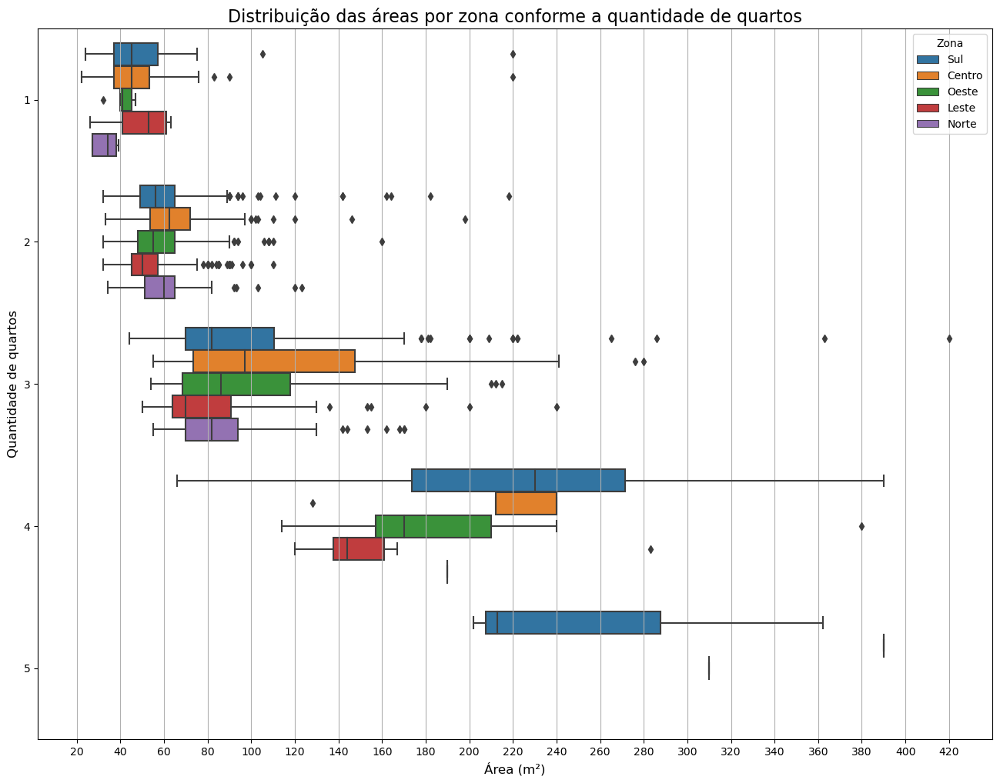

In [73]:
plt.figure(figsize=(16, 12))
ax = sns.boxplot(df, x='Área', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição das áreas por zona conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Área (m²)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1))
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20))
ax.grid(axis='x')

> <h4>Conclusões</h4>
>
> - A quantidade de quartos MAIS COMUM entre os apartamentos é 2 quartos - 1590 apartamentos
>
> - A quantidade de quartos MENOS COMUM entre os apartamentos é 5 quartos - 5 apartamentos
>
> - A quantidade de quartos mediana e modal dos apartamentos é igual - 2
>
> - A quantidade média de quartos é 2.275 quartos ~ 2 quartos
>
> - É perceptivel que no geral quanto MAIS quartos o apartamento tem, MAIS VALOR ele tem
>
> - É perceptivel que no geral quanto MAIS quartos o apartamento tem, MAIS ÁREA ele tem
>
> - A distribuição da quantidade de quartos dos apartamentos da Zona Leste se concentra muito em 2 quartos
>
> - Percebe-se que na distribuição dos valores por zona conforme a quantidade de quartos, em todas as quantidades de quartos as zonas Oeste, Sul e Centro possuem valores maiores que as zonas Norte e Leste

### Variável Condomínio

#### Distribuição dos valores condomínios

In [74]:
is_normal(df[df['Condomínio'].notna()]['Condomínio'])

Não segue uma normal


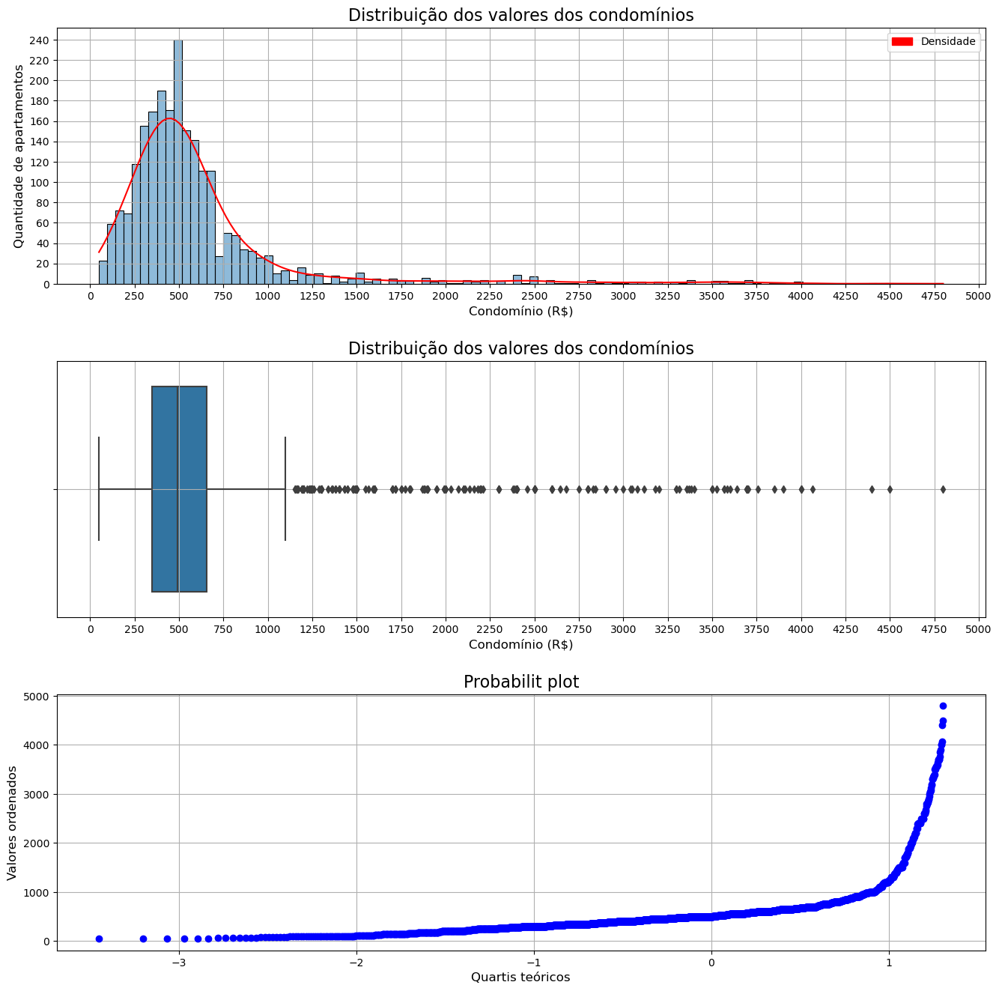

In [75]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(df, x='Condomínio', kde=True, ax=axes[0])
axes[0].set_title('Distribuição dos valores dos condomínios', fontsize=16)
axes[0].set_xlabel('Condomínio (R$)', fontsize=12)
axes[0].set_ylabel('Quantidade de apartamentos', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(df, x='Condomínio', ax=axes[1])
axes[1].set_title('Distribuição dos valores dos condomínios', fontsize=16)
axes[1].set_xlabel('Condomínio (R$)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=250))


(_, (_, _, _)) = probplot(df['Condomínio'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Obtendo as medidas de tendência central

In [76]:
print(f'O valor de condomínio médio é {price(df["Condomínio"].mean())}')
print(f'O valor de condomínio mediano é {price(df["Condomínio"].median())}')
print(f'O valor de condomínio modal é {price(df["Condomínio"].mode()[0])}')

O valor de condomínio médio é R$ 614,99
O valor de condomínio mediano é R$ 490,00
O valor de condomínio modal é R$ 500,00


#### Obtendo o desvio padrão

In [77]:
print(f'O desvio padrão é {price(df["Condomínio"].std())}')

O desvio padrão é R$ 553,50


#### Separando os valores dos condomínios em classes

In [78]:
valor_maximo = df['Condomínio'].max()
valor_maximo

4800.0

In [79]:
passo_classes = valor_maximo / 6
passo_classes

800.0

In [80]:
classes = {
    'range': [round(x, 2) for x in np.arange(0, valor_maximo + 1, passo_classes)],
    'label': [chr(x) for x in range(65, 71)]
}
classes

{'range': [0.0, 800.0, 1600.0, 2400.0, 3200.0, 4000.0, 4800.0],
 'label': ['A', 'B', 'C', 'D', 'E', 'F']}

In [81]:
condominio_por_classe = pd.value_counts(
    pd.cut(
        df['Condomínio'],
        classes['range'],
        labels=classes['label'],
    )
).to_frame()

condominio_por_classe.index.name = 'Classe'
condominio_por_classe.columns = ['Quantidade de apartamentos']

condominio_por_classe['Limites'] = pd.value_counts(
    pd.cut(
        df['Condomínio'],
        classes['range']    
    )
).to_frame().index

condominio_por_classe

,Quantidade de apartamentos,Limites
Classe,,
A,1884,"(0.0, 800.0]"
B,237,"(800.0, 1600.0]"
C,46,"(1600.0, 2400.0]"
D,31,"(2400.0, 3200.0]"
E,24,"(3200.0, 4000.0]"
F,4,"(4000.0, 4800.0]"


Text(0, 0.5, 'Quantidade de apartamentos')

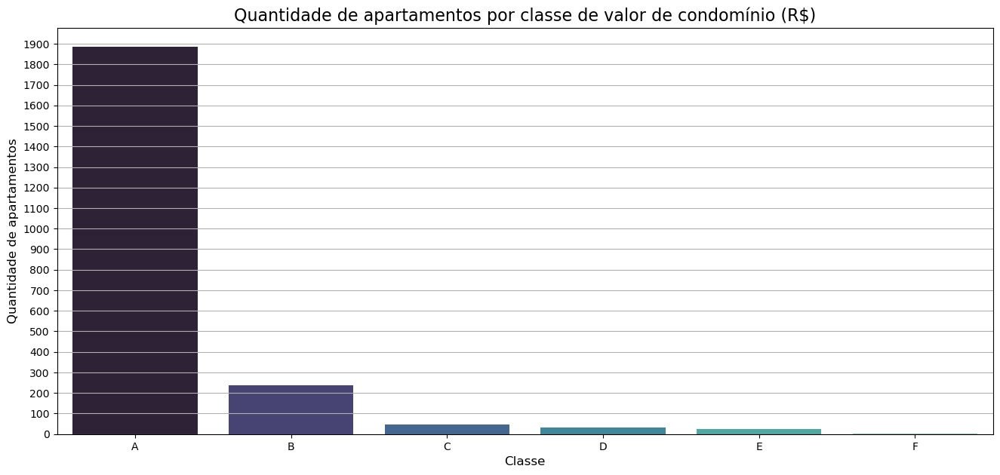

In [82]:
ax = sns.barplot(
    x=condominio_por_classe.index,
    y=condominio_por_classe['Quantidade de apartamentos'],
    palette='mako'
)
ax.grid(axis='y')
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=100))
ax.set_title('Quantidade de apartamentos por classe de valor de condomínio (R$)', fontsize=16)
ax.set_xlabel('Classe', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)

#### Relação entre o valor do apartamento e o valor do condomínio

In [83]:
df[['Valor', 'Condomínio']].corr().loc['Condomínio']['Valor']

0.8192011945998767

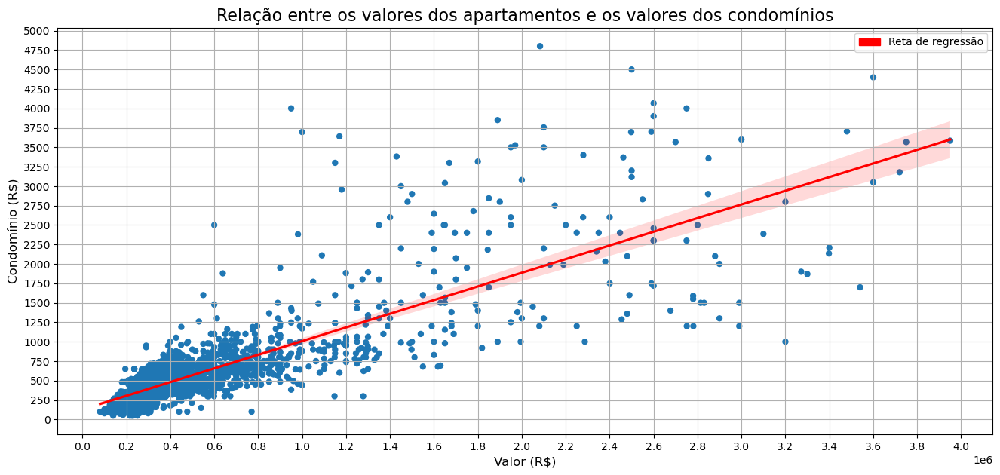

In [84]:
ax = sns.scatterplot(df, x='Valor', y='Condomínio', edgecolor='none')
sns.regplot(df, x='Valor', y='Condomínio', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre os valores dos apartamentos e os valores dos condomínios', fontsize=16)
ax.set_xlabel('Valor (R$)', fontsize=12)
ax.set_ylabel('Condomínio (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Rodando uma regressão linear para Valor e Condomínio

In [85]:
X = sm.add_constant(df[df['Condomínio'].notna()]['Valor'])
X.head()

,const,Valor
0,1.00,2083000
1,1.00,2500000
2,1.00,3600000
3,1.00,2600000
4,1.00,2750000


In [86]:
Y = df[df['Condomínio'].notna()]['Condomínio']
Y.head()

0   4800.00
1   4500.00
2   4400.00
3   4067.00
4   4000.00
Name: Condomínio, dtype: float64

In [87]:
reg_valor_condominio = sm.OLS(Y, X).fit()
print(reg_valor_condominio.summary())

                            OLS Regression Results                            
Dep. Variable:             Condomínio   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     4538.
Date:                Tue, 22 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:01:45   Log-Likelihood:                -15980.
No. Observations:                2226   AIC:                         3.196e+04
Df Residuals:                    2224   BIC:                         3.198e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        129.6610      9.859     13.152      0.0

#### Obtendo os parâmetros do modelo

In [88]:
b1, b2 = reg_valor_condominio.params

print(f'b1 = {b1}')
print(f'b2 = {b2}')

b1 = 129.6609622358511
b2 = 0.0008784832176305969


#### Obtendo o intervalo de confiança para os parâmetros

In [89]:
conf_int = reg_valor_condominio.conf_int(alpha=alpha)
conf_int.columns = ('Limite inferior', 'Limite superior')
conf_int.index = ('b1', 'b2')
conf_int

,Limite inferior,Limite superior
b1,110.33,148.99
b2,0.00,0.00


#### Obtendo os valores previstos

In [90]:
valor_condominio = df[df['Condomínio'].notna()][['Valor', 'Condomínio']]
valor_condominio['Condomínio previsto'] = reg_valor_condominio.predict()
valor_condominio

,Valor,Condomínio,Condomínio previsto
0,2083000,4800.00,1959.54
1,2500000,4500.00,2325.87
2,3600000,4400.00,3292.20
3,2600000,4067.00,2413.72
4,2750000,4000.00,2545.49
...,...,...,...
2221,250000,50.00,349.28
2222,230000,50.00,331.71
2223,224000,50.00,326.44
2224,215000,50.00,318.53


#### Teste de hipótese para nulidade do coeficiente angular

### $H_0: \beta_2 = 0$
### $H_1: \beta_2 \neq 0$

In [91]:
pvalue = reg_valor_condominio.pvalues[1]
pvalue

0.0

In [92]:
if pvalue <= alpha:
    print('O valor de B² não é 0')
else:
    print('O valor de B² é 0')

O valor de B² não é 0


#### Analisando os resíduos do modelo

In [93]:
reg_valor_condominio.resid

0      2840.46
1      2174.13
2      1107.80
3      1653.28
4      1454.51
         ...  
2221   -299.28
2222   -281.71
2223   -276.44
2224   -268.53
2225   -202.65
Length: 2226, dtype: float64

In [94]:
print(f'A média dos resíduos é {round(reg_valor_condominio.resid.mean(), 2)}')

A média dos resíduos é -0.0


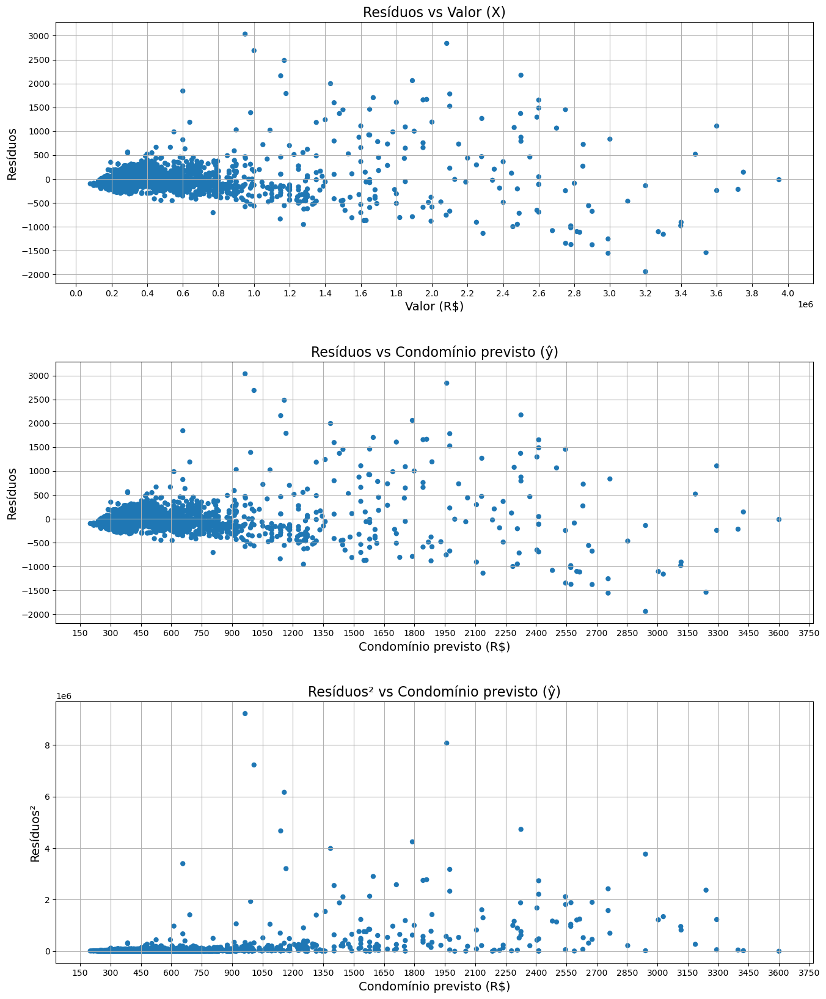

In [95]:
_, axes = plt.subplots(3, figsize=(16, 20))
plt.subplots_adjust(hspace=.3)

sns.scatterplot(valor_condominio, x='Valor', y=reg_valor_condominio.resid, edgecolor='none', ax=axes[0])
axes[0].set_title('Resíduos vs Valor (X)', fontsize=16)
axes[0].set_xlabel('Valor (R$)', fontsize=14)
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))

sns.scatterplot(valor_condominio, x='Condomínio previsto', y=reg_valor_condominio.resid, edgecolor='none', ax=axes[1])
axes[1].set_title('Resíduos vs Condomínio previsto (ŷ)', fontsize=16)
axes[1].set_xlabel('Condomínio previsto (R$)', fontsize=14)
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=150))

for i in range(2):
    axes[i].grid()
    axes[i].set_ylabel('Resíduos', fontsize=14)
    axes[i].yaxis.set_major_locator(ticker.MultipleLocator(base=5e2))

sns.scatterplot(valor_condominio, x='Condomínio previsto', y=reg_valor_condominio.resid ** 2, edgecolor='none', ax=axes[2])
axes[2].set_title('Resíduos² vs Condomínio previsto (ŷ)', fontsize=16)
axes[2].set_xlabel('Condomínio previsto (R$)', fontsize=14)
axes[2].set_ylabel('Resíduos²', fontsize=14)
axes[2].grid()
axes[2].xaxis.set_major_locator(ticker.MultipleLocator(base=150))

#### Verificando a normalidade dos resíduos

In [96]:
is_normal(reg_valor_condominio.resid)

Não segue uma normal


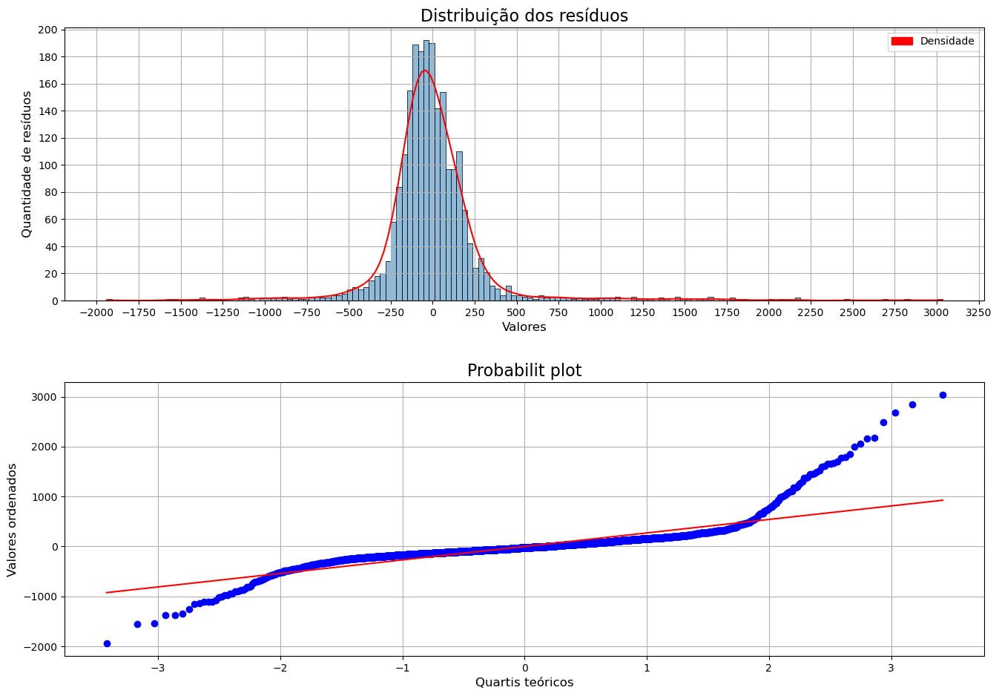

In [97]:
_, axes = plt.subplots(2, figsize=(16, 11))
plt.subplots_adjust(hspace=.3)

sns.histplot(reg_valor_condominio.resid, kde=True, ax=axes[0])
axes[0].set_title('Distribuição dos resíduos', fontsize=16)
axes[0].set_xlabel('Valores', fontsize=12)
axes[0].set_ylabel('Quantidade de resíduos', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

(_, (_, _, _)) = probplot(reg_valor_condominio.resid, plot=axes[1])
axes[1].set_title('Probabilit plot', fontsize=16)
axes[1].set_xlabel('Quartis teóricos', fontsize=12)
axes[1].set_ylabel('Valores ordenados', fontsize=12)
axes[1].grid()

#### Obtendo $R^2$ do modelo

In [98]:
reg_valor_condominio.rsquared

0.6710905972338661

#### Prevendo valores

#### Previsão para São Paulo em geral

In [99]:
def calcular_valor(valor: float):
    condominio_previsto = reg_valor_condominio.predict([1, valor])[0]

    print(f'No contexto da cidade de São Paulo, o valor do condomínio previsto para um apartamento que custa {price(valor)} é de {price(condominio_previsto)}')

calcular_valor(2.5e5)

No contexto da cidade de São Paulo, o valor do condomínio previsto para um apartamento que custa R$ 250.000,00 é de R$ 349,28


#### Previsão por zona

In [100]:
def calcular_condominio_por_valor_zona(valor: float):
    XY_zonas = {}

    print(f'Para um apartamento de {price(valor)}:\n')

    for zona in zonas:
        XY_zonas[zona] = {
            'X': sm.add_constant(df[df['Condomínio'].notna()].query(f'Zona == "{zona}"')['Valor']),
            'Y': df[df['Condomínio'].notna()].query(f'Zona == "{zona}"')['Condomínio']
        }


    for zona, zona_data in XY_zonas.items():
        model = sm.OLS(zona_data['Y'], zona_data['X']).fit()
        condominio_previsto = model.predict([1, valor])[0]

        if zona == 'Centro':
            print(f'{zona.upper()} - {price(condominio_previsto)}')
        else:
            print(f'ZONA {zona.upper()} - {price(condominio_previsto)}')

calcular_condominio_por_valor_zona(2.5e5)

Para um apartamento de R$ 250.000,00:

ZONA SUL - R$ 360,44
CENTRO - R$ 325,05
ZONA OESTE - R$ 387,42
ZONA LESTE - R$ 335,92
ZONA NORTE - R$ 423,24


#### Obtendo as medidas de tendência central para Valor em cada zona

In [101]:
tendencia_central_condominio_zona = df.groupby('Zona')['Condomínio'].agg(['mean', 'median', mode])
tendencia_central_condominio_zona.columns = ('Condomínio médio', 'Condomínio mediano', 'Condomínio modal')
tendencia_central_condominio_zona.sort_values('Condomínio médio', ascending=False, inplace=True)

tendencia_central_condominio_zona

,Condomínio médio,Condomínio mediano,Condomínio modal
Zona,,,
Sul,743.73,500.00,350.00
Centro,730.30,560.00,600.00
Oeste,708.94,531.00,500.00
Norte,581.35,545.00,450.00
Leste,425.67,400.00,450.00


#### Relação entre a área do apartamento e o valor do condomínio

In [102]:
df[['Área', 'Condomínio']].corr().loc['Condomínio']['Área']

0.8789097472266377

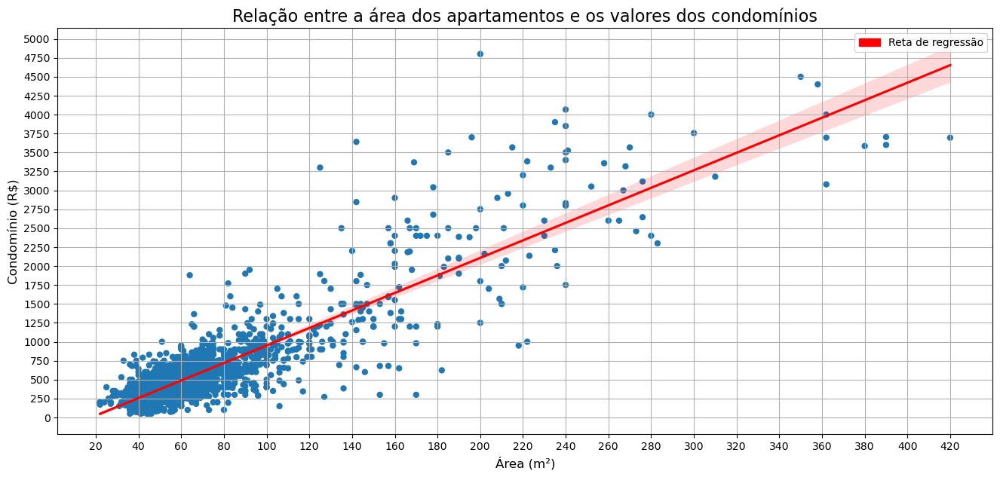

In [103]:
ax = sns.scatterplot(df, x='Área', y='Condomínio', edgecolor='none')
sns.regplot(df, x='Área', y='Condomínio', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre a área dos apartamentos e os valores dos condomínios', fontsize=16)
ax.set_xlabel('Área (m²)', fontsize=12)
ax.set_ylabel('Condomínio (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Rodando uma regressão linear para Valor e Condomínio

In [104]:
X = sm.add_constant(df[df['Condomínio'].notna()]['Área'])
X.head()

,const,Área
0,1.00,200
1,1.00,350
2,1.00,358
3,1.00,240
4,1.00,280


In [105]:
Y = df[df['Condomínio'].notna()]['Condomínio']
Y.head()

0   4800.00
1   4500.00
2   4400.00
3   4067.00
4   4000.00
Name: Condomínio, dtype: float64

In [106]:
reg_area_condominio = sm.OLS(Y, X).fit()
print(reg_area_condominio.summary())

                            OLS Regression Results                            
Dep. Variable:             Condomínio   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     7551.
Date:                Tue, 22 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:01:48   Log-Likelihood:                -15570.
No. Observations:                2226   AIC:                         3.114e+04
Df Residuals:                    2224   BIC:                         3.116e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -206.1318     10.983    -18.769      0.0

#### Obtendo os parâmetros do modelo

In [107]:
b1, b2 = reg_area_condominio.params

print(f'b1 = {b1}')
print(f'b2 = {b2}')

b1 = -206.13176650912115
b2 = 11.568919586622837


#### Obtendo o intervalo de confiança para os parâmetros

In [108]:
conf_int = reg_area_condominio.conf_int(alpha=alpha)
conf_int.columns = ('Limite inferior', 'Limite superior')
conf_int.index = ('b1', 'b2')
conf_int

,Limite inferior,Limite superior
b1,-227.67,-184.59
b2,11.31,11.83


#### Obtendo os valores previstos

In [109]:
area_condominio = df[df['Condomínio'].notna()][['Área', 'Condomínio']]
area_condominio['Condomínio previsto'] = reg_area_condominio.predict()
area_condominio

,Área,Condomínio,Condomínio previsto
0,200,4800.00,2107.65
1,350,4500.00,3842.99
2,358,4400.00,3935.54
3,240,4067.00,2570.41
4,280,4000.00,3033.17
...,...,...,...
2221,45,50.00,314.47
2222,44,50.00,302.90
2223,36,50.00,210.35
2224,41,50.00,268.19


#### Teste de hipótese para nulidade do coeficiente angular

### $H_0: \beta_2 = 0$
### $H_1: \beta_2 \neq 0$

In [110]:
pvalue = reg_area_condominio.pvalues[1]
pvalue

0.0

In [111]:
if pvalue <= alpha:
    print('O valor de B² não é 0')
else:
    print('O valor de B² é 0')

O valor de B² não é 0


#### Analisando os resíduos do modelo

In [112]:
reg_area_condominio.resid

0      2692.35
1       657.01
2       464.46
3      1496.59
4       966.83
         ...  
2221   -264.47
2222   -252.90
2223   -160.35
2224   -218.19
2225   -276.04
Length: 2226, dtype: float64

In [113]:
print(f'A média dos resíduos é {round(reg_area_condominio.resid.mean(), 2)}')

A média dos resíduos é 0.0


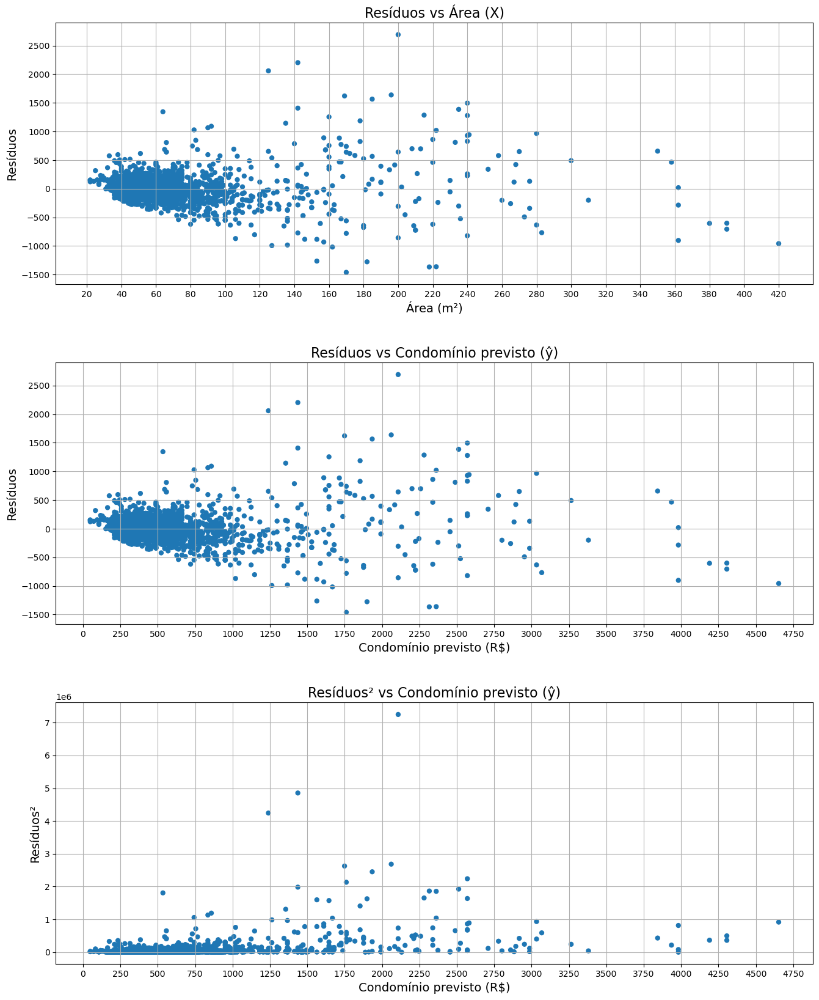

In [114]:
_, axes = plt.subplots(3, figsize=(16, 20))
plt.subplots_adjust(hspace=.3)

sns.scatterplot(area_condominio, x='Área', y=reg_area_condominio.resid, edgecolor='none', ax=axes[0])
axes[0].set_title('Resíduos vs Área (X)', fontsize=16)
axes[0].set_xlabel('Área (m²)', fontsize=14)
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=20))

sns.scatterplot(area_condominio, x='Condomínio previsto', y=reg_area_condominio.resid, edgecolor='none', ax=axes[1])
axes[1].set_title('Resíduos vs Condomínio previsto (ŷ)', fontsize=16)
axes[1].set_xlabel('Condomínio previsto (R$)', fontsize=14)
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=250))

for i in range(2):
    axes[i].grid()
    axes[i].set_ylabel('Resíduos', fontsize=14)
    axes[i].yaxis.set_major_locator(ticker.MultipleLocator(base=5e2))

sns.scatterplot(area_condominio, x='Condomínio previsto', y=reg_area_condominio.resid ** 2, edgecolor='none', ax=axes[2])
axes[2].set_title('Resíduos² vs Condomínio previsto (ŷ)', fontsize=16)
axes[2].set_xlabel('Condomínio previsto (R$)', fontsize=14)
axes[2].set_ylabel('Resíduos²', fontsize=14)
axes[2].grid()
axes[2].xaxis.set_major_locator(ticker.MultipleLocator(base=250))

#### Verificando a normalidade dos resíduos

In [115]:
is_normal(reg_area_condominio.resid)

Não segue uma normal


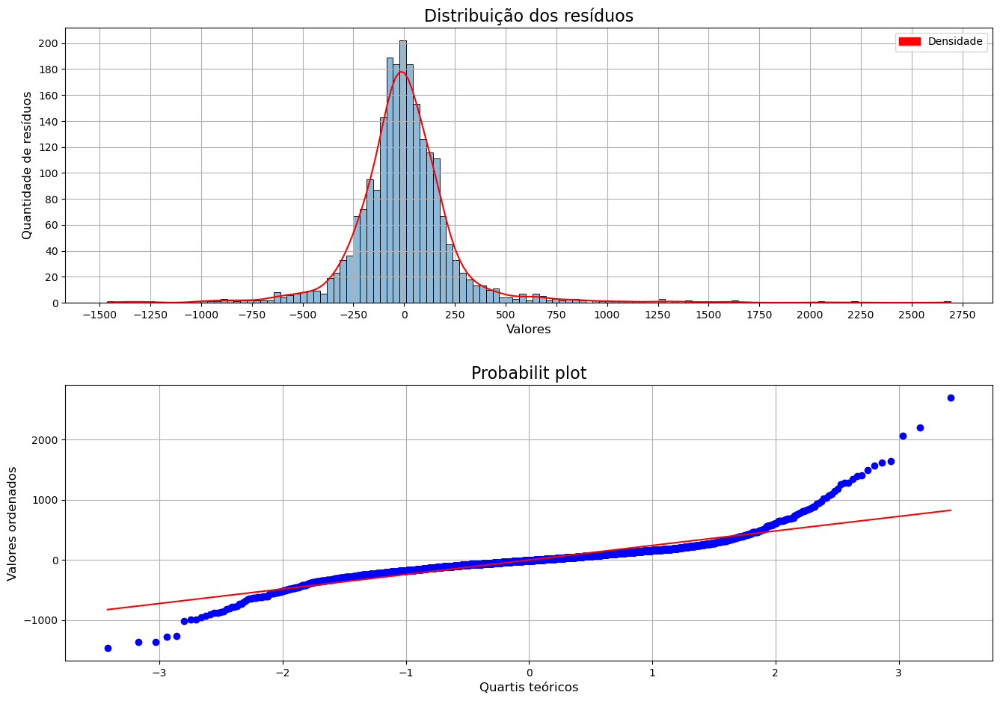

In [116]:
_, axes = plt.subplots(2, figsize=(16, 11))
plt.subplots_adjust(hspace=.3)

sns.histplot(reg_area_condominio.resid, kde=True, ax=axes[0])
axes[0].set_title('Distribuição dos resíduos', fontsize=16)
axes[0].set_xlabel('Valores', fontsize=12)
axes[0].set_ylabel('Quantidade de resíduos', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

(_, (_, _, _)) = probplot(reg_area_condominio.resid, plot=axes[1])
axes[1].set_title('Probabilit plot', fontsize=16)
axes[1].set_xlabel('Quartis teóricos', fontsize=12)
axes[1].set_ylabel('Valores ordenados', fontsize=12)
axes[1].grid()

#### Obtendo $R^2$ do modelo

In [117]:
reg_area_condominio.rsquared

0.772482343769996

#### Prevendo valores

#### Previsão para São Paulo em geral

In [118]:
def calcular_valor(area: float):
    condominio_previsto = reg_area_condominio.predict([1, area])[0]

    print(f'No contexto da cidade de São Paulo, o valor do condomínio previsto para um apartamento de {area}m² é de {price(condominio_previsto)}')

calcular_valor(60)

No contexto da cidade de São Paulo, o valor do condomínio previsto para um apartamento de 60m² é de R$ 488,00


#### Previsão por zona

In [119]:
def calcular_condominio_por_area_zona(area: float):
    XY_zonas = {}

    print(f'Para um apartamento de {area}m²:\n')

    for zona in zonas:
        XY_zonas[zona] = {
            'X': sm.add_constant(df[df['Condomínio'].notna()].query(f'Zona == "{zona}"')['Área']),
            'Y': df[df['Condomínio'].notna()].query(f'Zona == "{zona}"')['Condomínio']
        }


    for zona, zona_data in XY_zonas.items():
        model = sm.OLS(zona_data['Y'], zona_data['X']).fit()
        condominio_previsto = model.predict([1, area])[0]

        if zona == 'Centro':
            print(f'{zona.upper()} - {price(condominio_previsto)}')
        else:
            print(f'ZONA {zona.upper()} - {price(condominio_previsto)}')

calcular_condominio_por_area_zona(60)

Para um apartamento de 60m²:

ZONA SUL - R$ 507,21
CENTRO - R$ 582,71
ZONA OESTE - R$ 512,28
ZONA LESTE - R$ 428,88
ZONA NORTE - R$ 506,21


#### Distribuição do valor do condomínio conforme a quantidade de quartos

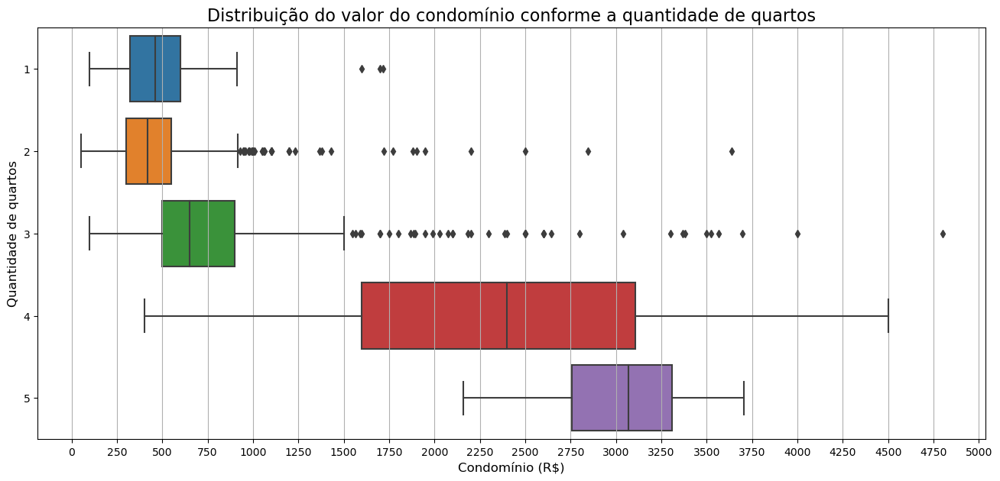

In [120]:
ax = sns.boxplot(df, x='Condomínio', y='Quartos', orient='h')

ax.set_title(f'Distribuição do valor do condomínio conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Condomínio (R$)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=250))
ax.grid(axis='x')

#### Distribuição do valor do condomínio por zona conforme a quantidade de quartos

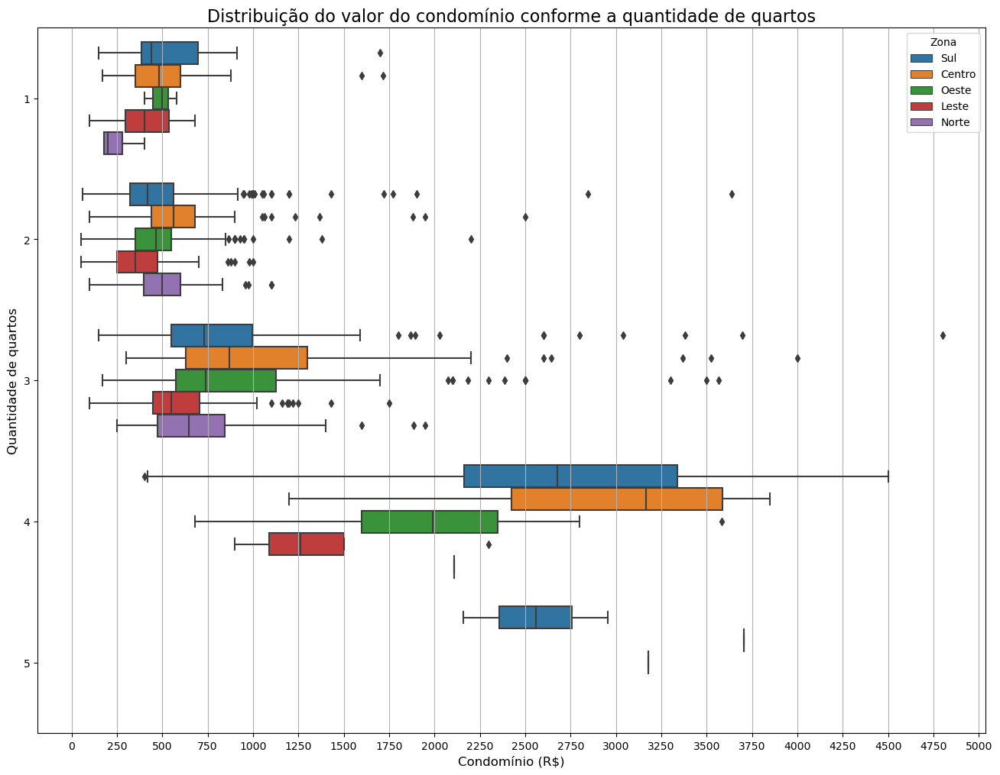

In [121]:
plt.figure(figsize=(16, 12))

ax = sns.boxplot(df, x='Condomínio', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição do valor do condomínio conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Condomínio (R$)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=250))
ax.grid(axis='x')

> <h4>Conclusões</h4>
>
> - A distribuição dos valores dos condomínios possui assimetria a direita
>
> - A MAIOR parte dos condomínios está na classe A (até R$800,00)
>
> - A MENOR parte dos condomínios está na classe F (de R$4000,00 até R$4800,00)
>
> - O coeficiente angular ($\beta_2$) da regressão linear entre Valor e Condomínio NÃO é 0
>
> - A distribuição dos resíduos da regressão linear entre Valor e Condomínio NÃO segue uma normal
>
> - O $R^2$ da regresão linear entre Valor e Condomínio é razoável - 0.67
>
> - A variância ($S$) dos resíduos ($u$) da regressão linear entre Valor e Condomínio não é a mesma para todos os valores de Valor ($X$)
>
> - A ZONA com o MAIOR preço de condomínio previsto para um apartamento de R$250.000,00 é a ZONA NORTE - R$423,24
>
> - A ZONA com o MENOR preço de condomínio previsto para um apartamento de R$250.000,00 é o CENTRO - R$325,05
>
> - O coeficiente angular ($\beta_2$) da regressão linear entre Área e Condomínio NÃO é 0
>
> - A distribuição dos resíduos da regressão linear entre Área e Condomínio NÃO segue uma normal
>
> - O $R^2$ da regresão linear entre Valor e Condomínio é satisfatório - 0.77
>
> - A variância ($S$) dos resíduos ($u$) da regressão linear entre Área e Condomínio não é a mesma para todos os valores de Valor ($X$)
>
> - A ZONA com o MAIOR preço de condomínio previsto para um apartamento de 60m² é o Centro - R$582,71
>
> - A ZONA com o MENOR preço de condomínio previsto para um apartamento de 60m² é a ZONA LESTE - R$428,88

### Variável Bairro

#### Quantidade de bairros no dataset

In [122]:
df['Bairro'].nunique()

89

#### Obtendo as medidas de tendência central

In [123]:
apartamentos_bairro = df['Bairro'].value_counts().to_frame()
apartamentos_bairro.columns = ['Quantidade de apartamentos']
apartamentos_bairro.head()

,Quantidade de apartamentos
Bairro,
CID LIDER,55
SANTA CECILIA,54
CAMPO GRANDE,49
REPUBLICA,46
SACOMA,43


In [124]:
print(f'A quantidade média de apartamentos é {round(apartamentos_bairro["Quantidade de apartamentos"].mean())}')
print(f'A quantidade mediana de apartamentos é {round(apartamentos_bairro["Quantidade de apartamentos"].median())}')
print(f'A quantidade modal de apartamentos é {apartamentos_bairro["Quantidade de apartamentos"].mode()[0]}')

A quantidade média de apartamentos é 28
A quantidade mediana de apartamentos é 29
A quantidade modal de apartamentos é 30


#### Distribuição das quantidades de apartamentos por bairro

In [125]:
is_normal(apartamentos_bairro["Quantidade de apartamentos"])

Segue uma normal


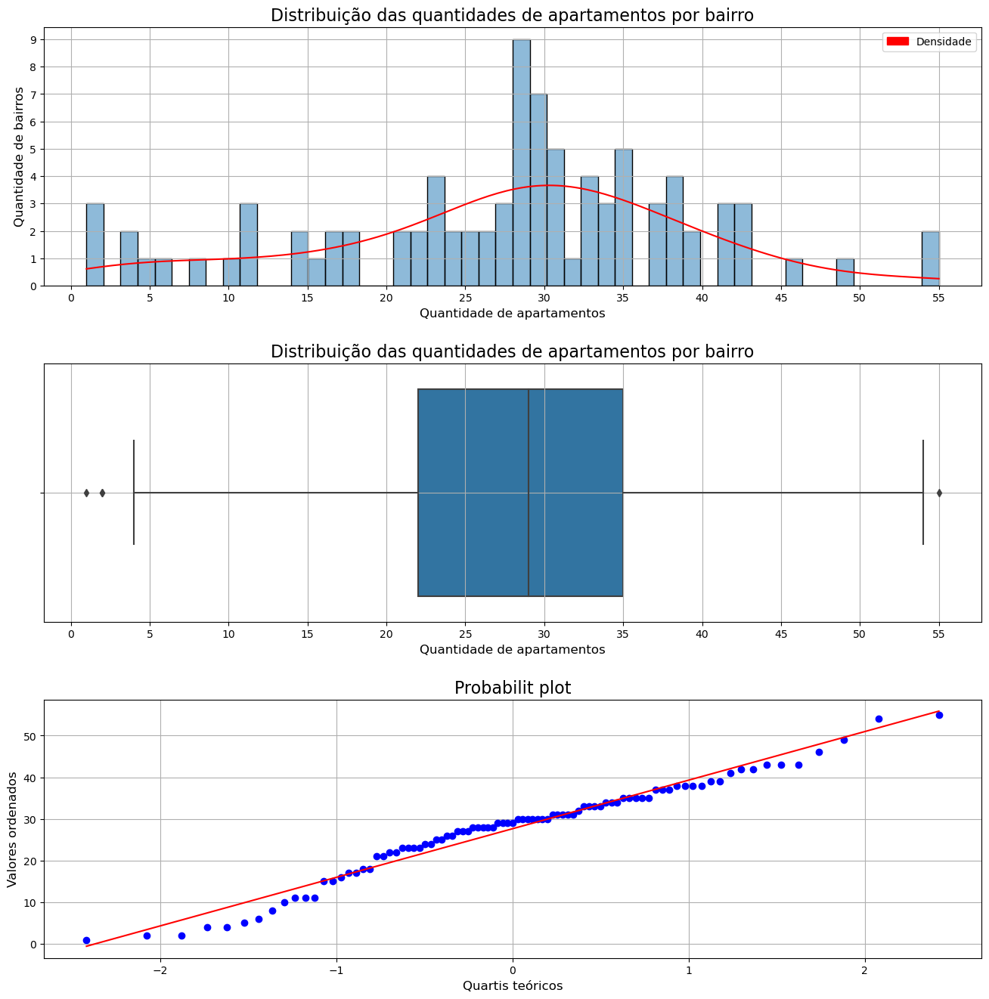

In [126]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(apartamentos_bairro, x='Quantidade de apartamentos', kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição das quantidades de apartamentos por bairro', fontsize=16)
axes[0].set_xlabel('Quantidade de apartamentos', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=1))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(apartamentos_bairro, x='Quantidade de apartamentos', ax=axes[1])
axes[1].set_title('Distribuição das quantidades de apartamentos por bairro', fontsize=16)
axes[1].set_xlabel('Quantidade de apartamentos', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=5))


(_, (_, _, _)) = probplot(apartamentos_bairro['Quantidade de apartamentos'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Os 15 bairros com mais apartamentos a venda

In [127]:
bairros_mais_comuns = df['Bairro'].value_counts().nlargest(15)
bairros_mais_comuns

Bairro
CID LIDER         55
SANTA CECILIA     54
CAMPO GRANDE      49
REPUBLICA         46
SACOMA            43
CID DUTRA         43
SAO LUCAS         43
SAO MATEUS        42
JOSE BONIFACIO    42
TATUAPE           41
VILA SONIA        39
RIO PEQUENO       39
LIMAO             38
VILA MEDEIROS     38
CID TIRADENTES    38
Name: count, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CID LIDER'),
  Text(1, 0, 'SANTA CECILIA'),
  Text(2, 0, 'CAMPO GRANDE'),
  Text(3, 0, 'REPUBLICA'),
  Text(4, 0, 'SACOMA'),
  Text(5, 0, 'CID DUTRA'),
  Text(6, 0, 'SAO LUCAS'),
  Text(7, 0, 'SAO MATEUS'),
  Text(8, 0, 'JOSE BONIFACIO'),
  Text(9, 0, 'TATUAPE'),
  Text(10, 0, 'VILA SONIA'),
  Text(11, 0, 'RIO PEQUENO'),
  Text(12, 0, 'LIMAO'),
  Text(13, 0, 'VILA MEDEIROS'),
  Text(14, 0, 'CID TIRADENTES')])

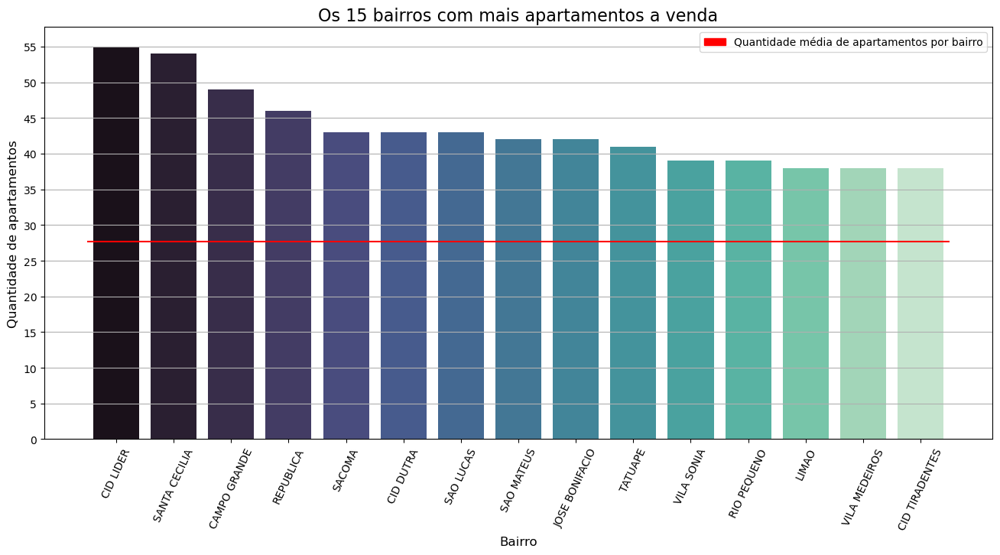

In [128]:
ax = sns.barplot(x=bairros_mais_comuns.index, y=bairros_mais_comuns.values, palette='mako')
ax.hlines(y=apartamentos_bairro.mean(), xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com mais apartamentos a venda', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Quantidade média de apartamentos por bairro'])
plt.xticks(rotation=65)

#### Distribuição dos valores médios por bairro

In [129]:
contagem_bairros = df['Bairro'].value_counts()
bairros_filtrados = contagem_bairros[contagem_bairros > 10].index

valor_bairro = df[df['Bairro'].isin(bairros_filtrados)].groupby('Bairro')['Valor'].mean()
valor_bairro.head()

Bairro
AGUA RASA            632800.03
ALTO DE PINHEIROS   1766566.67
ARICANDUVA           386945.79
ARTUR ALVIM          247103.77
BARRA FUNDA         1080058.82
Name: Valor, dtype: float64

In [130]:
is_normal(valor_bairro.values)

Não segue uma normal


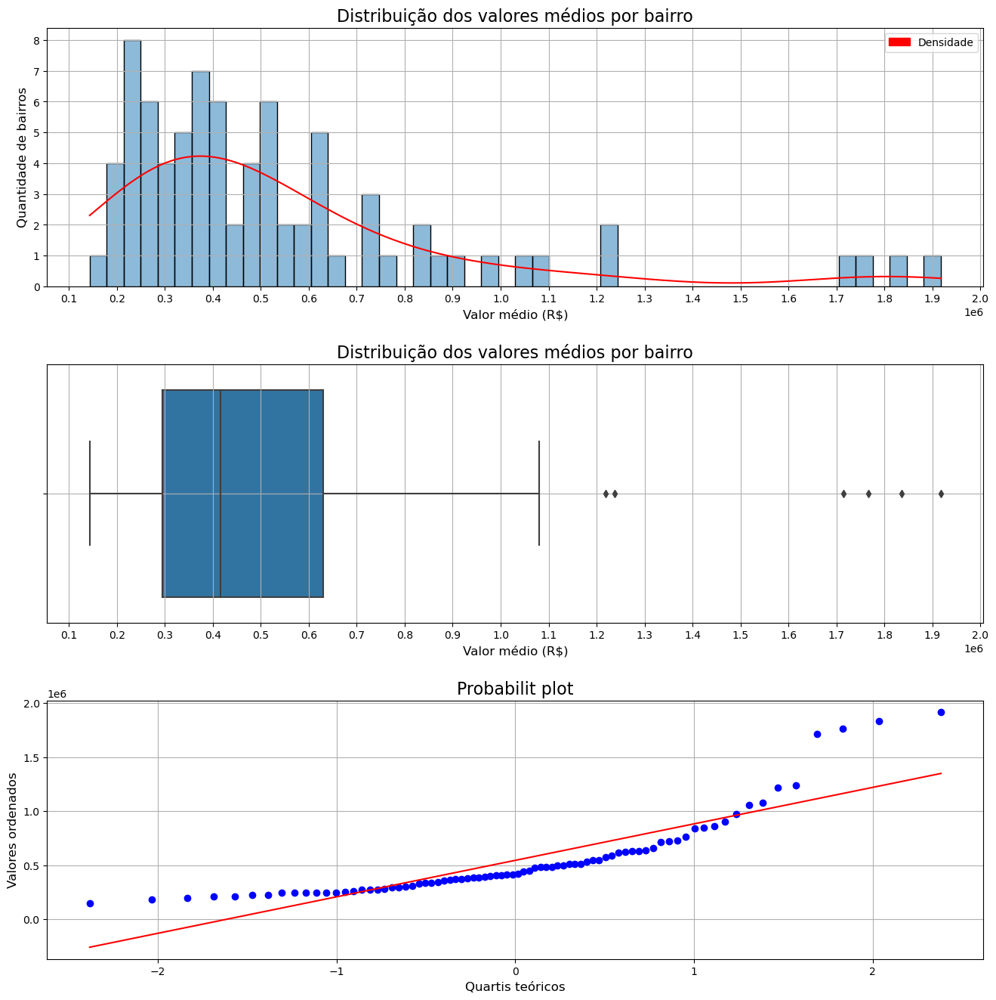

In [131]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=valor_bairro.values, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos valores médios por bairro', fontsize=16)
axes[0].set_xlabel('Valor médio (R$)', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=1))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=1e5))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=valor_bairro.values, ax=axes[1])
axes[1].set_title('Distribuição dos valores médios por bairro', fontsize=16)
axes[1].set_xlabel('Valor médio (R$)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=1e5))


(_, (_, _, _)) = probplot(valor_bairro.values, plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Os 15 bairros com os apartamentos mais caros em média

In [132]:
bairros_mais_caros = valor_bairro.nlargest(15)
bairros_mais_caros

Bairro
MOEMA               1918066.60
CAMPO BELO          1835498.06
ALTO DE PINHEIROS   1766566.67
PERDIZES            1715450.23
VILA MARIANA        1237458.48
VILA LEOPOLDINA     1218948.85
BARRA FUNDA         1080058.82
PARELHEIROS         1056400.00
CONSOLACAO           975344.65
SANTA CECILIA        903145.69
SANTO AMARO          860045.78
SANTANA              847595.72
VILA ANDRADE         837591.90
LAPA                 763379.93
TATUAPE              727114.54
Name: Valor, dtype: float64

In [133]:
valor_medio_bairro = valor_bairro.mean()
print(price(valor_medio_bairro))

R$ 543.986,83


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'MOEMA'),
  Text(1, 0, 'CAMPO BELO'),
  Text(2, 0, 'ALTO DE PINHEIROS'),
  Text(3, 0, 'PERDIZES'),
  Text(4, 0, 'VILA MARIANA'),
  Text(5, 0, 'VILA LEOPOLDINA'),
  Text(6, 0, 'BARRA FUNDA'),
  Text(7, 0, 'PARELHEIROS'),
  Text(8, 0, 'CONSOLACAO'),
  Text(9, 0, 'SANTA CECILIA'),
  Text(10, 0, 'SANTO AMARO'),
  Text(11, 0, 'SANTANA'),
  Text(12, 0, 'VILA ANDRADE'),
  Text(13, 0, 'LAPA'),
  Text(14, 0, 'TATUAPE')])

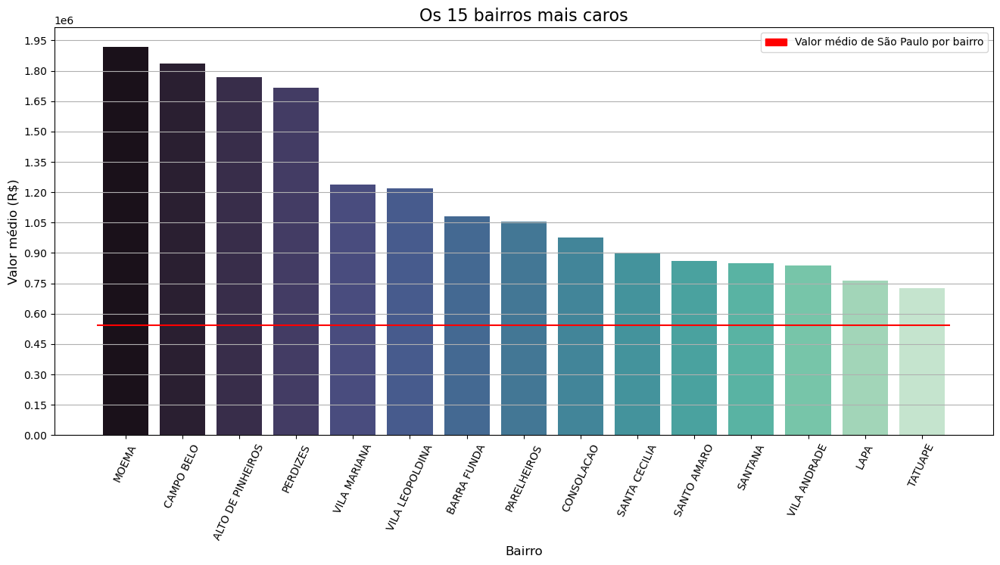

In [134]:
ax = sns.barplot(x=bairros_mais_caros.index, y=bairros_mais_caros.values, palette='mako')
ax.hlines(y=valor_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros mais caros', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Valor médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1.5e5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Os 15 bairros com os apartamentos mais baratos em média

In [135]:
bairros_mais_baratos = valor_bairro.nsmallest(15).sort_values(ascending=False)
bairros_mais_baratos

Bairro
JARAGUA           255582.76
SAO MATEUS        254852.62
ITAQUERA          247448.75
ARTUR ALVIM       247103.77
BRASILANDIA       247092.67
PEDREIRA          246786.67
PARQUE DO CARMO   242496.17
JARDIM ANGELA     241333.33
ITAIM PAULISTA    225508.04
JOSE BONIFACIO    225222.12
SAO MIGUEL        207798.18
GRAJAU            207444.44
GUAIANASES        192800.00
LAJEADO           182706.25
CID TIRADENTES    143035.55
Name: Valor, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'JARAGUA'),
  Text(1, 0, 'SAO MATEUS'),
  Text(2, 0, 'ITAQUERA'),
  Text(3, 0, 'ARTUR ALVIM'),
  Text(4, 0, 'BRASILANDIA'),
  Text(5, 0, 'PEDREIRA'),
  Text(6, 0, 'PARQUE DO CARMO'),
  Text(7, 0, 'JARDIM ANGELA'),
  Text(8, 0, 'ITAIM PAULISTA'),
  Text(9, 0, 'JOSE BONIFACIO'),
  Text(10, 0, 'SAO MIGUEL'),
  Text(11, 0, 'GRAJAU'),
  Text(12, 0, 'GUAIANASES'),
  Text(13, 0, 'LAJEADO'),
  Text(14, 0, 'CID TIRADENTES')])

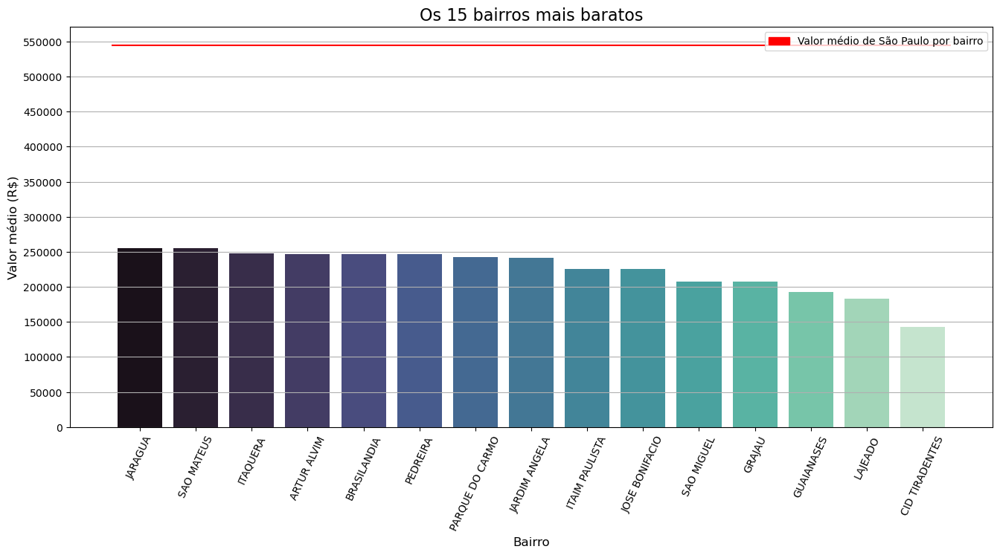

In [136]:
ax = sns.barplot(x=bairros_mais_baratos.index, y=bairros_mais_baratos.values, palette='mako')
ax.hlines(y=valor_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros mais baratos', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Valor médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5e4))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Distribuição das áreas médias por bairro

In [137]:
area_bairro = df[df['Bairro'].isin(bairros_filtrados)].groupby('Bairro')['Área'].mean()
area_bairro

Bairro
AGUA RASA            79.17
ALTO DE PINHEIROS   142.33
ARICANDUVA           63.17
ARTUR ALVIM          53.00
BARRA FUNDA          87.76
                     ...  
VILA MARIANA         96.00
VILA MATILDE         66.24
VILA MEDEIROS        63.97
VILA PRUDENTE        69.86
VILA SONIA           82.79
Name: Área, Length: 80, dtype: float64

In [138]:
is_normal(area_bairro.values)

Não segue uma normal


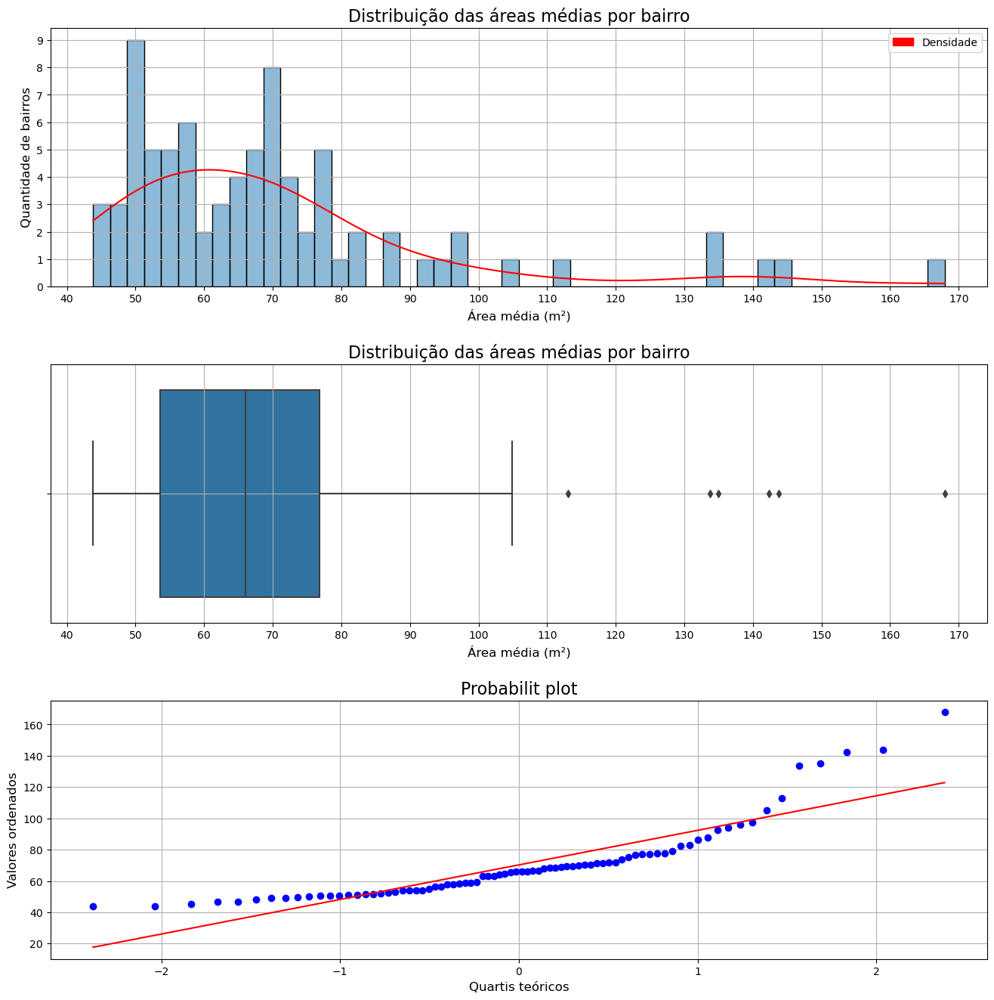

In [139]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=area_bairro.values, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição das áreas médias por bairro', fontsize=16)
axes[0].set_xlabel('Área média (m²)', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=1))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=10))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=area_bairro.values, ax=axes[1])
axes[1].set_title('Distribuição das áreas médias por bairro', fontsize=16)
axes[1].set_xlabel('Área média (m²)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=10))


(_, (_, _, _)) = probplot(area_bairro.values, plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Os 15 bairros com os maiores apartamentos em média

In [140]:
bairros_mais_area = area_bairro.nlargest(15)
bairros_mais_area

Bairro
CAMPO BELO          167.94
MOEMA               143.73
ALTO DE PINHEIROS   142.33
VILA ANDRADE        135.00
PERDIZES            133.73
PARELHEIROS         113.09
VILA LEOPOLDINA     104.94
SANTANA              97.24
VILA MARIANA         96.00
SANTA CECILIA        93.83
SANTO AMARO          92.63
BARRA FUNDA          87.76
CONSOLACAO           86.43
VILA SONIA           82.79
TATUAPE              82.63
Name: Área, dtype: float64

In [141]:
area_media_bairro = area_bairro.mean()

print(f'{area_media_bairro.round(2)}m²')

70.26m²


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAMPO BELO'),
  Text(1, 0, 'MOEMA'),
  Text(2, 0, 'ALTO DE PINHEIROS'),
  Text(3, 0, 'VILA ANDRADE'),
  Text(4, 0, 'PERDIZES'),
  Text(5, 0, 'PARELHEIROS'),
  Text(6, 0, 'VILA LEOPOLDINA'),
  Text(7, 0, 'SANTANA'),
  Text(8, 0, 'VILA MARIANA'),
  Text(9, 0, 'SANTA CECILIA'),
  Text(10, 0, 'SANTO AMARO'),
  Text(11, 0, 'BARRA FUNDA'),
  Text(12, 0, 'CONSOLACAO'),
  Text(13, 0, 'VILA SONIA'),
  Text(14, 0, 'TATUAPE')])

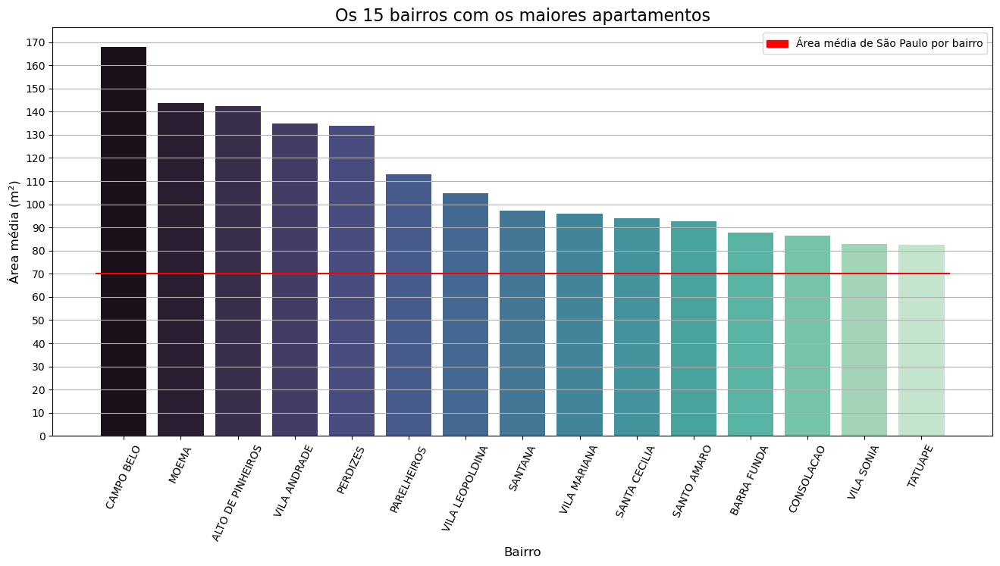

In [142]:
ax = sns.barplot(x=bairros_mais_area.index, y=bairros_mais_area.values, palette='mako')
ax.hlines(y=area_media_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com os maiores apartamentos', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Área média (m²)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=10))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Os 15 bairros com os menores apartamentos em média

In [143]:
bairros_menos_area = area_bairro.nsmallest(15).sort_values(ascending=False)
bairros_menos_area

Bairro
CAMPO LIMPO       51.10
SE                50.91
ITAIM PAULISTA    50.72
SOCORRO           50.68
CAPAO REDONDO     50.43
SAO MATEUS        50.05
JARAGUA           49.59
BRASILANDIA       49.10
JARDIM ANGELA     48.91
JOSE BONIFACIO    47.95
CID TIRADENTES    46.82
GUAIANASES        46.67
LAJEADO           45.38
PARQUE DO CARMO   44.04
SAO MIGUEL        43.82
Name: Área, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAMPO LIMPO'),
  Text(1, 0, 'SE'),
  Text(2, 0, 'ITAIM PAULISTA'),
  Text(3, 0, 'SOCORRO'),
  Text(4, 0, 'CAPAO REDONDO'),
  Text(5, 0, 'SAO MATEUS'),
  Text(6, 0, 'JARAGUA'),
  Text(7, 0, 'BRASILANDIA'),
  Text(8, 0, 'JARDIM ANGELA'),
  Text(9, 0, 'JOSE BONIFACIO'),
  Text(10, 0, 'CID TIRADENTES'),
  Text(11, 0, 'GUAIANASES'),
  Text(12, 0, 'LAJEADO'),
  Text(13, 0, 'PARQUE DO CARMO'),
  Text(14, 0, 'SAO MIGUEL')])

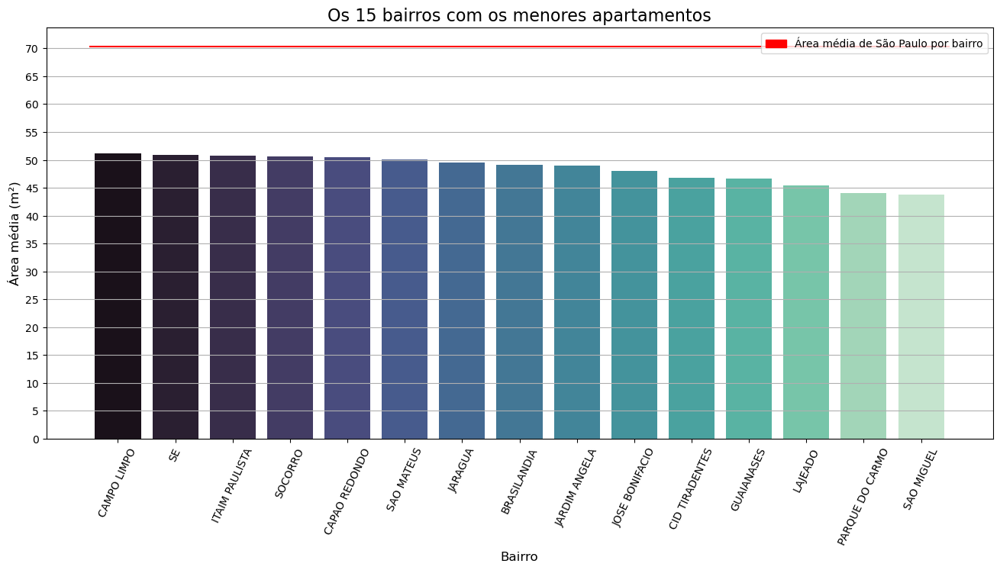

In [144]:
ax = sns.barplot(x=bairros_menos_area.index, y=bairros_menos_area.values, palette='mako')
ax.hlines(y=area_media_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com os menores apartamentos', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Área média (m²)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Distribuição dos valores médios de condomínio por bairro

In [145]:
condominio_bairro = df[df['Bairro'].isin(bairros_filtrados)].groupby('Bairro')['Condomínio'].mean()
condominio_bairro

Bairro
AGUA RASA            731.50
ALTO DE PINHEIROS   1953.37
ARICANDUVA           464.52
ARTUR ALVIM          190.74
BARRA FUNDA          782.65
                      ...  
VILA MARIANA         950.41
VILA MATILDE         502.67
VILA MEDEIROS        528.31
VILA PRUDENTE        537.19
VILA SONIA           648.17
Name: Condomínio, Length: 80, dtype: float64

In [146]:
is_normal(condominio_bairro.values)

Não segue uma normal


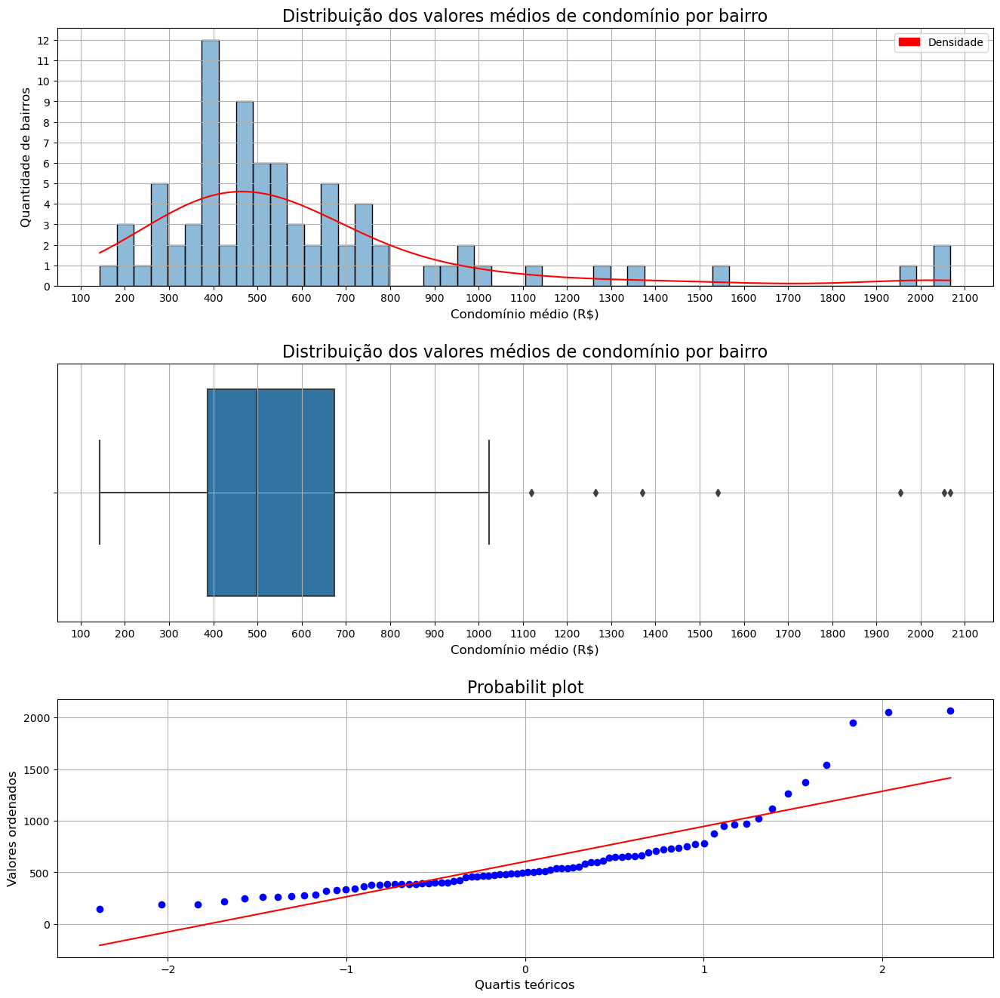

In [147]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=condominio_bairro.values, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos valores médios de condomínio por bairro', fontsize=16)
axes[0].set_xlabel('Condomínio médio (R$)', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=1))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=1e2))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=condominio_bairro.values, ax=axes[1])
axes[1].set_title('Distribuição dos valores médios de condomínio por bairro', fontsize=16)
axes[1].set_xlabel('Condomínio médio (R$)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=1e2))


(_, (_, _, _)) = probplot(condominio_bairro.values, plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Os 15 bairros com os maiores condomínios em média

In [148]:
bairros_condominio_mais_caro = condominio_bairro.nlargest(15)
bairros_condominio_mais_caro

Bairro
CAMPO BELO          2067.47
MOEMA               2052.71
ALTO DE PINHEIROS   1953.37
PERDIZES            1540.45
PARELHEIROS         1371.10
VILA ANDRADE        1264.67
CONSOLACAO          1120.14
SANTA CECILIA       1022.91
VILA LEOPOLDINA      969.97
SANTANA              967.27
VILA MARIANA         950.41
SANTO AMARO          875.00
BARRA FUNDA          782.65
BELA VISTA           774.61
CURSINO              749.81
Name: Condomínio, dtype: float64

In [149]:
condominio_medio_bairro = condominio_bairro.mean()

print(price(condominio_medio_bairro))

R$ 604,73


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAMPO BELO'),
  Text(1, 0, 'MOEMA'),
  Text(2, 0, 'ALTO DE PINHEIROS'),
  Text(3, 0, 'PERDIZES'),
  Text(4, 0, 'PARELHEIROS'),
  Text(5, 0, 'VILA ANDRADE'),
  Text(6, 0, 'CONSOLACAO'),
  Text(7, 0, 'SANTA CECILIA'),
  Text(8, 0, 'VILA LEOPOLDINA'),
  Text(9, 0, 'SANTANA'),
  Text(10, 0, 'VILA MARIANA'),
  Text(11, 0, 'SANTO AMARO'),
  Text(12, 0, 'BARRA FUNDA'),
  Text(13, 0, 'BELA VISTA'),
  Text(14, 0, 'CURSINO')])

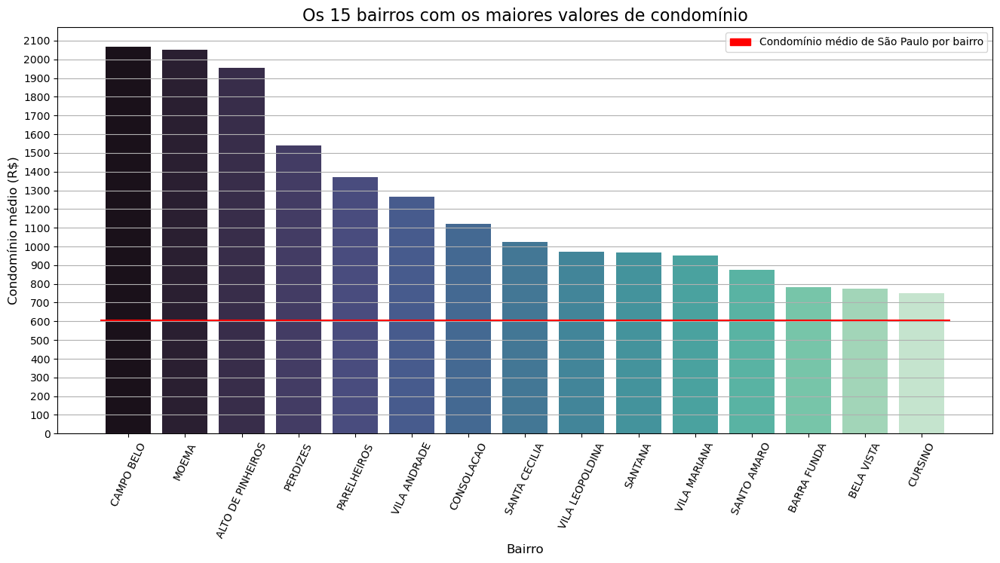

In [150]:
ax = sns.barplot(x=bairros_condominio_mais_caro.index, y=bairros_condominio_mais_caro.values, palette='mako')
ax.hlines(y=condominio_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com os maiores valores de condomínio', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Condomínio médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1e2))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Condomínio médio de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Os 15 bairros com os menores condomínios em média

In [151]:
bairros_condominio_mais_barato = condominio_bairro.nsmallest(15).sort_values(ascending=False)
bairros_condominio_mais_barato

Bairro
CID DUTRA         363.38
GUAIANASES        341.38
CAPAO REDONDO     335.88
PEDREIRA          327.69
SAO MATEUS        318.58
ITAQUERA          282.55
LAJEADO           273.46
JARAGUA           267.79
JOSE BONIFACIO    260.34
ITAIM PAULISTA    259.92
PARQUE DO CARMO   245.06
SAO MIGUEL        216.44
GRAJAU            191.21
ARTUR ALVIM       190.74
CID TIRADENTES    143.07
Name: Condomínio, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CID DUTRA'),
  Text(1, 0, 'GUAIANASES'),
  Text(2, 0, 'CAPAO REDONDO'),
  Text(3, 0, 'PEDREIRA'),
  Text(4, 0, 'SAO MATEUS'),
  Text(5, 0, 'ITAQUERA'),
  Text(6, 0, 'LAJEADO'),
  Text(7, 0, 'JARAGUA'),
  Text(8, 0, 'JOSE BONIFACIO'),
  Text(9, 0, 'ITAIM PAULISTA'),
  Text(10, 0, 'PARQUE DO CARMO'),
  Text(11, 0, 'SAO MIGUEL'),
  Text(12, 0, 'GRAJAU'),
  Text(13, 0, 'ARTUR ALVIM'),
  Text(14, 0, 'CID TIRADENTES')])

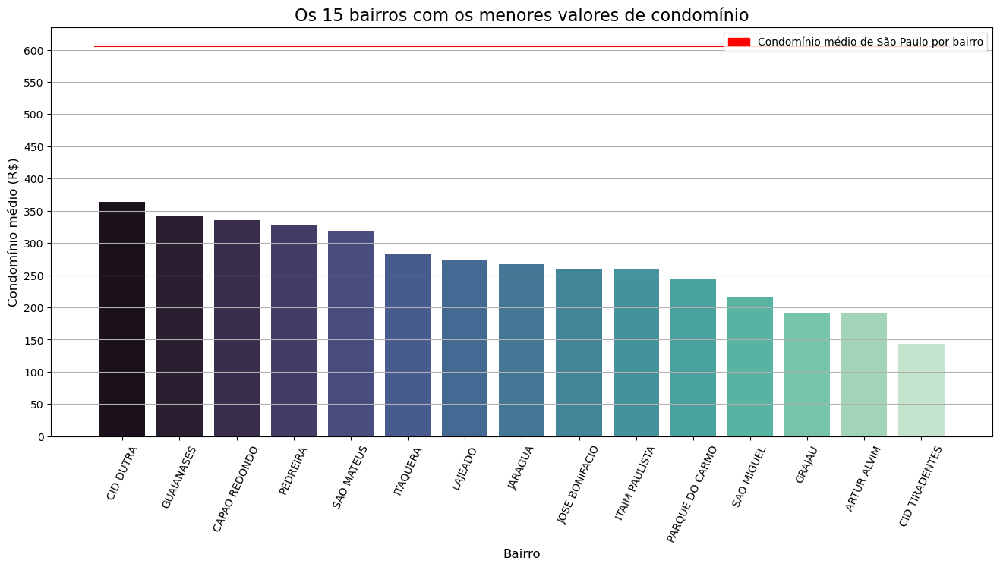

In [152]:
ax = sns.barplot(x=bairros_condominio_mais_barato.index, y=bairros_condominio_mais_barato.values, palette='mako')
ax.hlines(y=condominio_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com os menores valores de condomínio', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Condomínio médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=50))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Condomínio médio de São Paulo por bairro'])
plt.xticks(rotation=65)

> <h4>Conclusões</h4>
>
> - A distribuição da quantidade de apartamentos a venda por bairro segue uma normal
>
> - O valor médio por bairro é R$543.986,83
>
> - O bairro com MAIS apartamentos a venda é Cidade Lider
>
> - O bairro MAIS CARO em média é Moema - R$1.918.066,60
>
> - O bairro MAIS BARATO em média é Cidade Tiradentes - R$143.035,55
>
> - A área média por bairro é 70.26m²
>
> - O bairro com os MAIORES apartamentos em média é Campo Belo - 167,94m²
>
> - O bairro com os MENORES apartamentos em média é São Miguel - 43,82m²
>
> - O condomínio médio por bairro é R$604,73
>
> - O bairro com os MAIORES condomínios em média é Campo Belo - R$2.067,47
>
> - O bairro com os MENORES apartamentos em média é Cidade Tiradentes - R$143,07

### Variável Média IDH

#### Distribuição dos valores de IDH por bairro

In [153]:
is_normal(df['Média IDH'])

Não segue uma normal


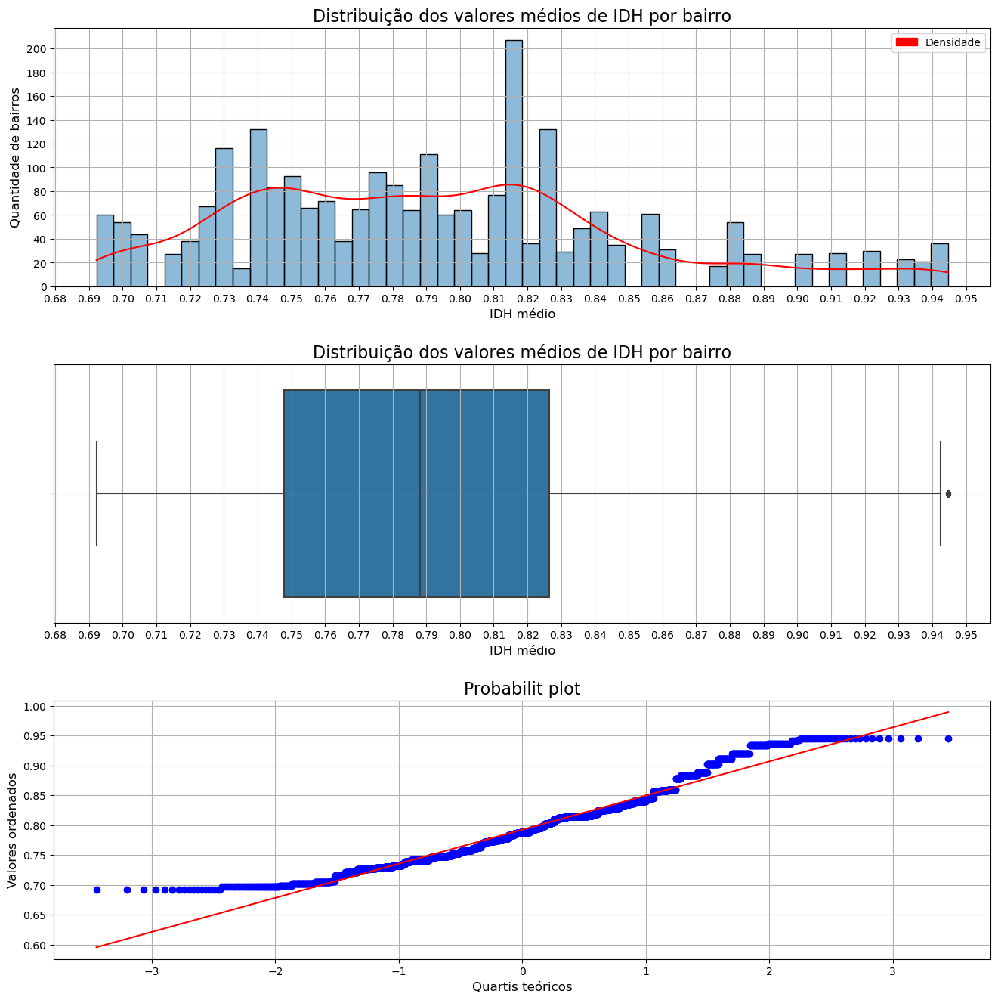

In [154]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=df['Média IDH'], kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos valores médios de IDH por bairro', fontsize=16)
axes[0].set_xlabel('IDH médio', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=df['Média IDH'], ax=axes[1])
axes[1].set_title('Distribuição dos valores médios de IDH por bairro', fontsize=16)
axes[1].set_xlabel('IDH médio', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=.01))


(_, (_, _, _)) = probplot(df['Média IDH'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Obtendo as medidas de tendência central

In [155]:
print(f'O IDH médio é {df["Média IDH"].mean().round(4)}')
print(f'O IDH mediano é {df["Média IDH"].median().round(4)}')
print(f'O IDH modal é {df["Média IDH"].mode()[0].round(4)}')

O IDH médio é 0.7925
O IDH mediano é 0.7882
O IDH modal é 0.8397


#### Obtendo o desvio padrão

In [156]:
print(f'O desvio padrão é {df["Média IDH"].std().round(4)}')

O desvio padrão é 0.058


#### Separando os IDH's em classes

In [157]:
idh_maximo = df['Média IDH'].max()
idh_maximo

0.944666666666667

In [158]:
idh_minimo = df['Média IDH'].min()
idh_minimo

0.692258064516129

In [159]:
passo_classes = (idh_maximo - idh_minimo) / 5
passo_classes

0.05048172043010759

In [160]:
classes = {
    'range': [round(x, 2) for x in np.arange(idh_minimo, idh_maximo + .01, passo_classes)],
    'label': [chr(x) for x in range(65, 70)]
}
classes

{'range': [0.69, 0.74, 0.79, 0.84, 0.89, 0.94],
 'label': ['A', 'B', 'C', 'D', 'E']}

In [161]:
idh_por_classe = pd.value_counts(
    pd.cut(
        df.groupby('Bairro')['Média IDH'].mean(),
        classes['range'],
        labels=classes['label'],
    )
).to_frame()

idh_por_classe.index.name = 'Classe'
idh_por_classe.columns = ['Quantidade de bairros']

idh_por_classe['Limites'] = pd.value_counts(
    pd.cut(
        df.groupby('Bairro')['Média IDH'].mean(),
        classes['range']    
    )
).to_frame().index

idh_por_classe

,Quantidade de bairros,Limites
Classe,,
B,30,"(0.74, 0.79]"
C,26,"(0.79, 0.84]"
A,18,"(0.69, 0.74]"
D,7,"(0.84, 0.89]"
E,5,"(0.89, 0.94]"


Text(0, 0.5, 'Quantidade de bairros')

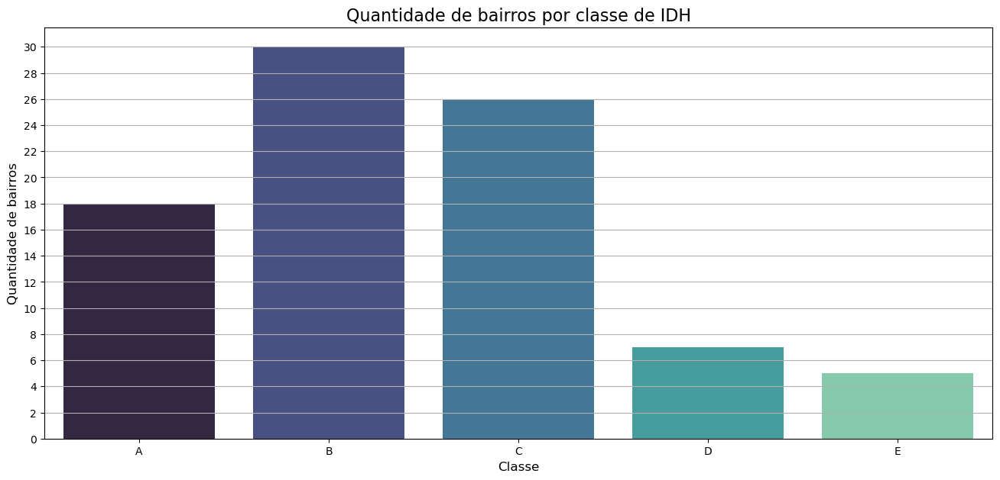

In [162]:
ax = sns.barplot(
    x=idh_por_classe.index,
    y=idh_por_classe['Quantidade de bairros'],
    palette='mako'
)
ax.grid(axis='y')
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=2))
ax.set_title('Quantidade de bairros por classe de IDH', fontsize=16)
ax.set_xlabel('Classe', fontsize=12)
ax.set_ylabel('Quantidade de bairros', fontsize=12)

#### Relação entre o IDH médio e a zona de São Paulo

In [163]:
tendencia_central_idh_zona = df.groupby('Zona')['Média IDH'].agg(['mean', 'median', mode])
tendencia_central_idh_zona.columns = ('IDH médio', 'IDH mediano', 'IDH modal')
tendencia_central_idh_zona.sort_values('IDH médio', ascending=False, inplace=True)

tendencia_central_idh_zona

,IDH médio,IDH mediano,IDH modal
Zona,,,
Centro,0.84,0.84,0.84
Oeste,0.80,0.77,0.77
Norte,0.80,0.81,0.73
Sul,0.80,0.79,0.81
Leste,0.77,0.76,0.78


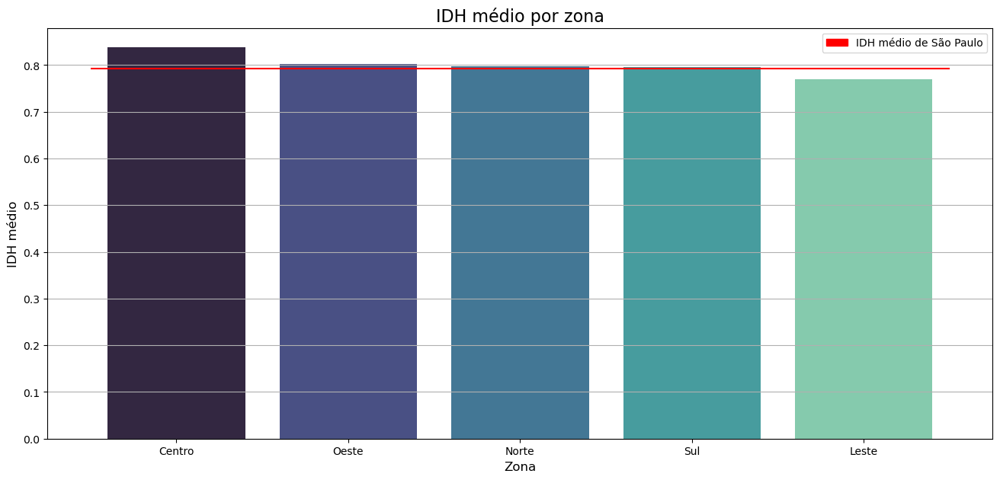

In [164]:
ax = sns.barplot(
    x=tendencia_central_idh_zona.index,
    y=tendencia_central_idh_zona['IDH médio'],
    palette='mako'
)

ax.set_title('IDH médio por zona', fontsize=16)
ax.set_xlabel('Zona', fontsize=12)
ax.set_ylabel('IDH médio', fontsize=12)
ax.hlines(y=df["Média IDH"].mean(), xmin=-.5, xmax=4.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['IDH médio de São Paulo'])
ax.grid(axis='y')

#### Distribuição dos valores de IDH dos bairros por zona

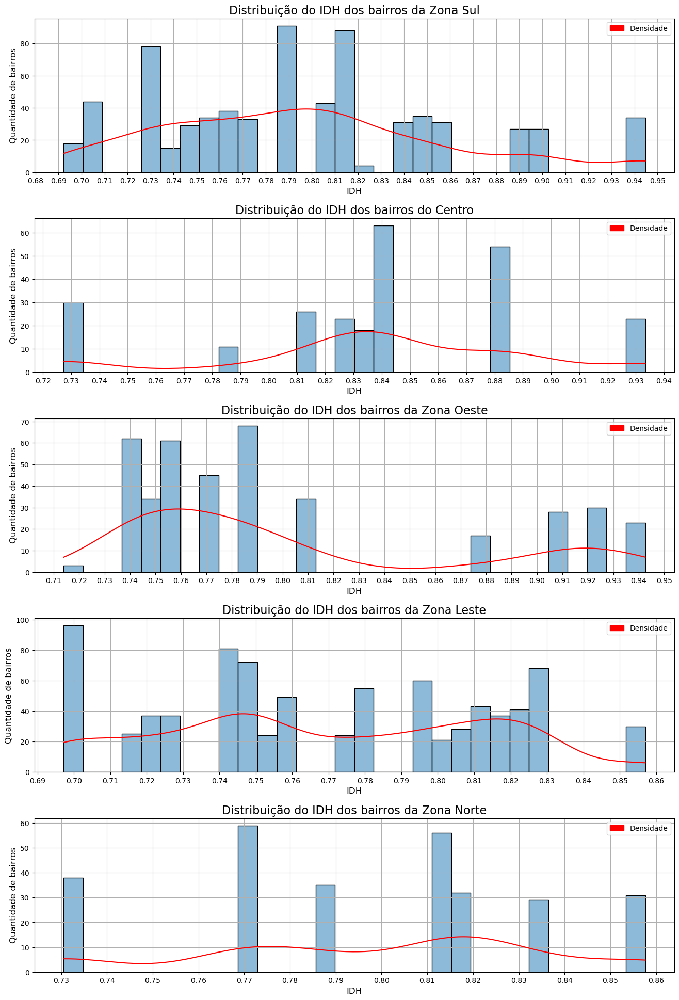

In [165]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    sns.histplot(df.query(f'Zona == "{zona}"')['Média IDH'], kde=True, ax=axes[i], bins=30)

    if zona == 'Centro':
        axes[i].set_title(f'Distribuição do IDH dos bairros do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Distribuição do IDH dos bairros da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('IDH', fontsize=12)
    axes[i].set_ylabel('Quantidade de bairros', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

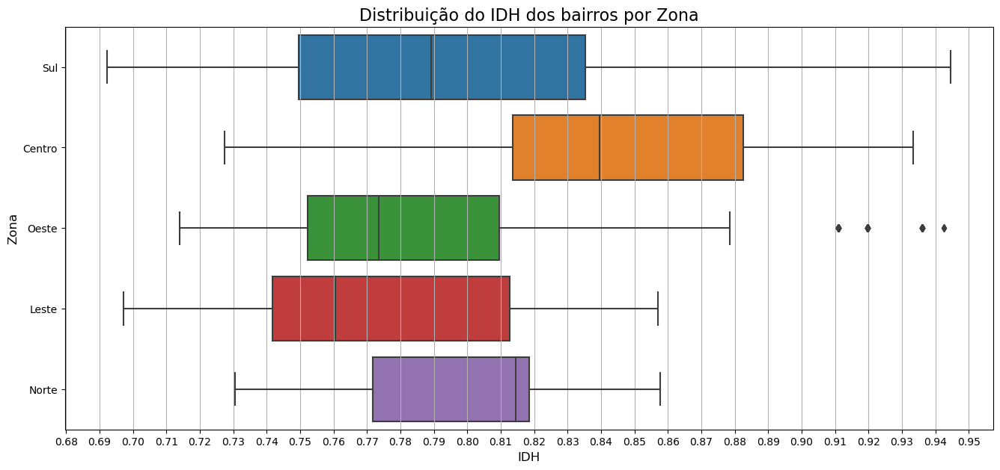

In [166]:
ax = sns.boxplot(df, x='Média IDH', y='Zona')

ax.set_title(f'Distribuição do IDH dos bairros por Zona', fontsize=16)
ax.set_ylabel('Zona', fontsize=12)
ax.set_xlabel('IDH', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.grid(axis='x')

#### Distribuição do IDH dos bairros por zona conforme a quantidade de quartos

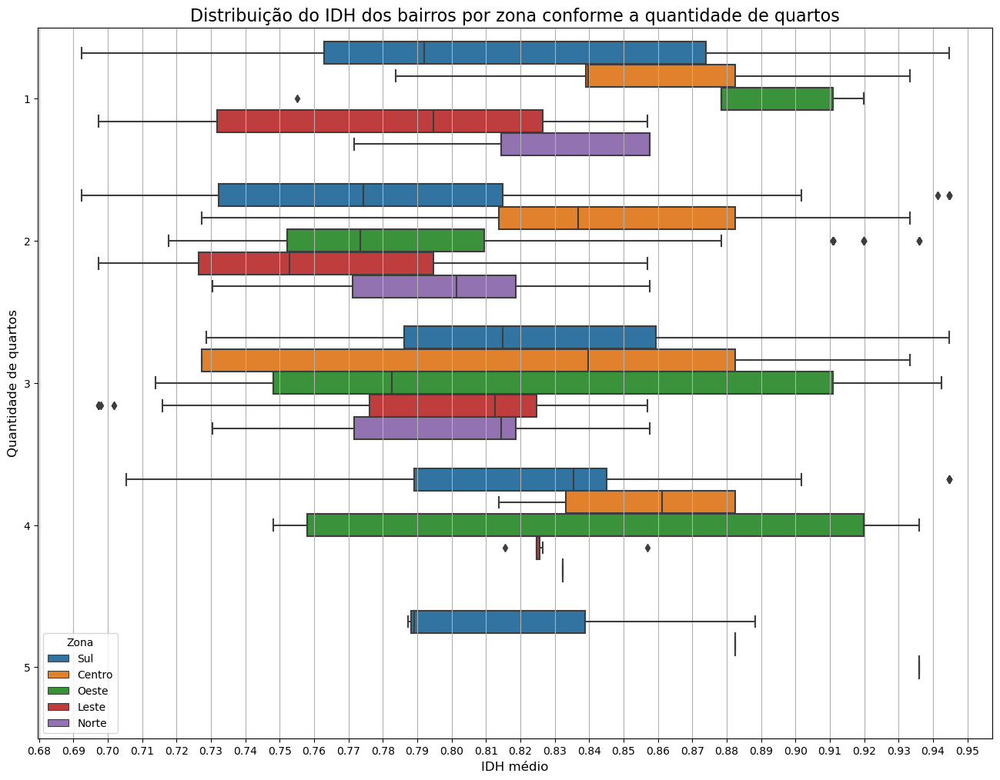

In [167]:
plt.figure(figsize=(16, 12))

ax = sns.boxplot(df, x='Média IDH', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição do IDH dos bairros por zona conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('IDH médio', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.grid(axis='x')

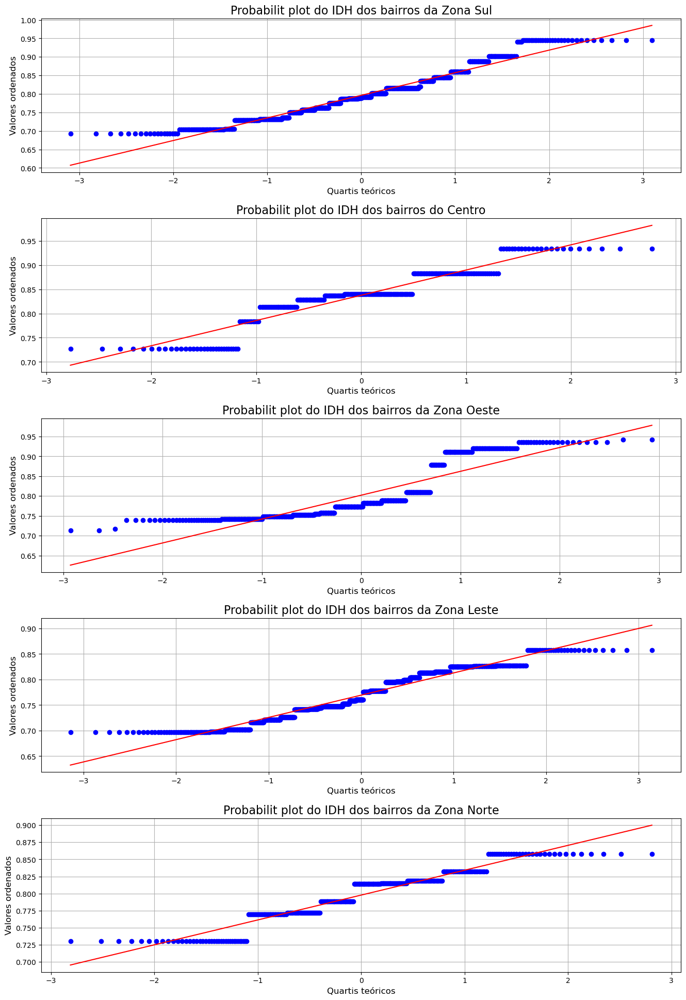

In [168]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    (_, (_, _, _)) = probplot(df.query(f'Zona == "{zona}"')['Média IDH'], plot=axes[i])

    if zona == 'Centro':
        axes[i].set_title(f'Probabilit plot do IDH dos bairros do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Probabilit plot do IDH dos bairros da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### IDH médio por bairro

In [169]:
idh_bairro = df.groupby('Bairro')['Média IDH'].mean()
idh_bairro

Bairro
AGUA RASA           0.83
ALTO DE PINHEIROS   0.94
ANHANGUERA          0.71
ARICANDUVA          0.78
ARTUR ALVIM         0.76
                    ... 
VILA MARIANA        0.90
VILA MATILDE        0.82
VILA MEDEIROS       0.73
VILA PRUDENTE       0.80
VILA SONIA          0.81
Name: Média IDH, Length: 89, dtype: float64

#### Os 15 bairros com maior IDH

In [170]:
bairros_idh_mais_alto = idh_bairro.nlargest(15)
bairros_idh_mais_alto

Bairro
MOEMA               0.94
PINHEIROS           0.94
JARDIM PAULISTA     0.94
ALTO DE PINHEIROS   0.94
CONSOLACAO          0.93
PERDIZES            0.92
LAPA                0.91
VILA MARIANA        0.90
SANTO AMARO         0.89
SANTA CECILIA       0.88
BUTANTA             0.88
SOCORRO             0.86
TUCURUVI            0.86
MOOCA               0.86
SAUDE               0.85
Name: Média IDH, dtype: float64

In [171]:
idh_medio_bairro = idh_bairro.mean()

idh_medio_bairro

0.793307304839589

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'MOEMA'),
  Text(1, 0, 'PINHEIROS'),
  Text(2, 0, 'JARDIM PAULISTA'),
  Text(3, 0, 'ALTO DE PINHEIROS'),
  Text(4, 0, 'CONSOLACAO'),
  Text(5, 0, 'PERDIZES'),
  Text(6, 0, 'LAPA'),
  Text(7, 0, 'VILA MARIANA'),
  Text(8, 0, 'SANTO AMARO'),
  Text(9, 0, 'SANTA CECILIA'),
  Text(10, 0, 'BUTANTA'),
  Text(11, 0, 'SOCORRO'),
  Text(12, 0, 'TUCURUVI'),
  Text(13, 0, 'MOOCA'),
  Text(14, 0, 'SAUDE')])

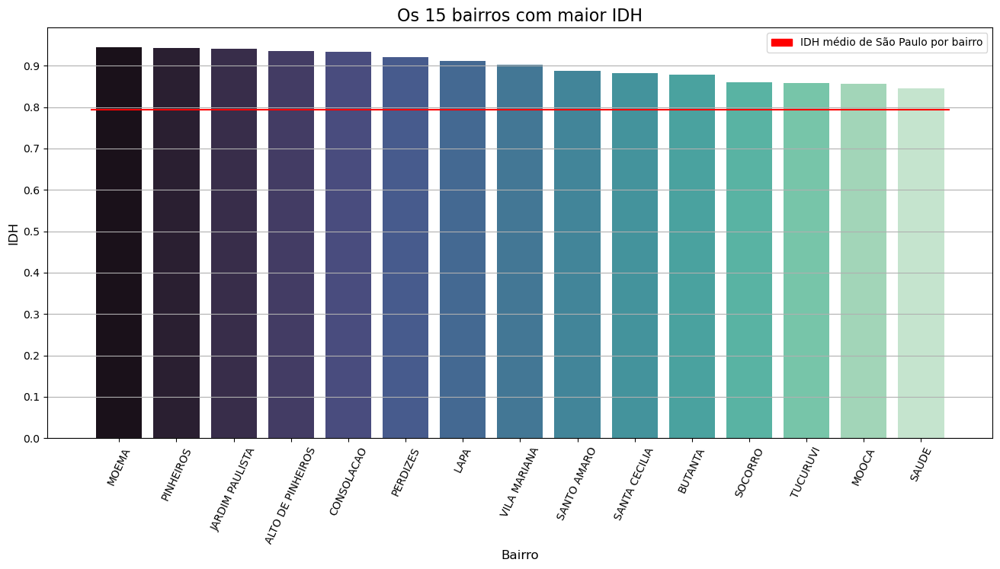

In [172]:
ax = sns.barplot(x=bairros_idh_mais_alto.index, y=bairros_idh_mais_alto.values, palette='mako')
ax.hlines(y=idh_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com maior IDH', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('IDH', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=.1))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['IDH médio de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Os 15 bairros com menor IDH

In [173]:
bairros_idh_mais_baixo = idh_bairro.nsmallest(15).sort_values(ascending=False)
bairros_idh_mais_baixo

Bairro
VILA MEDEIROS    0.73
CAPAO REDONDO    0.73
BOM RETIRO       0.73
SAPOPEMBA        0.73
GUAIANASES       0.73
VILA CURUCA      0.72
PERUS            0.72
ITAIM PAULISTA   0.72
ANHANGUERA       0.71
PARELHEIROS      0.71
JARDIM ANGELA    0.70
CID TIRADENTES   0.70
LAJEADO          0.70
JOSE BONIFACIO   0.70
GRAJAU           0.69
Name: Média IDH, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'VILA MEDEIROS'),
  Text(1, 0, 'CAPAO REDONDO'),
  Text(2, 0, 'BOM RETIRO'),
  Text(3, 0, 'SAPOPEMBA'),
  Text(4, 0, 'GUAIANASES'),
  Text(5, 0, 'VILA CURUCA'),
  Text(6, 0, 'PERUS'),
  Text(7, 0, 'ITAIM PAULISTA'),
  Text(8, 0, 'ANHANGUERA'),
  Text(9, 0, 'PARELHEIROS'),
  Text(10, 0, 'JARDIM ANGELA'),
  Text(11, 0, 'CID TIRADENTES'),
  Text(12, 0, 'LAJEADO'),
  Text(13, 0, 'JOSE BONIFACIO'),
  Text(14, 0, 'GRAJAU')])

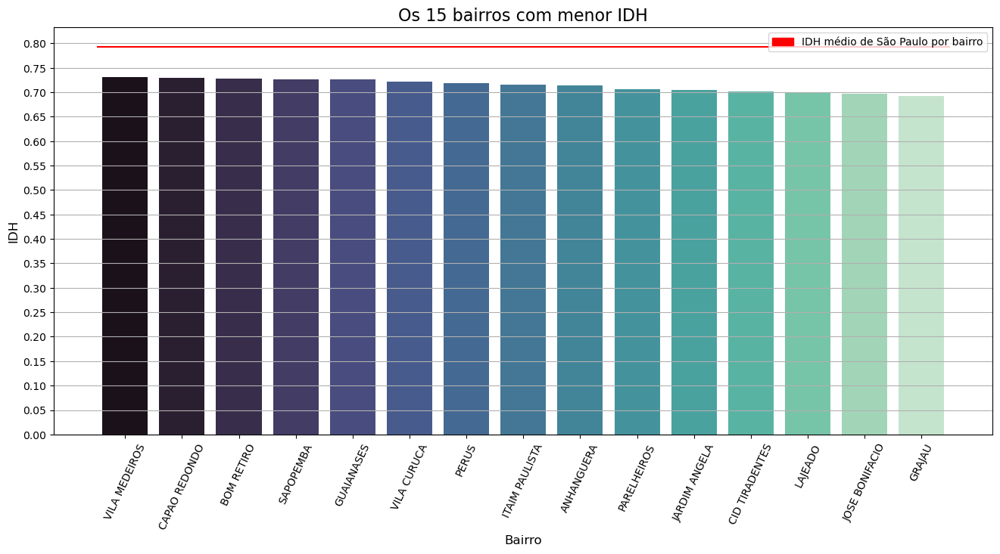

In [174]:
ax = sns.barplot(x=bairros_idh_mais_baixo.index, y=bairros_idh_mais_baixo.values, palette='mako')
ax.hlines(y=idh_medio_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com menor IDH', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('IDH', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=.05))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['IDH médio de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Relação entre o IDH médio do bairro e o Valor dos apartamentos

In [175]:
df[['Média IDH', 'Valor']].corr().loc['Média IDH']['Valor']

0.5017654485605103

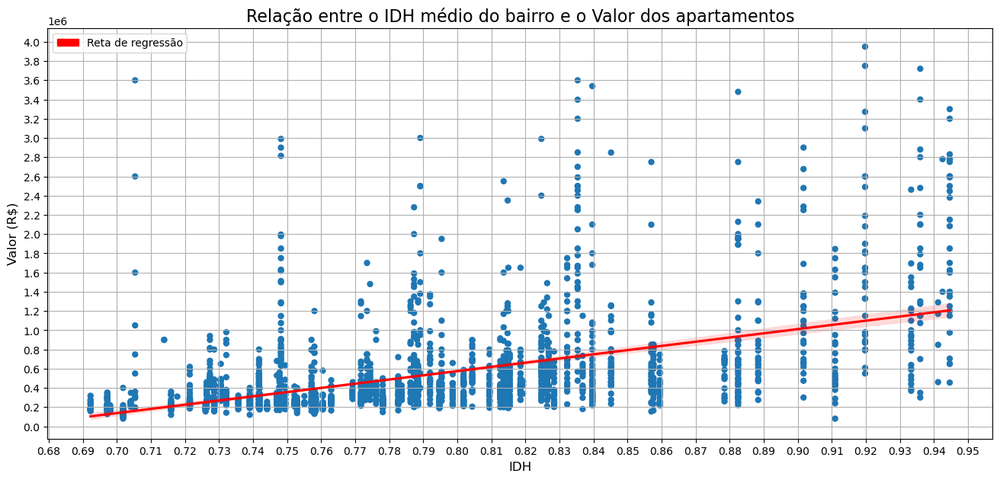

In [176]:
ax = sns.scatterplot(df, x='Média IDH', y='Valor', edgecolor='none')
sns.regplot(df, x='Média IDH', y='Valor', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre o IDH médio do bairro e o Valor dos apartamentos', fontsize=16)
ax.set_xlabel('IDH', fontsize=12)
ax.set_ylabel('Valor (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Relação entre o IDH médio do bairro e a Área dos apartamentos

In [177]:
df[['Média IDH', 'Área']].corr().loc['Média IDH']['Área']

0.3133515236217486

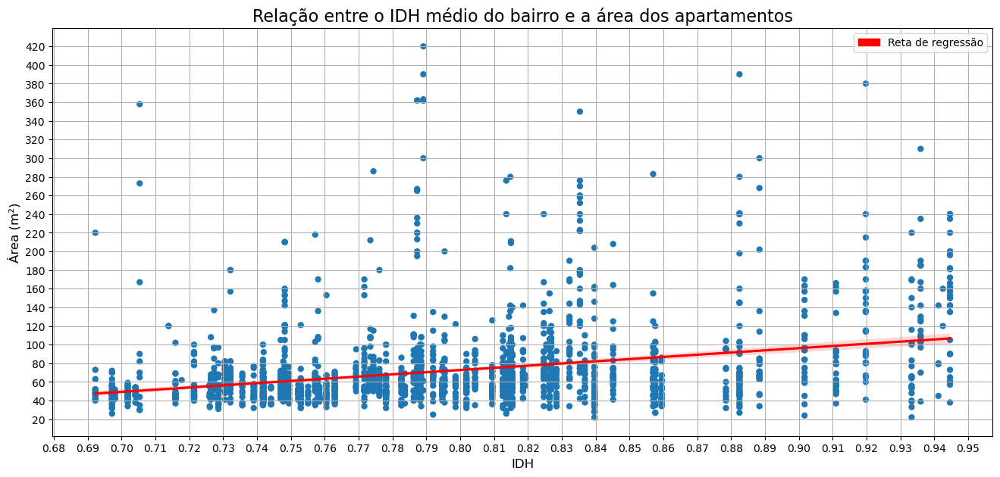

In [178]:
ax = sns.scatterplot(df, x='Média IDH', y='Área', edgecolor='none')
sns.regplot(df, x='Média IDH', y='Área', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre o IDH médio do bairro e a área dos apartamentos', fontsize=16)
ax.set_xlabel('IDH', fontsize=12)
ax.set_ylabel('Área (m²)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=20))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Relação entre o IDH médio do bairro e o valor do Condomínio dos apartamentos

In [179]:
df[['Média IDH', 'Condomínio']].corr().loc['Média IDH']['Condomínio']

0.4295127899112842

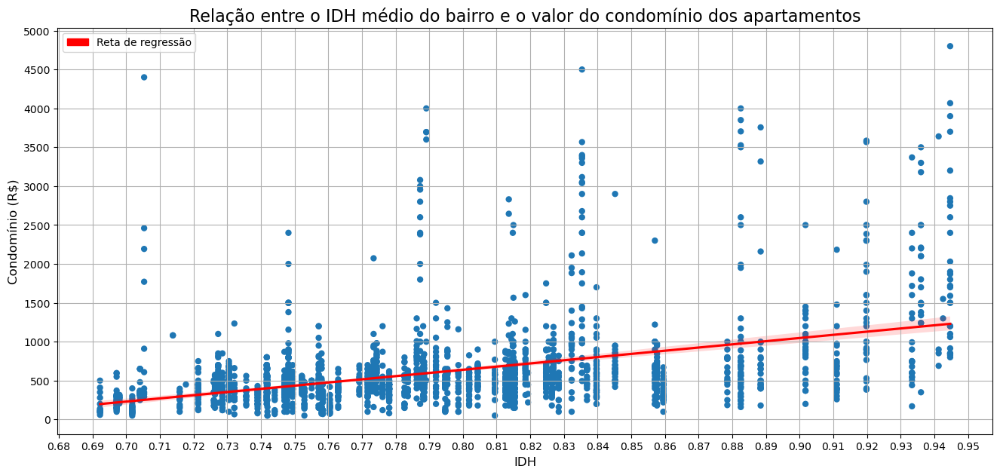

In [180]:
ax = sns.scatterplot(df, x='Média IDH', y='Condomínio', edgecolor='none')
sns.regplot(df, x='Média IDH', y='Condomínio', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre o IDH médio do bairro e o valor do condomínio dos apartamentos', fontsize=16)
ax.set_xlabel('IDH', fontsize=12)
ax.set_ylabel('Condomínio (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5e2))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Distribuição de IDH do bairro conforme a quantidade de quartos do apartamento

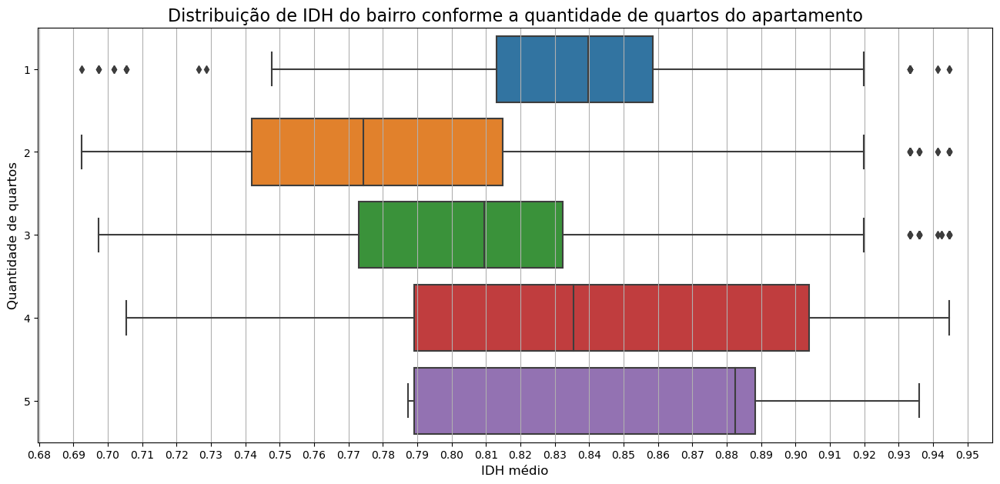

In [181]:
ax = sns.boxplot(df, x='Média IDH', y='Quartos', orient='h')

ax.set_title(f'Distribuição de IDH do bairro conforme a quantidade de quartos do apartamento', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('IDH médio', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.grid(axis='x')

#### Distribuição do IDH dos bairros por zona conforme a quantidade de quartos

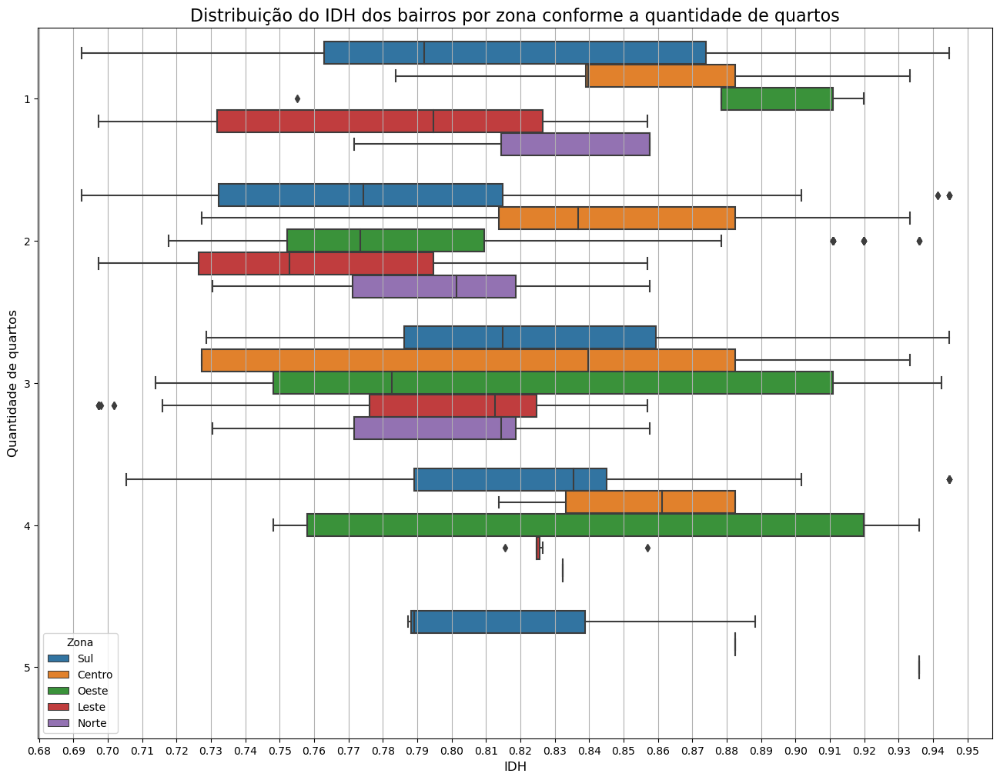

In [182]:
plt.figure(figsize=(16, 12))

ax = sns.boxplot(df, x='Média IDH', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição do IDH dos bairros por zona conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('IDH', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.grid(axis='x')

> <h4>Conclusões</h4>
>
> - O IDH médio por bairro é 0,7925
>
> - A MAIOR parte dos bairros estão na classe B de IDH (de 0,74 até 0,79)
>
> - A MENOR parte dos bairros estão na classe E de IDH (de 0,89 até 0,94)
>
> - A zona com MAIOR IDH médio por bairro é o Centro
>
> - A zona com MENOR IDH médio por bairro é a Zona Leste
>
> - O bairro com MAIOR IDH é Moema - 0,94
>
> - O bairro com MENOR IDH é Grajaú - 0,69
>
> - O IDH médio de um bairro não tem forte correlação com o valor, área e o valor do condomínio dos apartamentos

### Variável Expactativa de vida

#### Distribuição dos valores de Expectativa de vida

In [183]:
is_normal(df['Expectativa de vida'])

Não segue uma normal


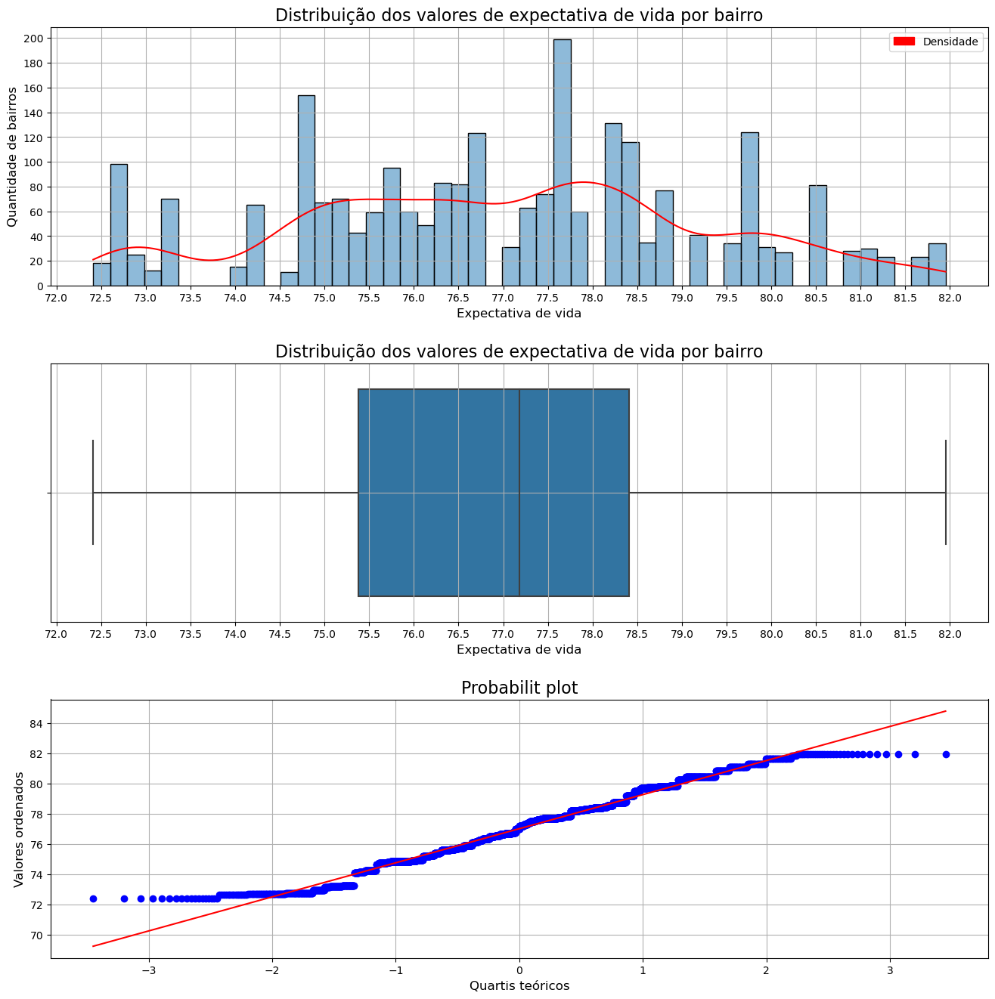

In [184]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=df['Expectativa de vida'], kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos valores de expectativa de vida por bairro', fontsize=16)
axes[0].set_xlabel('Expectativa de vida', fontsize=12)
axes[0].set_ylabel('Quantidade de bairros', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=20))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=df['Expectativa de vida'], ax=axes[1])
axes[1].set_title('Distribuição dos valores de expectativa de vida por bairro', fontsize=16)
axes[1].set_xlabel('Expectativa de vida', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=.5))


(_, (_, _, _)) = probplot(df['Expectativa de vida'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Obtendo as medidas de tendência central

In [185]:
print(f'A expectativa de vida média é {df["Expectativa de vida"].mean().round(2)} anos')
print(f'A expectativa de vida mediana é {df["Expectativa de vida"].median().round(2)} anos')
print(f'A expectativa de vida modal é {df["Expectativa de vida"].mode()[0].round(2)} anos')

A expectativa de vida média é 77.02 anos
A expectativa de vida mediana é 77.18 anos
A expectativa de vida modal é 76.69 anos


#### Obtendo o desvio padrão

In [186]:
print(f'O desvio padrão é {df["Expectativa de vida"].std().round(4)} anos')

O desvio padrão é 2.2715 anos


#### Separando as expectativas de vida em classes

In [187]:
expectativa_vida_maxima = df['Expectativa de vida'].max()
expectativa_vida_maxima

81.95

In [188]:
expectativa_vida_minima = df['Expectativa de vida'].min()
expectativa_vida_minima

72.4112903225806

In [189]:
passo_classes = (expectativa_vida_maxima - expectativa_vida_minima) / 5
passo_classes

1.907741935483881

In [190]:
classes = {
    'range': [round(x, 2) for x in np.arange(expectativa_vida_minima, expectativa_vida_maxima + 1, passo_classes)],
    'label': [chr(x) for x in range(65, 70)]
}
classes

{'range': [72.41, 74.32, 76.23, 78.13, 80.04, 81.95],
 'label': ['A', 'B', 'C', 'D', 'E']}

In [191]:
expectativa_vida_por_classe = pd.value_counts(
    pd.cut(
        df.groupby('Bairro')['Expectativa de vida'].mean(),
        classes['range'],
        labels=classes['label'],
    )
).to_frame()

expectativa_vida_por_classe.index.name = 'Classe'
expectativa_vida_por_classe.columns = ['Quantidade de bairros']

expectativa_vida_por_classe['Limites'] = pd.value_counts(
    pd.cut(
        df.groupby('Bairro')['Expectativa de vida'].mean(),
        classes['range']    
    )
).to_frame().index

expectativa_vida_por_classe

,Quantidade de bairros,Limites
Classe,,
C,23,"(76.23, 78.13]"
B,22,"(74.32, 76.23]"
D,21,"(78.13, 80.04]"
A,13,"(72.41, 74.32]"
E,10,"(80.04, 81.95]"


Text(0, 0.5, 'Expectativa de vida')

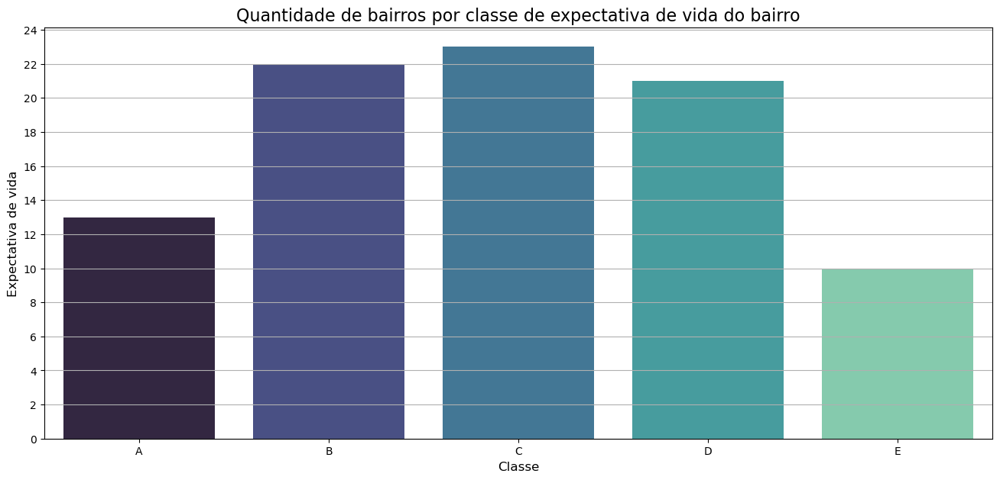

In [192]:
ax = sns.barplot(
    x=expectativa_vida_por_classe.index,
    y=expectativa_vida_por_classe['Quantidade de bairros'],
    palette='mako'
)
ax.grid(axis='y')
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=2))
ax.set_title('Quantidade de bairros por classe de expectativa de vida do bairro', fontsize=16)
ax.set_xlabel('Classe', fontsize=12)
ax.set_ylabel('Expectativa de vida', fontsize=12)

#### Relação entre a Expectativa de vida média e a zona de São Paulo

In [193]:
tendencia_central_expectativa_vida_zona = df.groupby('Zona')['Expectativa de vida'].agg(['mean', 'median', mode])
tendencia_central_expectativa_vida_zona.columns = ('Expectativa de vida média', 'Expectativa de vida mediana', 'Expectativa de vida modal')
tendencia_central_expectativa_vida_zona.sort_values('Expectativa de vida média', ascending=False, inplace=True)

tendencia_central_expectativa_vida_zona

,Expectativa de vida média,Expectativa de vida mediana,Expectativa de vida modal
Zona,,,
Centro,79.08,79.22,80.44
Norte,77.46,78.18,74.84
Oeste,77.25,76.56,76.56
Sul,77.05,77.32,77.85
Leste,76.12,76.15,76.69


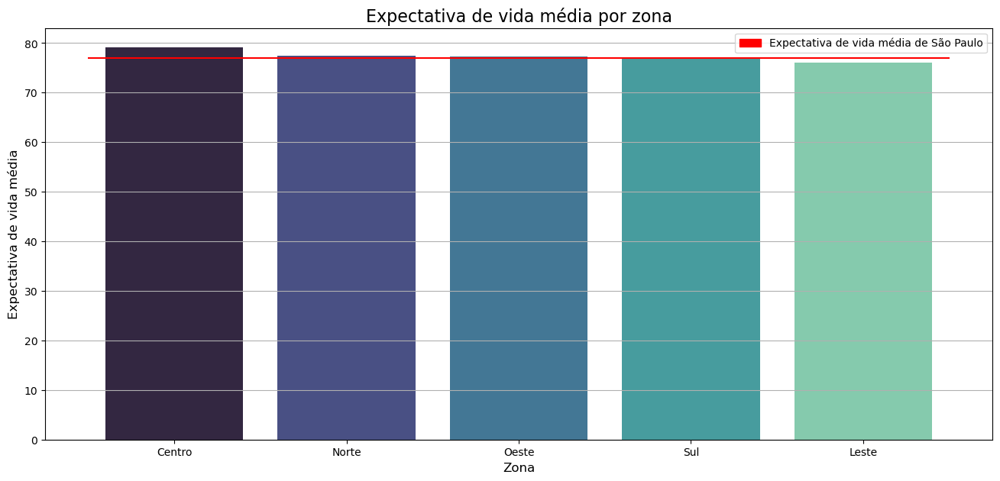

In [194]:
ax = sns.barplot(
    x=tendencia_central_expectativa_vida_zona.index,
    y=tendencia_central_expectativa_vida_zona['Expectativa de vida média'],
    palette='mako'
)

ax.set_title('Expectativa de vida média por zona', fontsize=16)
ax.set_xlabel('Zona', fontsize=12)
ax.set_ylabel('Expectativa de vida média', fontsize=12)
ax.hlines(y=df["Expectativa de vida"].mean(), xmin=-.5, xmax=4.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Expectativa de vida média de São Paulo'])
ax.grid(axis='y')

#### Distribuição das expectativas de vida dos bairros por zona

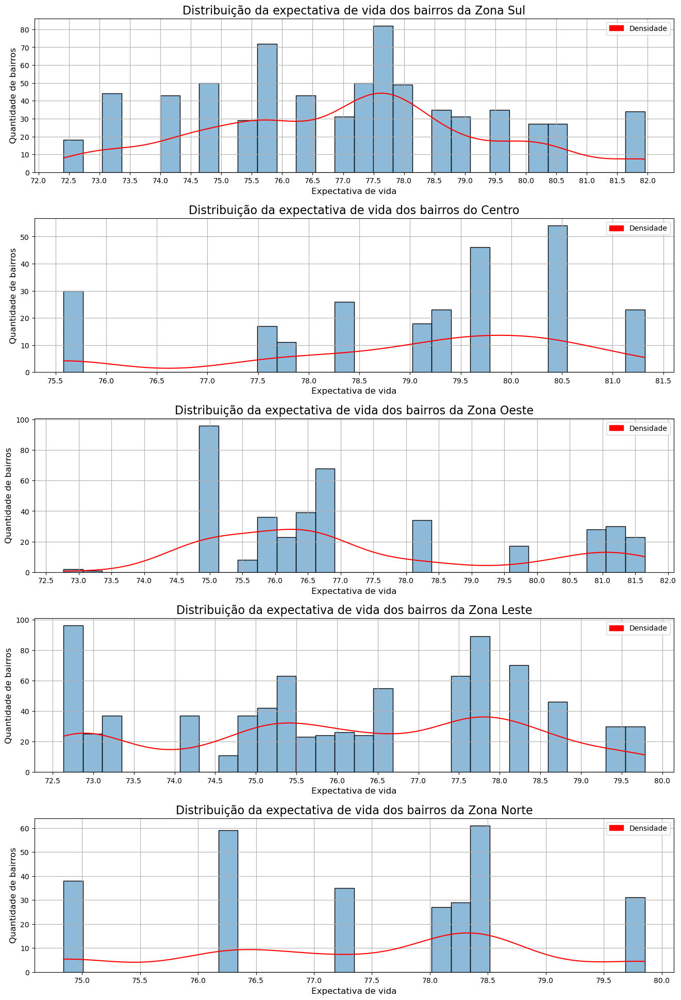

In [195]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    sns.histplot(df.query(f'Zona == "{zona}"')['Expectativa de vida'], kde=True, ax=axes[i], bins=30)

    if zona == 'Centro':
        axes[i].set_title(f'Distribuição da expectativa de vida dos bairros do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Distribuição da expectativa de vida dos bairros da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Expectativa de vida', fontsize=12)
    axes[i].set_ylabel('Quantidade de bairros', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

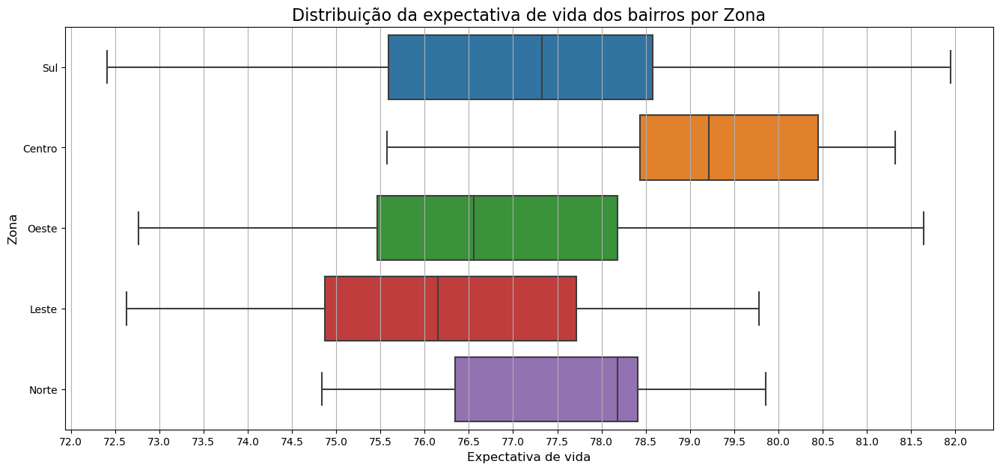

In [196]:
ax = sns.boxplot(df, x='Expectativa de vida', y='Zona')

ax.set_title(f'Distribuição da expectativa de vida dos bairros por Zona', fontsize=16)
ax.set_ylabel('Zona', fontsize=12)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.grid(axis='x')

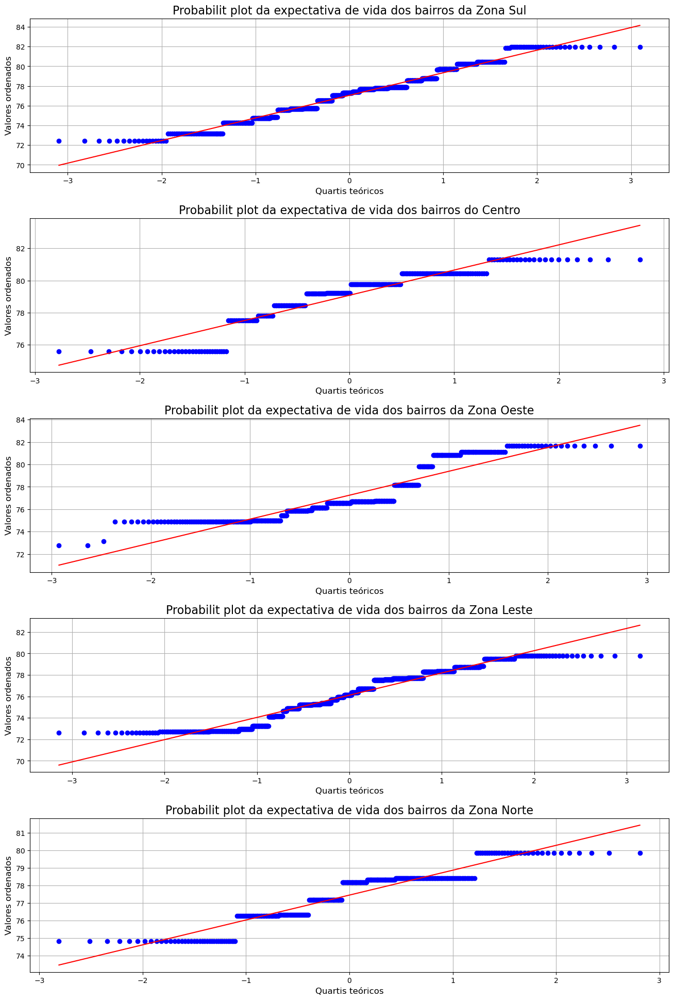

In [197]:
_, axes = plt.subplots(5, figsize=(16, 24))
plt.subplots_adjust(hspace=.3)

for i, zona in enumerate(zonas):
    (_, (_, _, _)) = probplot(df.query(f'Zona == "{zona}"')['Expectativa de vida'], plot=axes[i])

    if zona == 'Centro':
        axes[i].set_title(f'Probabilit plot da expectativa de vida dos bairros do {zona}', fontsize=16)
    else:
        axes[i].set_title(f'Probabilit plot da expectativa de vida dos bairros da Zona {zona}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### Expectativa de vida média por bairro

In [198]:
expectativa_vida_bairro = df.groupby('Bairro')['Expectativa de vida'].mean()
expectativa_vida_bairro

Bairro
AGUA RASA           79.48
ALTO DE PINHEIROS   81.64
ANHANGUERA          72.77
ARICANDUVA          76.35
ARTUR ALVIM         76.15
                     ... 
VILA MARIANA        80.23
VILA MATILDE        78.32
VILA MEDEIROS       74.84
VILA PRUDENTE       77.59
VILA SONIA          77.75
Name: Expectativa de vida, Length: 89, dtype: float64

#### Os 15 bairros com maior expectativa de vida

In [199]:
bairros_expectativa_vida_mais_alta = expectativa_vida_bairro.nlargest(15)
bairros_expectativa_vida_mais_alta

Bairro
MOEMA               81.95
JARDIM PAULISTA     81.84
PINHEIROS           81.65
ALTO DE PINHEIROS   81.64
CONSOLACAO          81.32
PERDIZES            81.09
LAPA                80.83
SANTA CECILIA       80.44
SANTO AMARO         80.44
VILA MARIANA        80.23
TUCURUVI            79.85
BUTANTA             79.82
MOOCA               79.78
REPUBLICA           79.78
SOCORRO             79.71
Name: Expectativa de vida, dtype: float64

In [200]:
expectativa_vida_media_bairro = expectativa_vida_bairro.mean()
expectativa_vida_media_bairro

77.0033397723127

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'MOEMA'),
  Text(1, 0, 'JARDIM PAULISTA'),
  Text(2, 0, 'PINHEIROS'),
  Text(3, 0, 'ALTO DE PINHEIROS'),
  Text(4, 0, 'CONSOLACAO'),
  Text(5, 0, 'PERDIZES'),
  Text(6, 0, 'LAPA'),
  Text(7, 0, 'SANTA CECILIA'),
  Text(8, 0, 'SANTO AMARO'),
  Text(9, 0, 'VILA MARIANA'),
  Text(10, 0, 'TUCURUVI'),
  Text(11, 0, 'BUTANTA'),
  Text(12, 0, 'MOOCA'),
  Text(13, 0, 'REPUBLICA'),
  Text(14, 0, 'SOCORRO')])

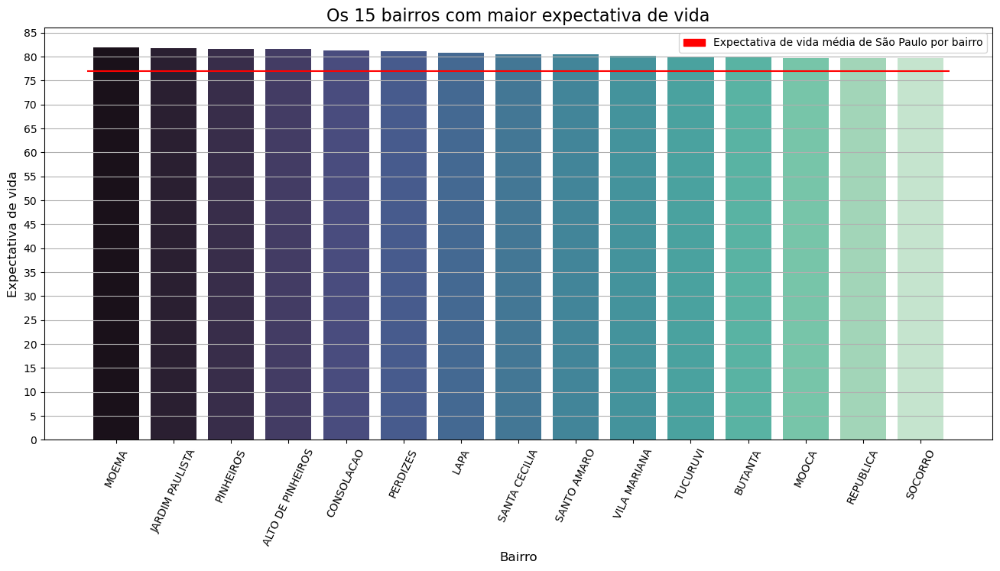

In [201]:
ax = sns.barplot(x=bairros_expectativa_vida_mais_alta.index, y=bairros_expectativa_vida_mais_alta.values, palette='mako')
ax.hlines(y=expectativa_vida_media_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com maior expectativa de vida', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Expectativa de vida', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Expectativa de vida média de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Os 15 bairros com menor expectativa de vida

In [202]:
bairros_expectativa_vida_mais_baixa = expectativa_vida_bairro.nsmallest(15).sort_values(ascending=False)
bairros_expectativa_vida_mais_baixa

Bairro
CAPAO REDONDO    74.73
SAO MIGUEL       74.63
CID DUTRA        74.27
SAPOPEMBA        74.15
GUAIANASES       74.09
VILA CURUCA      73.26
JARDIM ANGELA    73.18
PARELHEIROS      73.15
PERUS            73.14
ITAIM PAULISTA   72.93
ANHANGUERA       72.77
JOSE BONIFACIO   72.75
CID TIRADENTES   72.70
LAJEADO          72.63
GRAJAU           72.41
Name: Expectativa de vida, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAPAO REDONDO'),
  Text(1, 0, 'SAO MIGUEL'),
  Text(2, 0, 'CID DUTRA'),
  Text(3, 0, 'SAPOPEMBA'),
  Text(4, 0, 'GUAIANASES'),
  Text(5, 0, 'VILA CURUCA'),
  Text(6, 0, 'JARDIM ANGELA'),
  Text(7, 0, 'PARELHEIROS'),
  Text(8, 0, 'PERUS'),
  Text(9, 0, 'ITAIM PAULISTA'),
  Text(10, 0, 'ANHANGUERA'),
  Text(11, 0, 'JOSE BONIFACIO'),
  Text(12, 0, 'CID TIRADENTES'),
  Text(13, 0, 'LAJEADO'),
  Text(14, 0, 'GRAJAU')])

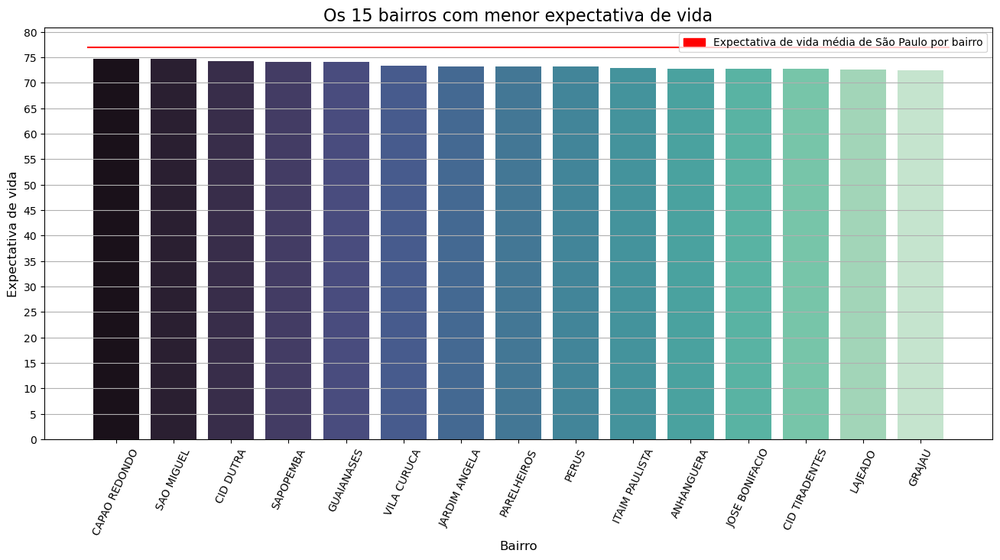

In [203]:
ax = sns.barplot(x=bairros_expectativa_vida_mais_baixa.index, y=bairros_expectativa_vida_mais_baixa.values, palette='mako')
ax.hlines(y=expectativa_vida_media_bairro, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 bairros com menor expectativa de vida', fontsize=16)
ax.set_xlabel('Bairro', fontsize=12)
ax.set_ylabel('Expectativa de vida', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Expectativa de vida média de São Paulo por bairro'])
plt.xticks(rotation=65)

#### Relação entre a expectativa de vida média do bairro e o valor dos apartamentos

In [204]:
df[['Expectativa de vida', 'Valor']].corr().loc['Expectativa de vida']['Valor']

0.4481088750848382

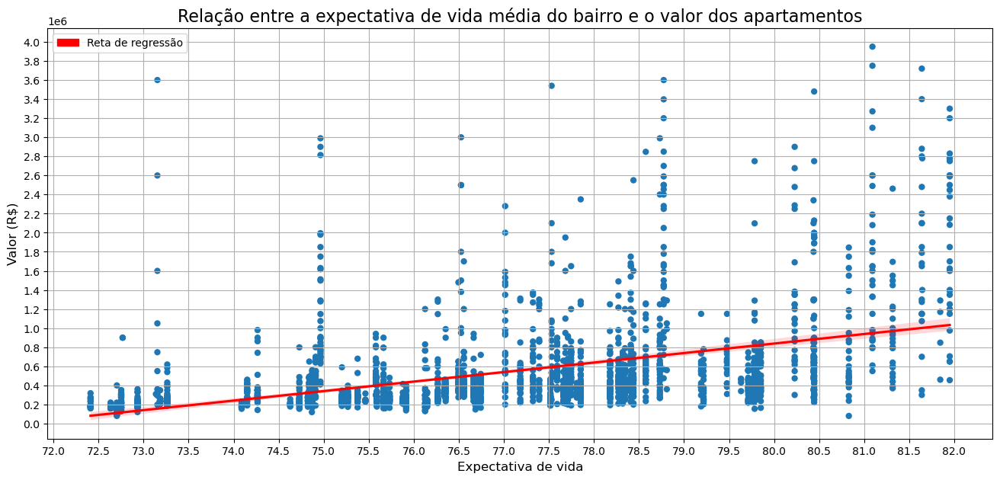

In [205]:
ax = sns.scatterplot(df, x='Expectativa de vida', y='Valor', edgecolor='none')
sns.regplot(df, x='Expectativa de vida', y='Valor', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre a expectativa de vida média do bairro e o valor dos apartamentos', fontsize=16)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.set_ylabel('Valor (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Relação entre a expectativa de vida média do bairro e a área dos apartamentos

In [206]:
df[['Expectativa de vida', 'Área']].corr().loc['Expectativa de vida']['Área']

0.2786408907678357

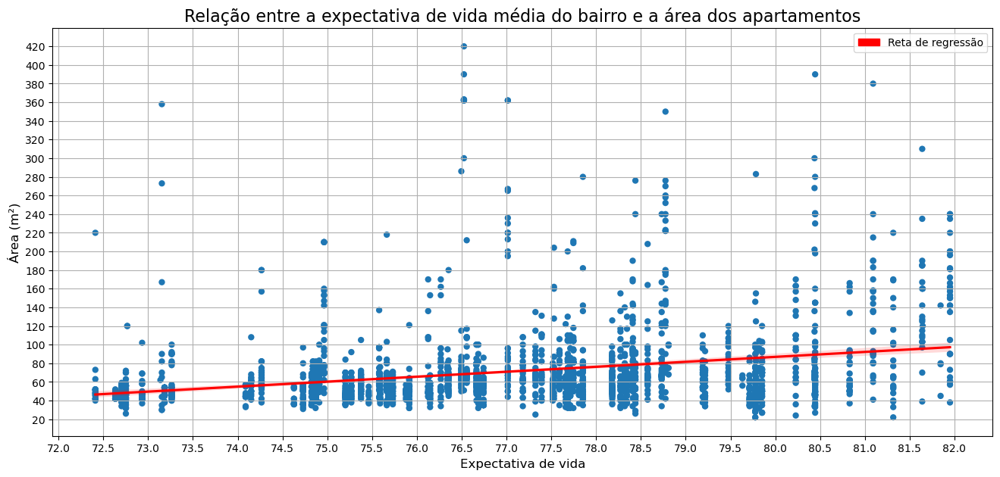

In [207]:
ax = sns.scatterplot(df, x='Expectativa de vida', y='Área', edgecolor='none')
sns.regplot(df, x='Expectativa de vida', y='Área', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre a expectativa de vida média do bairro e a área dos apartamentos', fontsize=16)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.set_ylabel('Área (m²)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=20))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Relação entre a expectativa de vida média do bairro e o valor dos condomínios

In [208]:
df[['Expectativa de vida', 'Condomínio']].corr().loc['Expectativa de vida']['Condomínio']

0.389909003090586

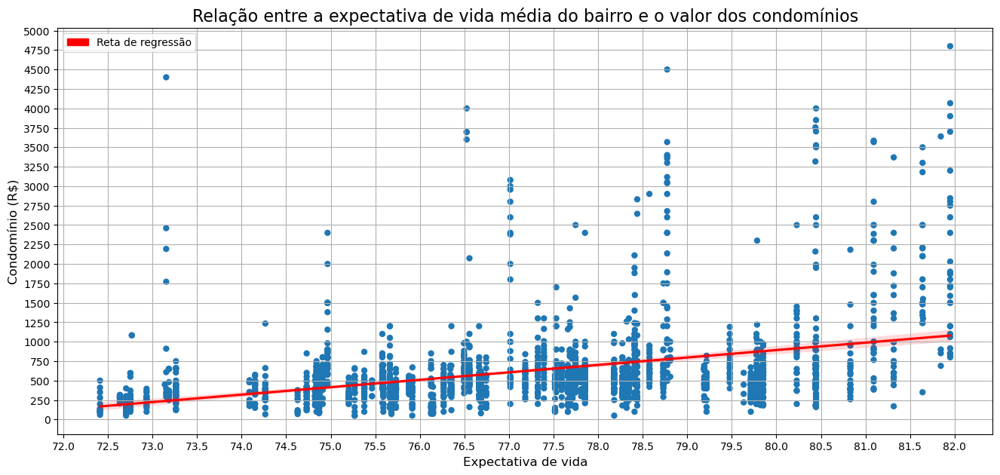

In [209]:
ax = sns.scatterplot(df, x='Expectativa de vida', y='Condomínio', edgecolor='none')
sns.regplot(df, x='Expectativa de vida', y='Condomínio', ax=ax, color='red', ci=95, scatter=False)   

ax.set_title('Relação entre a expectativa de vida média do bairro e o valor dos condomínios', fontsize=16)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.set_ylabel('Condomínio (R$)', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=250))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Relação entre a expectativa de vida média do bairro e o IDH do bairro

In [210]:
df[['Expectativa de vida', 'Média IDH']].corr().loc['Expectativa de vida']['Média IDH']

0.9743865897300016

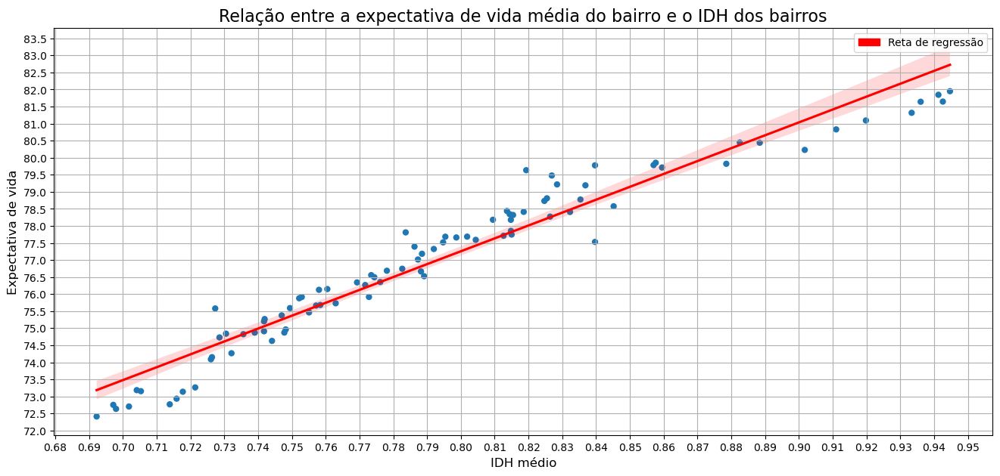

In [211]:
df_group_bairro = df.groupby('Bairro')

ax = sns.scatterplot(
    x=df_group_bairro['Média IDH'].mean().values,
    y=df_group_bairro['Expectativa de vida'].mean().values,
    edgecolor='none'
)
sns.regplot(
    x=df_group_bairro['Média IDH'].mean().values,
    y=df_group_bairro['Expectativa de vida'].mean().values,
    ax=ax, color='red',
    ci=95,
    scatter=False
)

ax.set_title('Relação entre a expectativa de vida média do bairro e o IDH dos bairros', fontsize=16)
ax.set_xlabel('IDH médio', fontsize=12)
ax.set_ylabel('Expectativa de vida', fontsize=12)
ax.grid()
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.01))
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=.5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Reta de regressão'])

#### Rodando uma regressão linear para Média IDH e Expectativa de vida

In [212]:
X = sm.add_constant(df_group_bairro['Média IDH'].mean())
X.head()

,const,Média IDH
Bairro,,
AGUA RASA,1.00,0.83
ALTO DE PINHEIROS,1.00,0.94
ANHANGUERA,1.00,0.71
ARICANDUVA,1.00,0.78
ARTUR ALVIM,1.00,0.76


In [213]:
Y = df_group_bairro['Expectativa de vida'].mean()
Y.head()

Bairro
AGUA RASA           79.48
ALTO DE PINHEIROS   81.64
ANHANGUERA          72.77
ARICANDUVA          76.35
ARTUR ALVIM         76.15
Name: Expectativa de vida, dtype: float64

In [214]:
reg_idh_expectativa_vida = sm.OLS(Y, X).fit()
print(reg_idh_expectativa_vida.summary())

                             OLS Regression Results                            
Dep. Variable:     Expectativa de vida   R-squared:                       0.942
Model:                             OLS   Adj. R-squared:                  0.942
Method:                  Least Squares   F-statistic:                     1418.
Date:                 Tue, 22 Aug 2023   Prob (F-statistic):           1.23e-55
Time:                         11:02:26   Log-Likelihood:                -78.563
No. Observations:                   89   AIC:                             161.1
Df Residuals:                       87   BIC:                             166.1
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         47.0208      0.799     58.87

#### Obtendo os parâmetros do modelo

In [215]:
b1, b2 = reg_idh_expectativa_vida.params

print(f'b1 = {b1}')
print(f'b2 = {b2}')

b1 = 47.020791927493676
b2 = 37.7943675318629


#### Obtendo o intervalo de confiança para os parâmetros

In [216]:
conf_int = reg_idh_expectativa_vida.conf_int(alpha=alpha)
conf_int.columns = ('Limite inferior', 'Limite superior')
conf_int.index = ('b1', 'b2')
conf_int

,Limite inferior,Limite superior
b1,45.43,48.61
b2,35.80,39.79


#### Obtendo os valores previstos

In [217]:
idh_expectativa_vida_bairro = pd.DataFrame(df_group_bairro['Bairro'].value_counts().index)
idh_expectativa_vida_bairro['Média IDH'] = df_group_bairro['Média IDH'].mean().values
idh_expectativa_vida_bairro['Expectativa de vida'] = df_group_bairro['Expectativa de vida'].mean().values

idh_expectativa_vida_bairro

,Bairro,Média IDH,Expectativa de vida
0,AGUA RASA,0.83,79.48
1,ALTO DE PINHEIROS,0.94,81.64
2,ANHANGUERA,0.71,72.77
3,ARICANDUVA,0.78,76.35
4,ARTUR ALVIM,0.76,76.15
...,...,...,...
84,VILA MARIANA,0.90,80.23
85,VILA MATILDE,0.82,78.32
86,VILA MEDEIROS,0.73,74.84
87,VILA PRUDENTE,0.80,77.59


In [218]:
idh_expectativa_vida_bairro['Expectativa de vida prevista'] = reg_idh_expectativa_vida.predict()
idh_expectativa_vida_bairro

,Bairro,Média IDH,Expectativa de vida,Expectativa de vida prevista
0,AGUA RASA,0.83,79.48,78.27
1,ALTO DE PINHEIROS,0.94,81.64,82.40
2,ANHANGUERA,0.71,72.77,74.00
3,ARICANDUVA,0.78,76.35,76.36
4,ARTUR ALVIM,0.76,76.15,75.76
...,...,...,...,...
84,VILA MARIANA,0.90,80.23,81.10
85,VILA MATILDE,0.82,78.32,77.84
86,VILA MEDEIROS,0.73,74.84,74.63
87,VILA PRUDENTE,0.80,77.59,77.42


#### Teste de hipótese para nulidade do coeficiente angular

### $H_0: \beta_2 = 0$
### $H_1: \beta_2 \neq 0$

In [219]:
pvalue = reg_idh_expectativa_vida.pvalues[1]
pvalue

1.2299861989233701e-55

In [220]:
if pvalue <= alpha:
    print('O valor de B² não é 0')
else:
    print('O valor de B² é 0')

O valor de B² não é 0


#### Analisando os resíduos do modelo

In [221]:
reg_idh_expectativa_vida.resid

Bairro
AGUA RASA            1.21
ALTO DE PINHEIROS   -0.76
ANHANGUERA          -1.23
ARICANDUVA          -0.00
ARTUR ALVIM          0.38
                     ... 
VILA MARIANA        -0.87
VILA MATILDE         0.48
VILA MEDEIROS        0.21
VILA PRUDENTE        0.17
VILA SONIA          -0.08
Length: 89, dtype: float64

In [222]:
print(f'A média dos resíduos é {round(reg_idh_expectativa_vida.resid.mean(), 2)}')

A média dos resíduos é 0.0


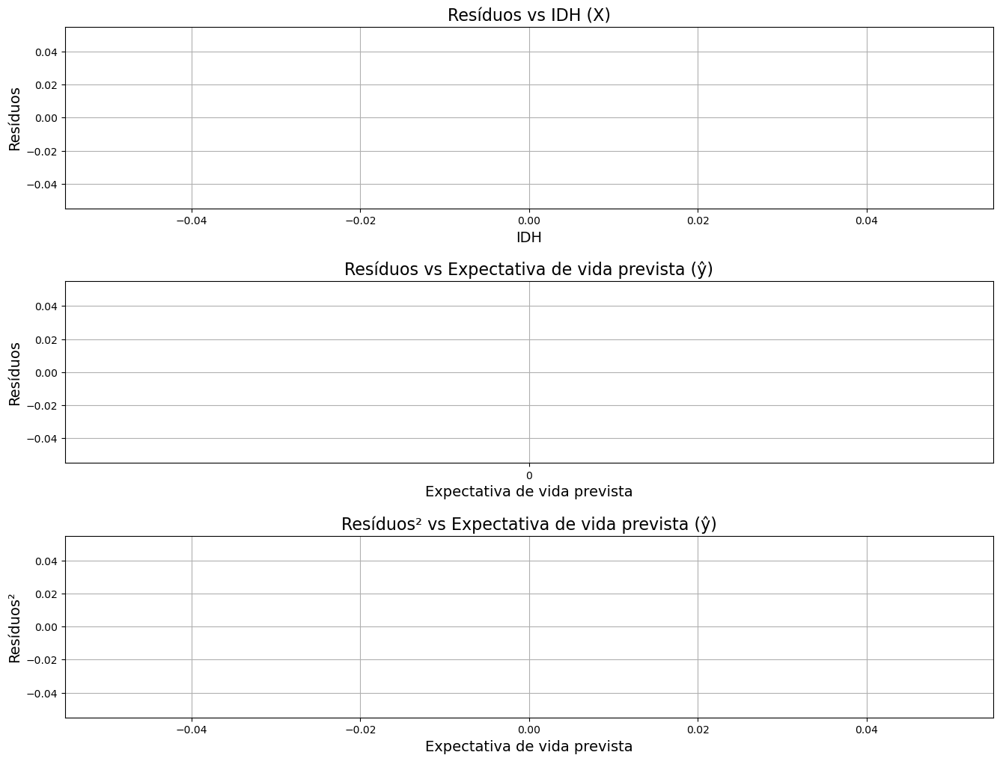

In [223]:
_, axes = plt.subplots(3, figsize=(16, 12))
plt.subplots_adjust(hspace=.4)

sns.scatterplot(idh_expectativa_vida_bairro, x='Média IDH', y=reg_idh_expectativa_vida.resid, edgecolor='none', ax=axes[0])
axes[0].set_title('Resíduos vs IDH (X)', fontsize=16)
axes[0].set_xlabel('IDH', fontsize=14)

sns.scatterplot(idh_expectativa_vida_bairro, x='Expectativa de vida prevista', y=reg_idh_expectativa_vida.resid, edgecolor='none', ax=axes[1])
axes[1].set_title('Resíduos vs Expectativa de vida prevista (ŷ)', fontsize=16)
axes[1].set_xlabel('Expectativa de vida prevista', fontsize=14)
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=5))

for i in range(2):
    axes[i].grid()
    axes[i].set_ylabel('Resíduos', fontsize=14)

sns.scatterplot(idh_expectativa_vida_bairro, x='Expectativa de vida prevista', y=reg_idh_expectativa_vida.resid ** 2, edgecolor='none', ax=axes[2])
axes[2].set_title('Resíduos² vs Expectativa de vida prevista (ŷ)', fontsize=16)
axes[2].set_xlabel('Expectativa de vida prevista', fontsize=14)
axes[2].set_ylabel('Resíduos²', fontsize=14)
axes[2].grid()

#### Verificando a normalidade dos resíduos

In [224]:
is_normal(reg_idh_expectativa_vida.resid)

Segue uma normal


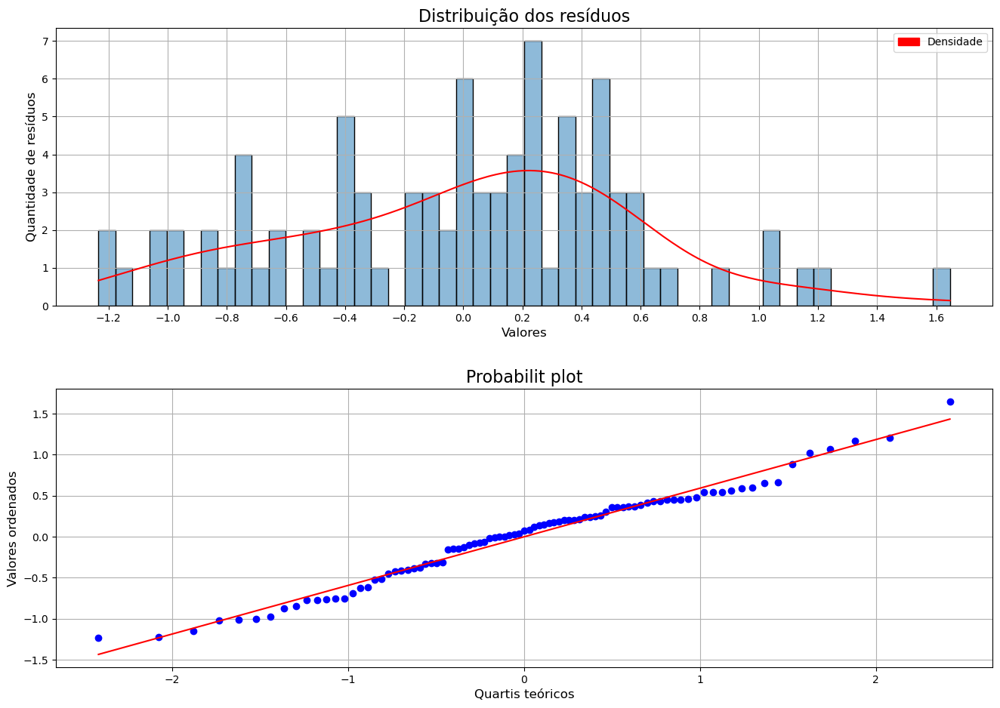

In [225]:
_, axes = plt.subplots(2, figsize=(16, 11))
plt.subplots_adjust(hspace=.3)

sns.histplot(reg_idh_expectativa_vida.resid, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos resíduos', fontsize=16)
axes[0].set_xlabel('Valores', fontsize=12)
axes[0].set_ylabel('Quantidade de resíduos', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=.2))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])

(_, (_, _, _)) = probplot(reg_idh_expectativa_vida.resid, plot=axes[1])
axes[1].set_title('Probabilit plot', fontsize=16)
axes[1].set_xlabel('Quartis teóricos', fontsize=12)
axes[1].set_ylabel('Valores ordenados', fontsize=12)
axes[1].grid()

#### Obtendo $R^2$ do modelo

In [226]:
reg_idh_expectativa_vida.rsquared

0.942192425730054

#### Prevendo valores

#### Previsão para São Paulo em geral

In [227]:
def calcular_valor(idh: float):
    expectativa_vida_prevista = reg_idh_expectativa_vida.predict([1, idh])[0]

    print(f'No contexto da cidade de São Paulo, a expectativa de vida prevista para um bairro com IDH {idh:.2f} é de {expectativa_vida_prevista.round(2)} anos')

calcular_valor(.8)

No contexto da cidade de São Paulo, a expectativa de vida prevista para um bairro com IDH 0.80 é de 77.26 anos


#### Previsão por zona

In [228]:
def calcular_expectativa_vida_por_idh_zona(idh: float):
    XY_zonas = {}

    print(f'Para bairro de IDH {idh:.2f}:\n')

    for zona in zonas:
        XY_zonas[zona] = {
            'X': sm.add_constant(df.query(f'Zona == "{zona}"').groupby('Bairro')['Média IDH'].mean()),
            'Y': df.query(f'Zona == "{zona}"').groupby('Bairro')['Expectativa de vida'].mean()
        }


    for zona, zona_data in XY_zonas.items():
        model = sm.OLS(zona_data['Y'], zona_data['X']).fit()
        expectativa_vida_prevista = model.predict([1, idh])[0]

        if zona == 'Centro':
            print(f'{zona.upper()} - {expectativa_vida_prevista.round(2)} anos')
        else:
            print(f'ZONA {zona.upper()} - {expectativa_vida_prevista.round(2)} anos')

calcular_expectativa_vida_por_idh_zona(.8)

Para bairro de IDH 0.80:

ZONA SUL - 77.2 anos
CENTRO - 77.94 anos
ZONA OESTE - 76.99 anos
ZONA LESTE - 77.57 anos
ZONA NORTE - 77.55 anos


#### Distribuição da expectativa de vida conforme a quantidade de quartos

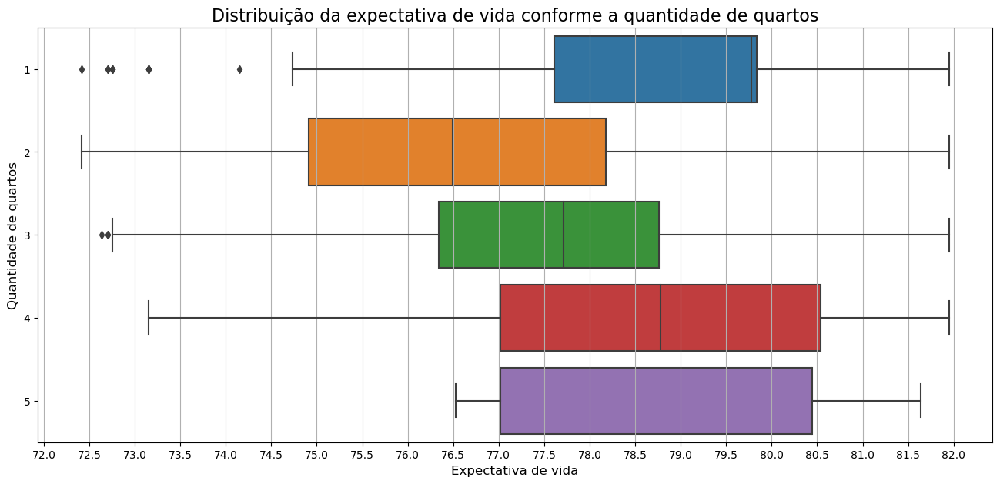

In [229]:
ax = sns.boxplot(df, x='Expectativa de vida', y='Quartos', orient='h')

ax.set_title(f'Distribuição da expectativa de vida conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.grid(axis='x')

#### Distribuição da expectativa de vida dos bairros por zona conforme a quantidade de quartos

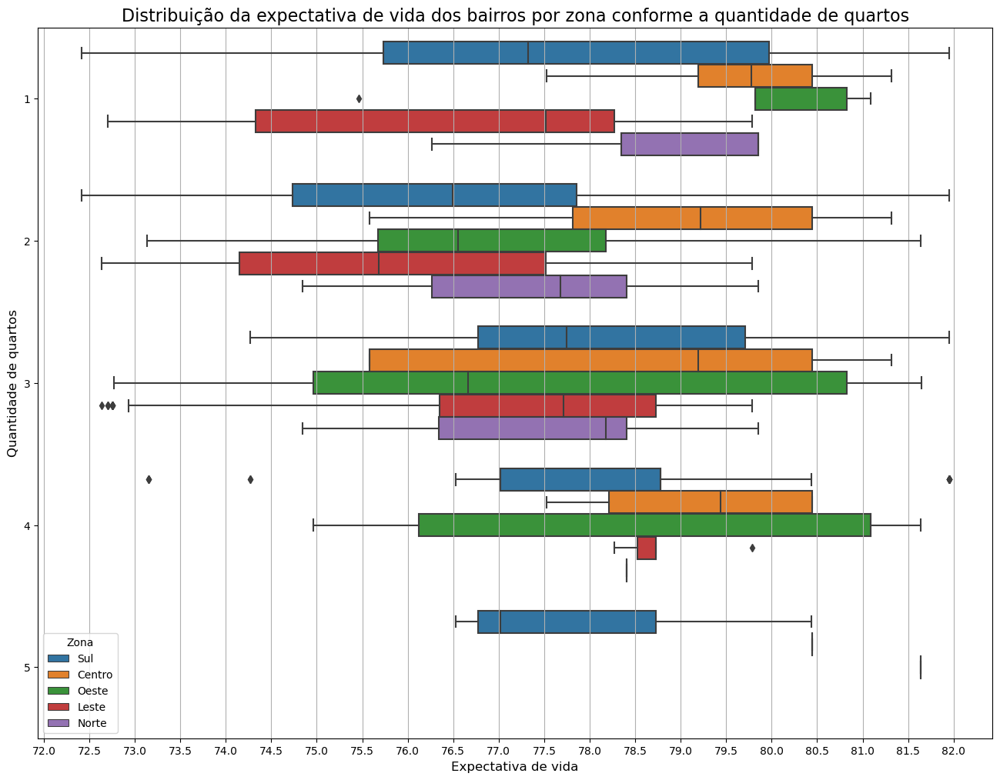

In [230]:
plt.figure(figsize=(16, 12))

ax = sns.boxplot(df, x='Expectativa de vida', y='Quartos', hue='Zona', orient='h')

ax.set_title(f'Distribuição da expectativa de vida dos bairros por zona conforme a quantidade de quartos', fontsize=16)
ax.set_ylabel('Quantidade de quartos', fontsize=12)
ax.set_xlabel('Expectativa de vida', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=.5))
ax.grid(axis='x')

> <h4>Conclusões</h4>
>
> - A expectativa de vida média de São Paulo é 77.02 anos
>
> - A MAIOR parte dos bairros está na classe C de Expectativa de vida (de 76,23 até 78,13 anos)
>
> - A MENOR parte dos bairros está na classe E de Expectativa de vida (de 80,04 até 81,95 anos)
>
> - A zona com MAIOR expectativa de vida média é o Centro
>
> - A zona com MENOR expectativa de vida média é a Zona Leste
>
> - O bairro com MAIOR expectativa de vida é Moema - 81,95 anos
>
> - O bairro com MENOR expectativa de vida é Grajaú - 72,41 anos
>
> - A expectativa de vida de um bairro não tem forte correlação com o valor, área e o valor do condomínio dos apartamentos
>
> - A expectativa de vida de um bairro é altamente correlacionada com o IDH médio daquele bairro - 0,97
>
> - O $R^2$ da regressão linear entre Expectativa de vida e Média IDH é muito alto - 0,94
>
> - A distribuição dos resíduos da regressão linear entre Expectativa de vida e Média IDH segue uma normal
> 
> - O coeficiente angular ($\beta_2$) da regressão linear entre Expectativa de vida e Média IDH NÃO é 0
>
> - A relação dos resíduos da regressão linear entre Expectativa de vida e Média IDH e as variáveis não aparacem nos gráficos pois o modelo está bem ajustado aos dados
>
> - A ZONA com a MAIOR expectativa de vida prevista para um bairro com IDH 0,80 é o Centro - 77,94 anos
>
> - A ZONA com a MENOR expectativa de vida prevista para um bairro com IDH 0,80 é a Zona Oeste - 76,99 anos

### Variável Linha próxima

#### Quantidade de apartamentos próximos a cada linha de transporte ferroviário

In [231]:
apartamentos_linha = df['Linha próxima'].value_counts()
apartamentos_linha

Linha próxima
VERMELHA    942
AZUL        447
LILAS       428
PRATA       225
VERDE       219
AMARELA     200
Name: count, dtype: int64

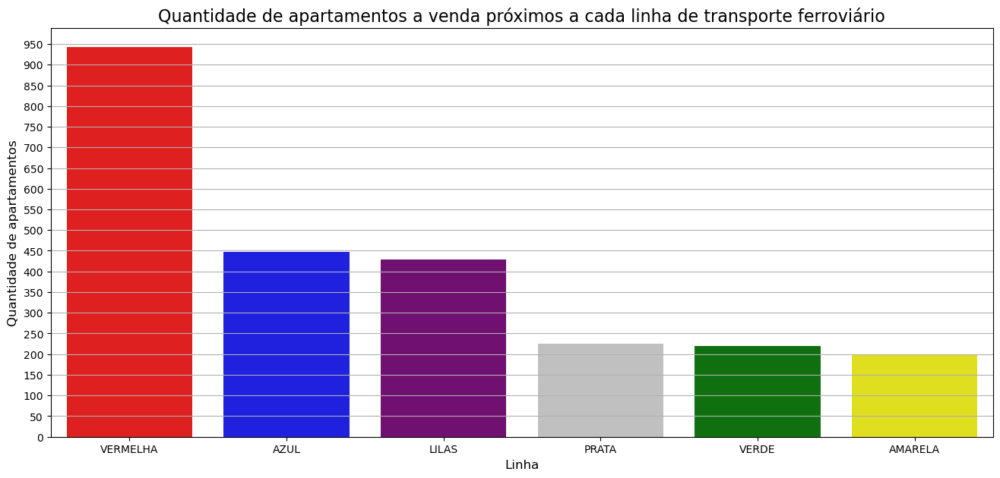

In [232]:
palette = sns.color_palette(['red', 'blue', 'purple', 'silver', 'green', 'yellow'])

ax = sns.barplot(
    x=apartamentos_linha.index,
    y=apartamentos_linha.values,
    palette=palette
)
ax.grid(axis='y')
ax.set_title('Quantidade de apartamentos a venda próximos a cada linha de transporte ferroviário', fontsize=16)
ax.set_xlabel('Linha', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=50))

#### Obtendo as medidas de tendência central para Valor por linha mais próxima

In [233]:
tendencia_central_valor_linha = df.groupby('Linha próxima')['Valor'].agg(['mean', 'median', mode])
tendencia_central_valor_linha.columns = ('Valor médio', 'Valor mediano', 'Valor modal')
tendencia_central_valor_linha.sort_values('Valor médio', ascending=False, inplace=True)

tendencia_central_valor_linha

,Valor médio,Valor mediano,Valor modal
Linha próxima,,,
VERDE,823722.31,650000.00,700000
AMARELA,694424.56,511500.00,750000
LILAS,654845.25,340000.00,350000
AZUL,515620.15,425000.00,350000
VERMELHA,445640.94,310000.00,250000
PRATA,369709.30,320000.00,420000


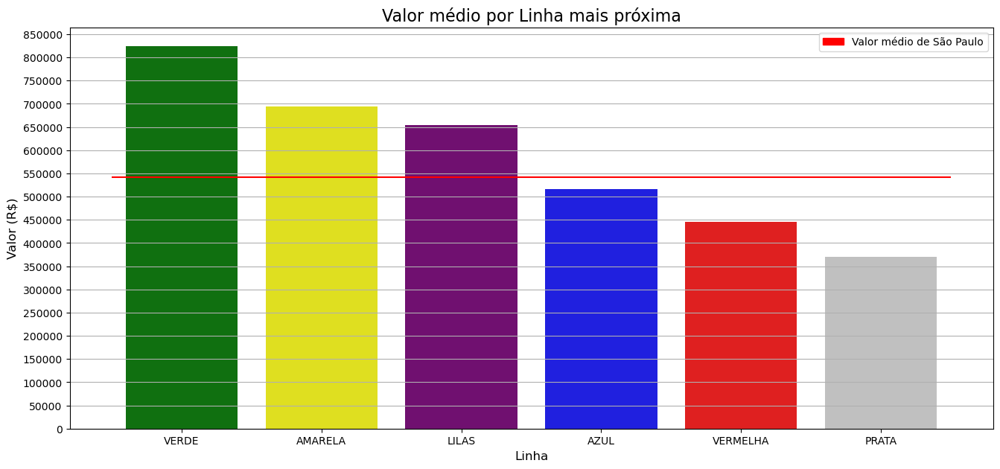

In [234]:
palette = sns.color_palette(['green', 'yellow', 'purple', 'blue', 'red', 'silver'])

ax = sns.barplot(
    x=tendencia_central_valor_linha.index,
    y=tendencia_central_valor_linha['Valor médio'],
    palette=palette
)

ax.set_title('Valor médio por Linha mais próxima', fontsize=16)
ax.set_xlabel('Linha', fontsize=12)
ax.set_ylabel('Valor (R$)', fontsize=12)
ax.hlines(y=df['Valor'].mean(), xmin=-.5, xmax=5.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5e4))
ax.grid(axis='y')

#### Distribuição dos valores por linha mais próxima

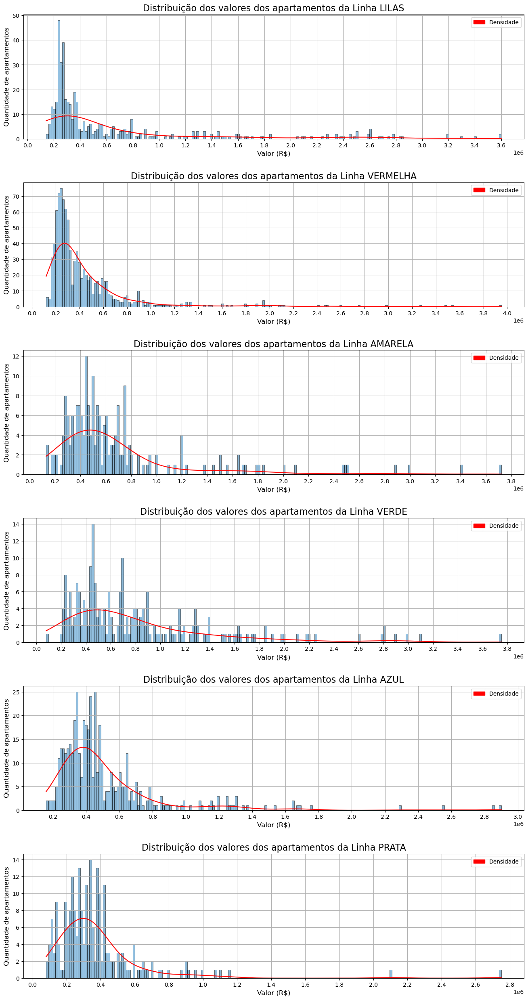

In [235]:
_, axes = plt.subplots(6, figsize=(16, 31))
plt.subplots_adjust(hspace=.35)

linhas = df['Linha próxima'].unique()

for i, linha in enumerate(linhas):
    sns.histplot(df[df['Linha próxima'] == linha]['Valor'], kde=True, ax=axes[i], bins=200)

    axes[i].set_title(f'Distribuição dos valores dos apartamentos da Linha {linha}', fontsize=16)

    axes[i].set_xlabel('Valor (R$)', fontsize=12)
    axes[i].set_ylabel('Quantidade de apartamentos', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

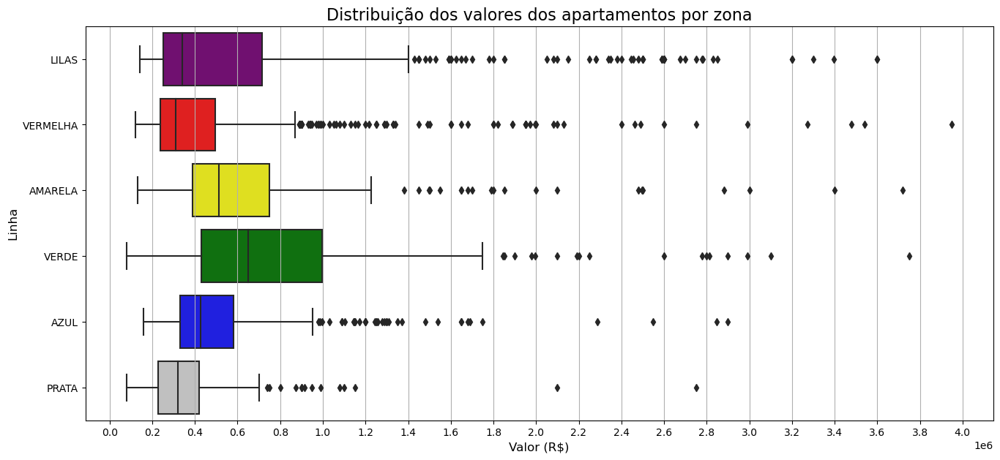

In [236]:
palette = sns.color_palette(['purple', 'red', 'yellow', 'green', 'blue', 'silver'])

ax = sns.boxplot(df, x='Valor', y='Linha próxima', palette=palette)

ax.set_title(f'Distribuição dos valores dos apartamentos por zona', fontsize=16)
ax.set_ylabel('Linha', fontsize=12)
ax.set_xlabel('Valor (R$)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=2e5))
ax.grid(axis='x')

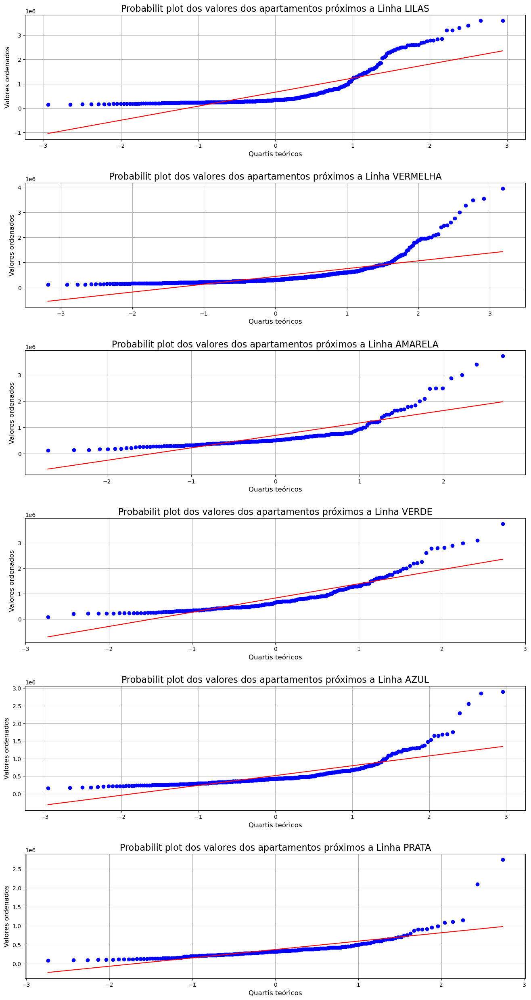

In [237]:
_, axes = plt.subplots(6, figsize=(16, 31))
plt.subplots_adjust(hspace=.35)

for i, linha in enumerate(linhas):
    (_, (_, _, _)) = probplot(df[df['Linha próxima'] == linha]['Valor'], plot=axes[i])

    axes[i].set_title(f'Probabilit plot dos valores dos apartamentos próximos a Linha {linha}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### Obtendo as medidas de tendência central para Área em cada linha mais próxima

In [238]:
tendencia_central_area_linha = df.groupby('Linha próxima')['Área'].agg(['mean', 'median', mode])
tendencia_central_area_linha.columns = ('Área média', 'Área mediana', 'Área modal')
tendencia_central_area_linha.sort_values('Área média', ascending=False, inplace=True)

tendencia_central_area_linha

,Área média,Área mediana,Área modal
Linha próxima,,,
AMARELA,90.36,68.50,70
VERDE,84.70,70.00,69
LILAS,81.16,59.50,50
AZUL,69.57,63.00,60
VERMELHA,62.41,55.00,50
PRATA,60.31,56.00,45


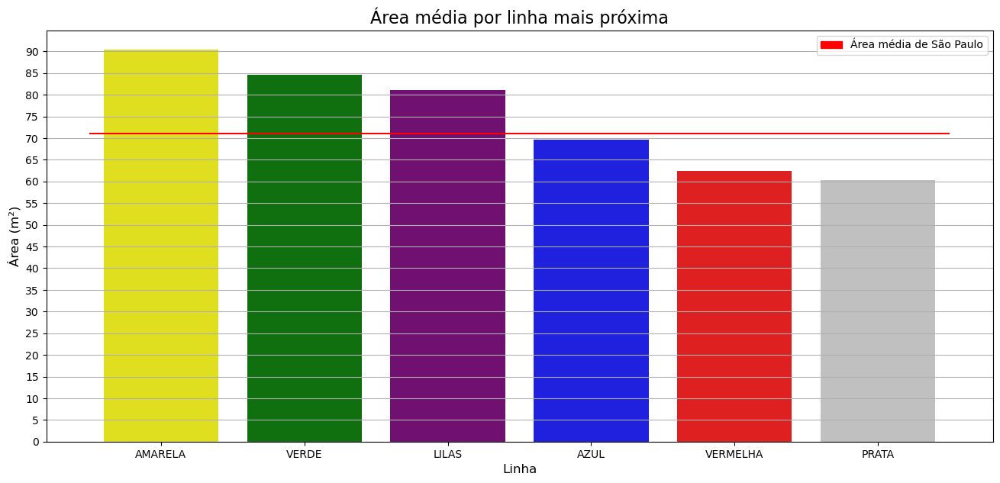

In [239]:
palette = sns.color_palette(['yellow', 'green', 'purple', 'blue', 'red', 'silver'])

ax = sns.barplot(
    x=tendencia_central_area_linha.index,
    y=tendencia_central_area_linha['Área média'],
    palette=palette
)

ax.set_title('Área média por linha mais próxima', fontsize=16)
ax.set_xlabel('Linha', fontsize=12)
ax.set_ylabel('Área (m²)', fontsize=12)
ax.hlines(y=df['Área'].mean(), xmin=-.5, xmax=5.5, color='red')
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
ax.grid(axis='y')

#### Distribuição das áreas por linha mais próxima

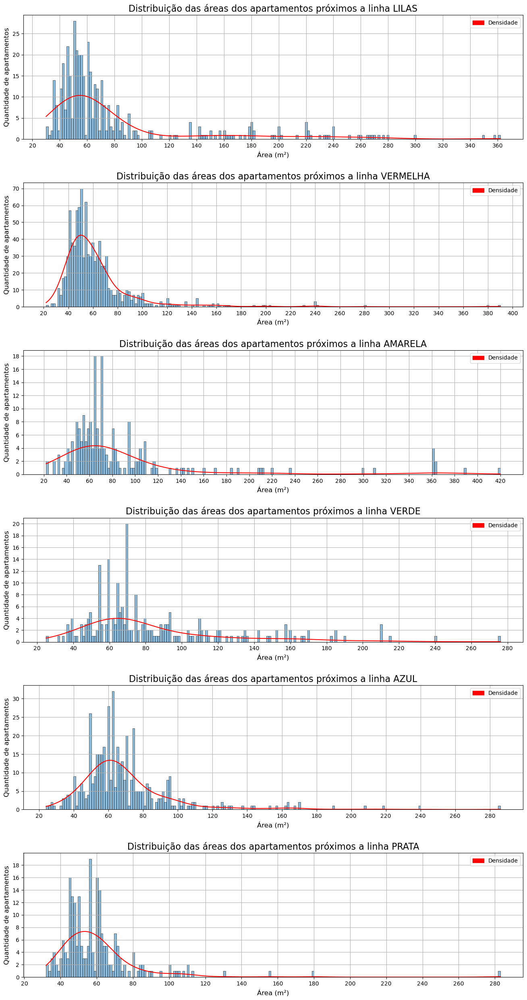

In [240]:
_, axes = plt.subplots(6, figsize=(16, 31))
plt.subplots_adjust(hspace=.35)

for i, linha in enumerate(linhas):
    sns.histplot(df[df['Linha próxima'] == linha]['Área'], kde=True, ax=axes[i], bins=200)

    axes[i].set_title(f'Distribuição das áreas dos apartamentos próximos a linha {linha}', fontsize=16)

    axes[i].set_xlabel('Área (m²)', fontsize=12)
    axes[i].set_ylabel('Quantidade de apartamentos', fontsize=12)
    axes[i].grid()
    axes[i].lines[0].set_color('red')
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=20))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Densidade'])

axes[2].yaxis.set_major_locator(ticker.MultipleLocator(base=2))
axes[3].yaxis.set_major_locator(ticker.MultipleLocator(base=2))
axes[5].yaxis.set_major_locator(ticker.MultipleLocator(base=2))

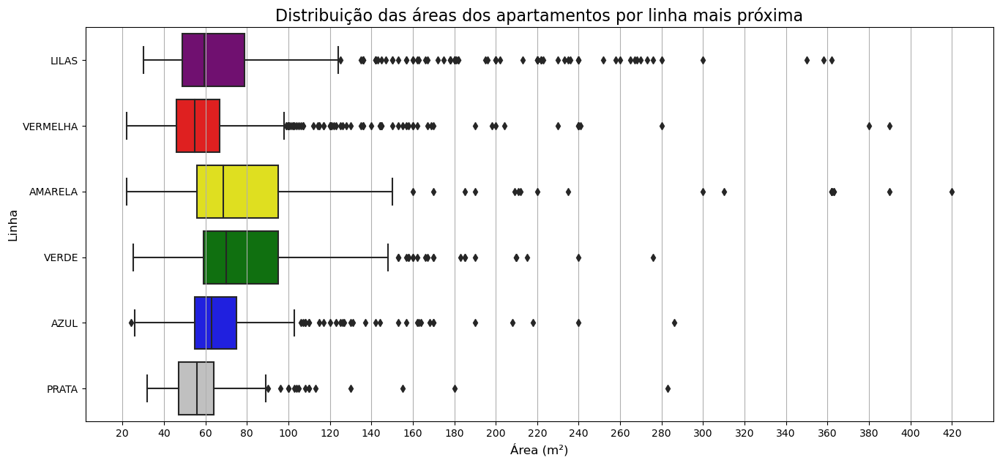

In [241]:
palette = sns.color_palette(['purple', 'red', 'yellow', 'green', 'blue', 'silver'])

ax = sns.boxplot(df, x='Área', y='Linha próxima', palette=palette)

ax.set_title(f'Distribuição das áreas dos apartamentos por linha mais próxima', fontsize=16)
ax.set_ylabel('Linha', fontsize=12)
ax.set_xlabel('Área (m²)', fontsize=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(base=20))
ax.grid(axis='x')

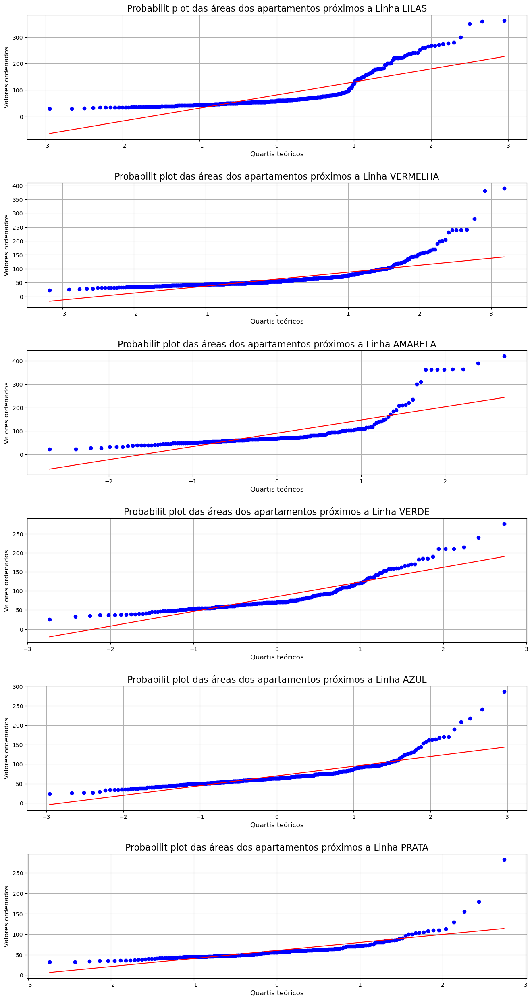

In [242]:
_, axes = plt.subplots(6, figsize=(16, 31))
plt.subplots_adjust(hspace=.35)

for i, linha in enumerate(linhas):
    (_, (_, _, _)) = probplot(df[df['Linha próxima'] == linha]['Área'], plot=axes[i])

    axes[i].set_title(f'Probabilit plot das áreas dos apartamentos próximos a Linha {linha}', fontsize=16)

    axes[i].set_xlabel('Quartis teóricos', fontsize=12)
    axes[i].set_ylabel('Valores ordenados', fontsize=12)
    axes[i].grid()

#### Relação entre Valor e Área por linha mais próxima

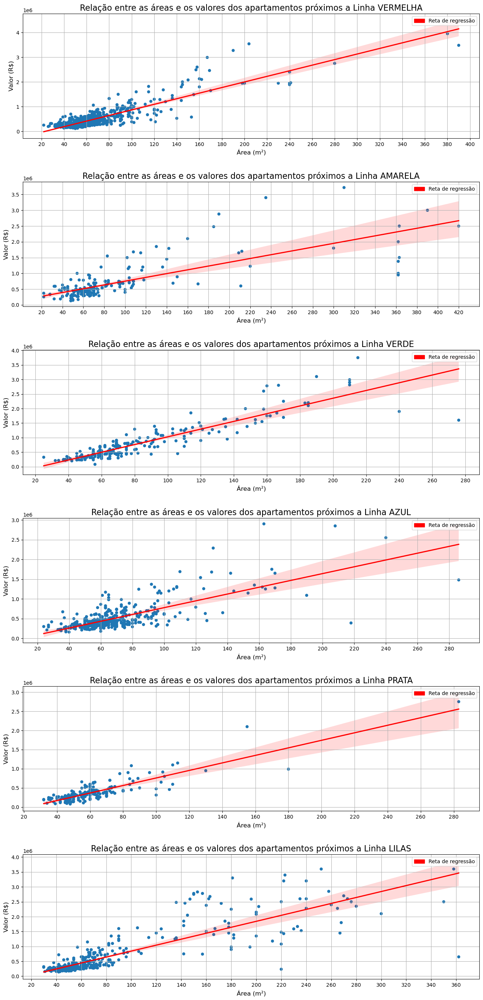

In [243]:
_, axes = plt.subplots(6, figsize=(16, 34))
plt.subplots_adjust(hspace=.35)

for i, linha in enumerate(linhas):
    i -=1

    sns.scatterplot(df[df['Linha próxima'] == linha], x='Área', y='Valor', edgecolor='none', ax=axes[i])
    sns.regplot(df[df['Linha próxima'] == linha], x='Área', y='Valor', ax=axes[i], color='red', ci=95, scatter=False)   

    axes[i].set_title(f'Relação entre as áreas e os valores dos apartamentos próximos a Linha {linha}', fontsize=16)

    axes[i].set_xlabel('Área (m²)', fontsize=12)
    axes[i].set_ylabel('Valor (R$)', fontsize=12)
    axes[i].grid()
    axes[i].xaxis.set_major_locator(ticker.MultipleLocator(base=20))
    leg_patch = mpatches.Patch(color='red')
    axes[i].legend(handles=[leg_patch], labels=['Reta de regressão'])

> <h4>Conclusões</h4>
>
> - A MAIOR parte dos apartamentos a venda estão próximos da Linha Vermelha - 942 apartamentos
>
> - A MENOR parte dos apartamentos a venda estão próximos da Linha Amarela - 200 apartamentos
>
> - O VALOR MÉDIO dos apartamentos próximos a linha Verde é o MAIOR - R$823.722,31
>
> - O VALOR MEDIANO dos apartamentos próximos a linha Verde é o MAIOR - R$650.000,00
>
> - O VALOR MODAL dos apartamentos próximos a linha Amarela é o MAIOR - R$750.000,00
>
> - O VALOR MÉDIO dos apartamentos próximos a linha Prata é o MENOR - R$369.709,30
>
> - O VALOR MEDIANO dos apartamentos próximos a linha Prata é o MENOR - R$320.000,00
>
> - O VALOR MODAL dos apartamentos próximos a linha Vermelha é o MENOR - R$250.000,00
>
> - O VALOR MÉDIO dos apartamentos próximos as linhas Verde, Amarela e Lilás estão ACIMA do valor médio de São Paulo
>
> - O VALOR MÉDIO dos apartamentos próximos as linhas Azul, Vermelha e Prata estão ABAIXO do valor médio de São Paulo
>
> - Todas as distribuições de VALORES por zona possuem assimetria a direita
>
> - O ÁREA MÉDIA dos apartamentos próximos a linha Amarela é a MAIOR - 90,63m²
>
> - O ÁREA MEDIANA dos apartamentos próximos a linha Verde é a MAIOR - 70m²
>
> - O ÁREA MODAL dos apartamentos próximos a linha Amarela é a MAIOR - 70m²
>
> - O ÁREA MÉDIA dos apartamentos próximos a linha Prata é a MENOR - 60,31m²
>
> - O ÁREA MEDIANA dos apartamentos próximos a linha Vermelha é a MENOR - 55m²
>
> - O ÁREA MODAL dos apartamentos próximos a linha Prata é a MENOR - 45m²
>
> - A ÁREA MÉDIA dos apartamentos próximos as linhas Verde, Amarela e Lilás estão ACIMA da área média de São Paulo
>
> - A ÁREA MÉDIA dos apartamentos próximos as linhas Azul, Vermelha e Prata estão ABAIXO da área média de São Paulo

### Variável Estação próxima

#### Quantidade de estação no dataset

In [244]:
df['Estação próxima'].nunique()

79

#### Obtendo as medidas de tendência central

In [245]:
apartamentos_estacao = df['Estação próxima'].value_counts().to_frame()
apartamentos_estacao.columns = ['Quantidade de apartamentos']
apartamentos_estacao.head()

,Quantidade de apartamentos
Estação próxima,
CORINTHIANS-ITAQUERA,270
PALMEIRAS-BARRA FUNDA,210
LARGO TREZE,132
TUCURUVI,127
SÃO PAULO-MORUMBI,114


In [246]:
print(f'A quantidade média de apartamentos é {round(apartamentos_estacao["Quantidade de apartamentos"].mean())} apartamentos')
print(f'A quantidade mediana de apartamentos é {round(apartamentos_estacao["Quantidade de apartamentos"].median())} apartamentos')
print(f'A quantidade modal de apartamentos é {apartamentos_estacao["Quantidade de apartamentos"].mode()[0]} apartamentos')

A quantidade média de apartamentos é 31 apartamentos
A quantidade mediana de apartamentos é 16 apartamentos
A quantidade modal de apartamentos é 2 apartamentos


#### Distribuição de apartamentos por estação mais próxima

In [247]:
is_normal(apartamentos_estacao["Quantidade de apartamentos"])

Não segue uma normal


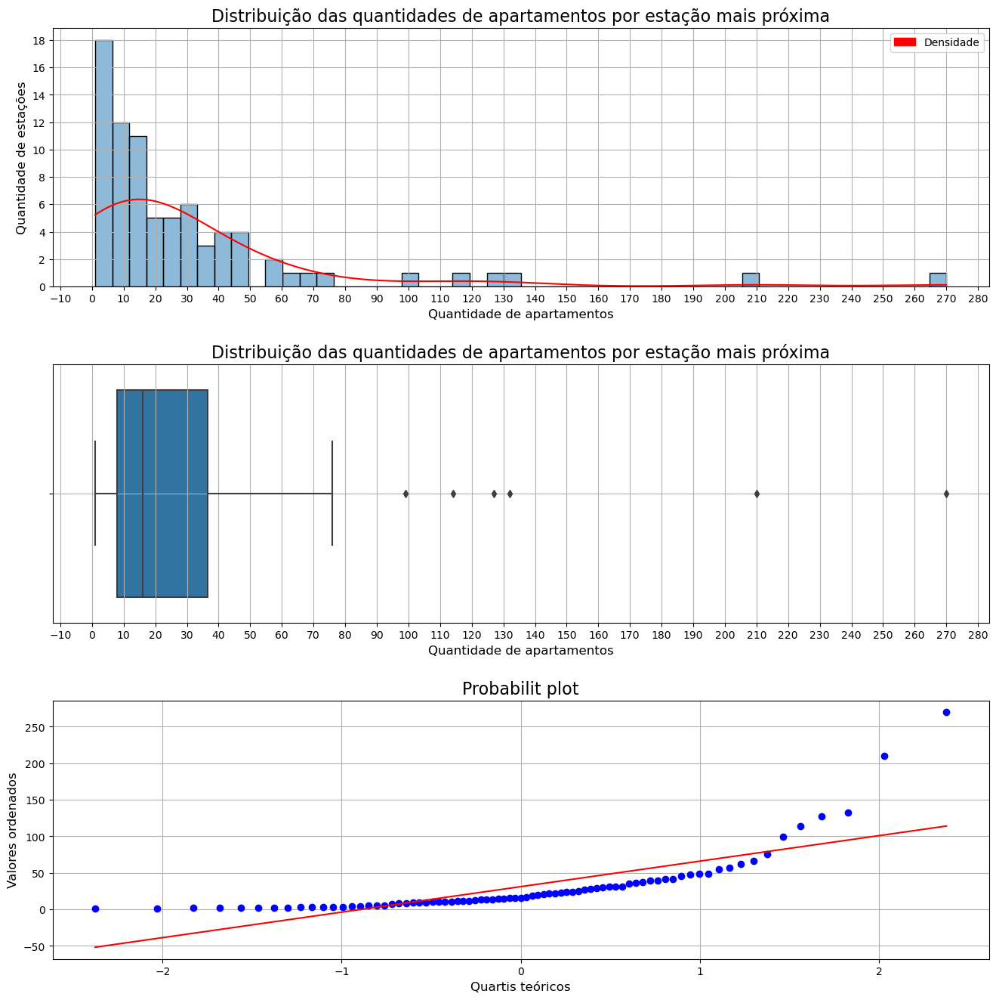

In [248]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(apartamentos_estacao, x='Quantidade de apartamentos', kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição das quantidades de apartamentos por estação mais próxima', fontsize=16)
axes[0].set_xlabel('Quantidade de apartamentos', fontsize=12)
axes[0].set_ylabel('Quantidade de estações', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=2))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=10))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(apartamentos_estacao, x='Quantidade de apartamentos', ax=axes[1])
axes[1].set_title('Distribuição das quantidades de apartamentos por estação mais próxima', fontsize=16)
axes[1].set_xlabel('Quantidade de apartamentos', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=10))


(_, (_, _, _)) = probplot(apartamentos_estacao['Quantidade de apartamentos'], plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### As 15 estações com mais apartamentos próximos a venda 

In [249]:
estacoes_mais_comuns = df['Estação próxima'].value_counts().nlargest(15)
estacoes_mais_comuns

Estação próxima
CORINTHIANS-ITAQUERA             270
PALMEIRAS-BARRA FUNDA            210
LARGO TREZE                      132
TUCURUVI                         127
SÃO PAULO-MORUMBI                114
VILA MADALENA                     99
CAPÃO REDONDO                     76
JABAQUARA                         66
SÃO MATEUS                        62
MARECHAL DEODORO                  57
BELÉM                             55
PATRIARCA                         49
AYRTON SENNA-JARDIM SÃO PAULO     49
SÃO LUCAS                         48
GUILHERMINA-ESPERANÇA             46
Name: count, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CORINTHIANS-ITAQUERA'),
  Text(1, 0, 'PALMEIRAS-BARRA FUNDA'),
  Text(2, 0, 'LARGO TREZE'),
  Text(3, 0, 'TUCURUVI'),
  Text(4, 0, 'SÃO PAULO-MORUMBI'),
  Text(5, 0, 'VILA MADALENA'),
  Text(6, 0, 'CAPÃO REDONDO'),
  Text(7, 0, 'JABAQUARA'),
  Text(8, 0, 'SÃO MATEUS'),
  Text(9, 0, 'MARECHAL DEODORO'),
  Text(10, 0, 'BELÉM'),
  Text(11, 0, 'PATRIARCA'),
  Text(12, 0, 'AYRTON SENNA-JARDIM SÃO PAULO'),
  Text(13, 0, 'SÃO LUCAS'),
  Text(14, 0, 'GUILHERMINA-ESPERANÇA')])

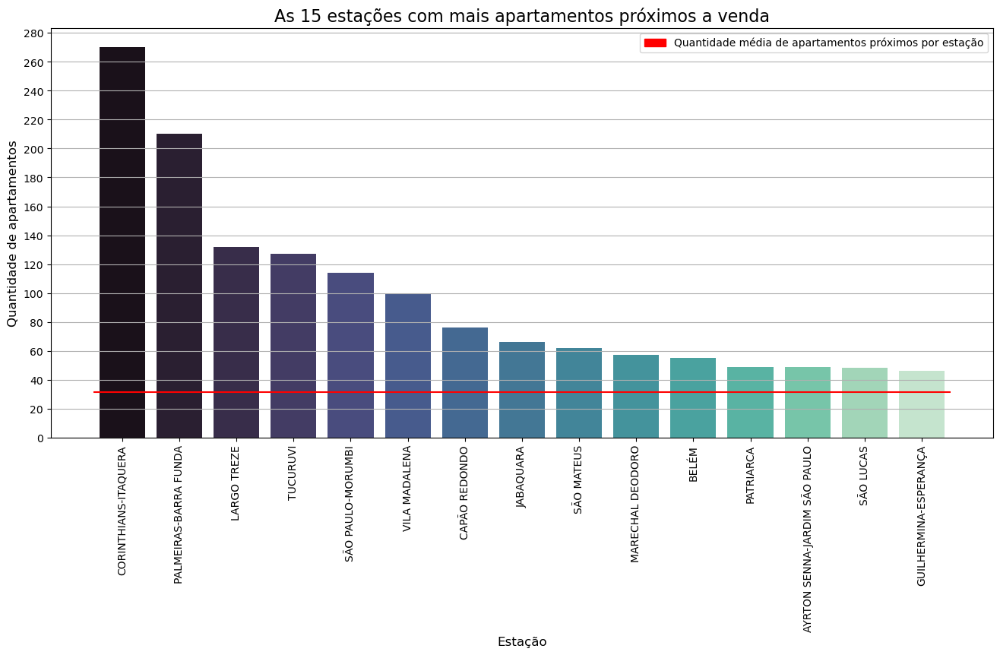

In [250]:
ax = sns.barplot(x=estacoes_mais_comuns.index, y=estacoes_mais_comuns.values, palette='mako')
ax.hlines(y=apartamentos_estacao.mean(), xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('As 15 estações com mais apartamentos próximos a venda', fontsize=16)
ax.set_xlabel('Estação', fontsize=12)
ax.set_ylabel('Quantidade de apartamentos', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=20))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Quantidade média de apartamentos próximos por estação'])
plt.xticks(rotation=90)

#### Distribuição dos valores médios por estação mais próxima

In [251]:
contagem_estacoes = df['Estação próxima'].value_counts()
estacoes_filtradas = contagem_estacoes[contagem_estacoes > 10].index

valor_estacao = df[df['Estação próxima'].isin(estacoes_filtradas)].groupby('Estação próxima')['Valor'].mean()
valor_estacao.head()

Estação próxima
ADOLFO PINHEIRO                 608243.75
ALTO DO IPIRANGA                698311.26
ARTUR ALVIM                     257827.95
AYRTON SENNA-JARDIM SÃO PAULO   551728.47
BELÉM                           557116.38
Name: Valor, dtype: float64

In [252]:
is_normal(valor_estacao.values)

Não segue uma normal


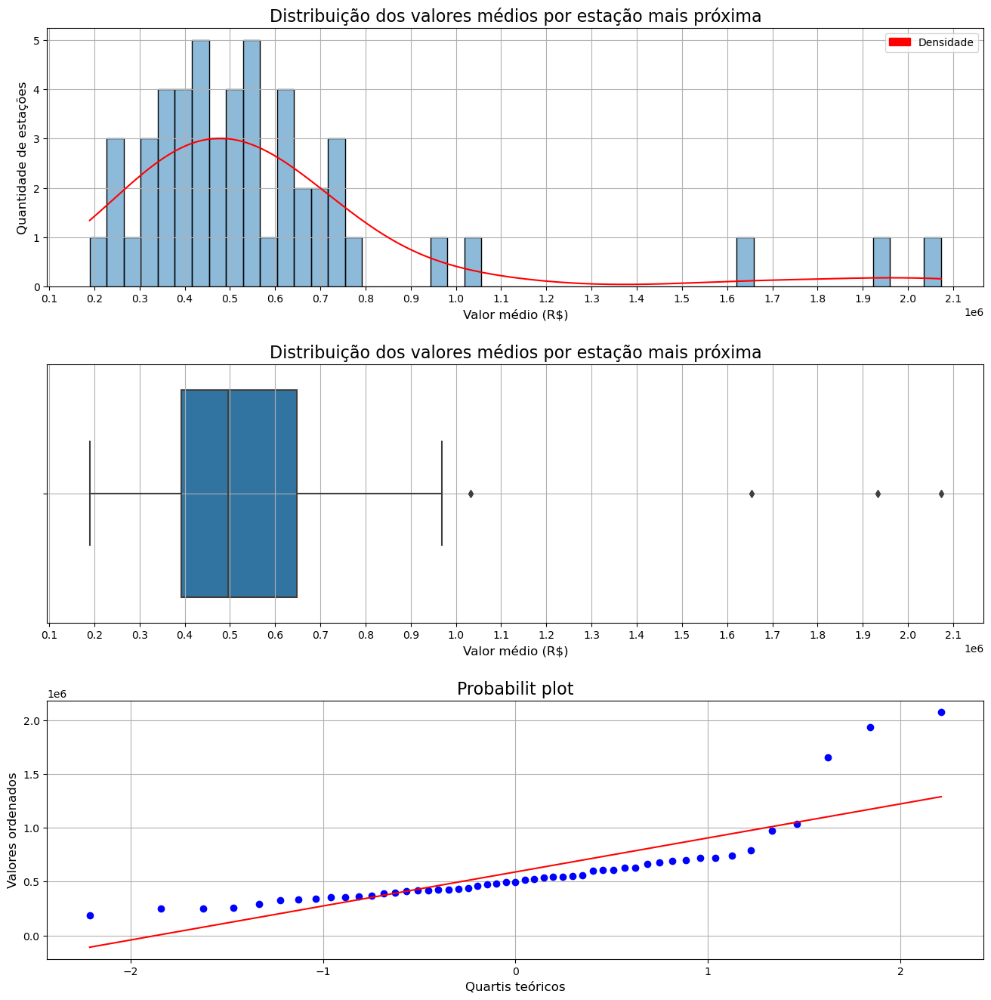

In [253]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=valor_estacao.values, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição dos valores médios por estação mais próxima', fontsize=16)
axes[0].set_xlabel('Valor médio (R$)', fontsize=12)
axes[0].set_ylabel('Quantidade de estações', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=1e5))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=valor_estacao.values, ax=axes[1])
axes[1].set_title('Distribuição dos valores médios por estação mais próxima', fontsize=16)
axes[1].set_xlabel('Valor médio (R$)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=1e5))


(_, (_, _, _)) = probplot(valor_estacao.values, plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### Os 15 valores médios mais altos por estação mais próxima

In [254]:
estacoes_mais_caras = valor_estacao.nlargest(15)
estacoes_mais_caras

Estação próxima
CAMPO BELO               2073497.39
MOEMA                    1932857.14
EUCALIPTOS               1653833.25
VILA MADALENA            1032761.07
MARECHAL DEODORO          969304.65
CARRÃO                    792229.48
SAÚDE                     738107.36
VILA PRUDENTE             722415.32
SANTANA                   718012.17
ALTO DO IPIRANGA          698311.26
HIGIENÓPOLIS-MACKENZIE    690466.05
TAMANDUATEÍ               676636.36
TATUAPÉ                   665411.14
SÃO PAULO-MORUMBI         629097.27
SANTOS-IMIGRANTES         628641.00
Name: Valor, dtype: float64

In [255]:
valor_medio_estacao = valor_estacao.mean()
print(price(valor_medio_estacao))

R$ 589.342,58


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAMPO BELO'),
  Text(1, 0, 'MOEMA'),
  Text(2, 0, 'EUCALIPTOS'),
  Text(3, 0, 'VILA MADALENA'),
  Text(4, 0, 'MARECHAL DEODORO'),
  Text(5, 0, 'CARRÃO'),
  Text(6, 0, 'SAÚDE'),
  Text(7, 0, 'VILA PRUDENTE'),
  Text(8, 0, 'SANTANA'),
  Text(9, 0, 'ALTO DO IPIRANGA'),
  Text(10, 0, 'HIGIENÓPOLIS-MACKENZIE'),
  Text(11, 0, 'TAMANDUATEÍ'),
  Text(12, 0, 'TATUAPÉ'),
  Text(13, 0, 'SÃO PAULO-MORUMBI'),
  Text(14, 0, 'SANTOS-IMIGRANTES')])

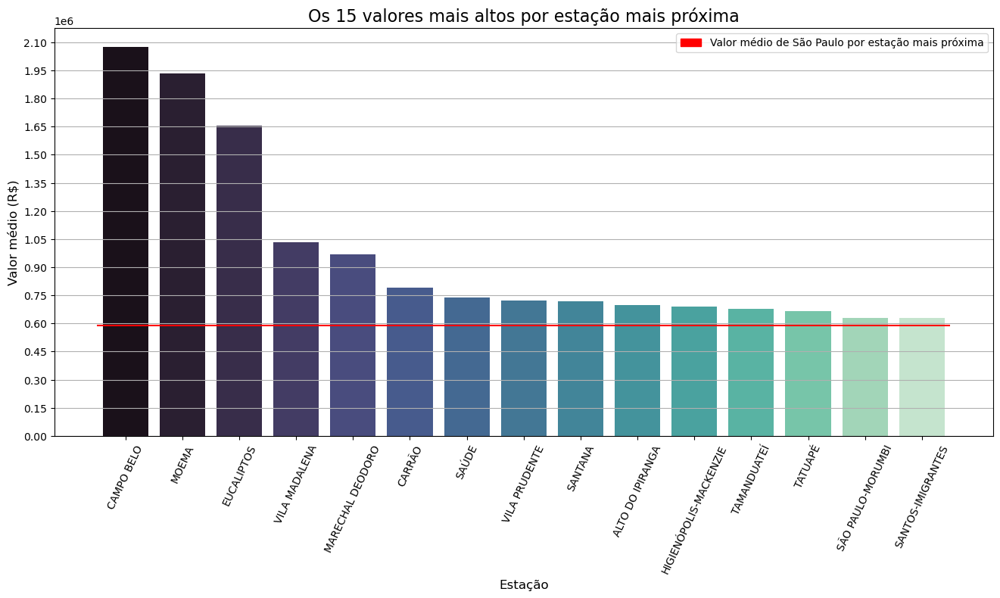

In [256]:
ax = sns.barplot(x=estacoes_mais_caras.index, y=estacoes_mais_caras.values, palette='mako')
ax.hlines(y=valor_medio_estacao, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 valores mais altos por estação mais próxima', fontsize=16)
ax.set_xlabel('Estação', fontsize=12)
ax.set_ylabel('Valor médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=1.5e5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo por estação mais próxima'])
plt.xticks(rotation=65)

#### Os 15 valores mais baixos por estação mais próxima

In [257]:
estacoes_mais_baratas = valor_estacao.nsmallest(15).sort_values(ascending=False)
estacoes_mais_baratas

Estação próxima
REPÚBLICA               409445.16
LARGO TREZE             393600.00
VILA MATILDE            391860.83
CAMPO LIMPO             370830.47
VILA UNIÃO              360887.21
PEDRO II                356172.55
CAPÃO REDONDO           355309.21
JABAQUARA               339947.86
GUILHERMINA-ESPERANÇA   333916.43
VILA TOLSTÓI            326750.00
PATRIARCA               295116.69
ARTUR ALVIM             257827.95
CORINTHIANS-ITAQUERA    249946.71
JARDIM PLANALTO         246400.00
SÃO MATEUS              189832.42
Name: Valor, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'REPÚBLICA'),
  Text(1, 0, 'LARGO TREZE'),
  Text(2, 0, 'VILA MATILDE'),
  Text(3, 0, 'CAMPO LIMPO'),
  Text(4, 0, 'VILA UNIÃO'),
  Text(5, 0, 'PEDRO II'),
  Text(6, 0, 'CAPÃO REDONDO'),
  Text(7, 0, 'JABAQUARA'),
  Text(8, 0, 'GUILHERMINA-ESPERANÇA'),
  Text(9, 0, 'VILA TOLSTÓI'),
  Text(10, 0, 'PATRIARCA'),
  Text(11, 0, 'ARTUR ALVIM'),
  Text(12, 0, 'CORINTHIANS-ITAQUERA'),
  Text(13, 0, 'JARDIM PLANALTO'),
  Text(14, 0, 'SÃO MATEUS')])

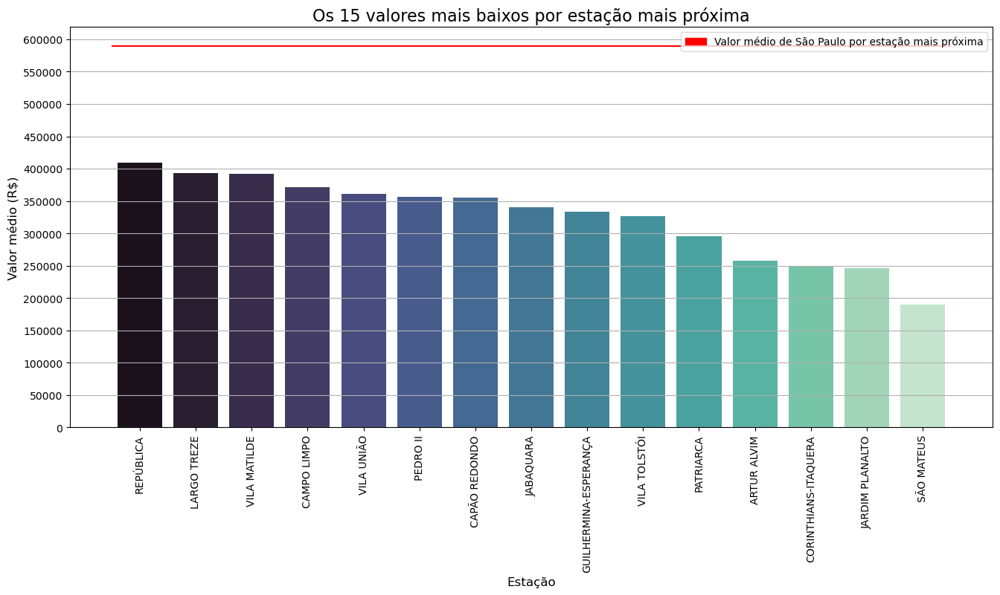

In [258]:
ax = sns.barplot(x=estacoes_mais_baratas.index, y=estacoes_mais_baratas.values, palette='mako')
ax.hlines(y=valor_medio_estacao, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('Os 15 valores mais baixos por estação mais próxima', fontsize=16)
ax.set_xlabel('Estação', fontsize=12)
ax.set_ylabel('Valor médio (R$)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5e4))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Valor médio de São Paulo por estação mais próxima'])
plt.xticks(rotation=90)

#### Distribuição das áreas médias por estação mais próxima

In [259]:
area_estacao = df[df['Estação próxima'].isin(estacoes_filtradas)].groupby('Estação próxima')['Área'].mean()
area_estacao.head()

Estação próxima
ADOLFO PINHEIRO                 81.12
ALTO DO IPIRANGA                73.74
ARTUR ALVIM                     53.37
AYRTON SENNA-JARDIM SÃO PAULO   78.06
BELÉM                           67.98
Name: Área, dtype: float64

In [260]:
is_normal(area_estacao.values)

Não segue uma normal


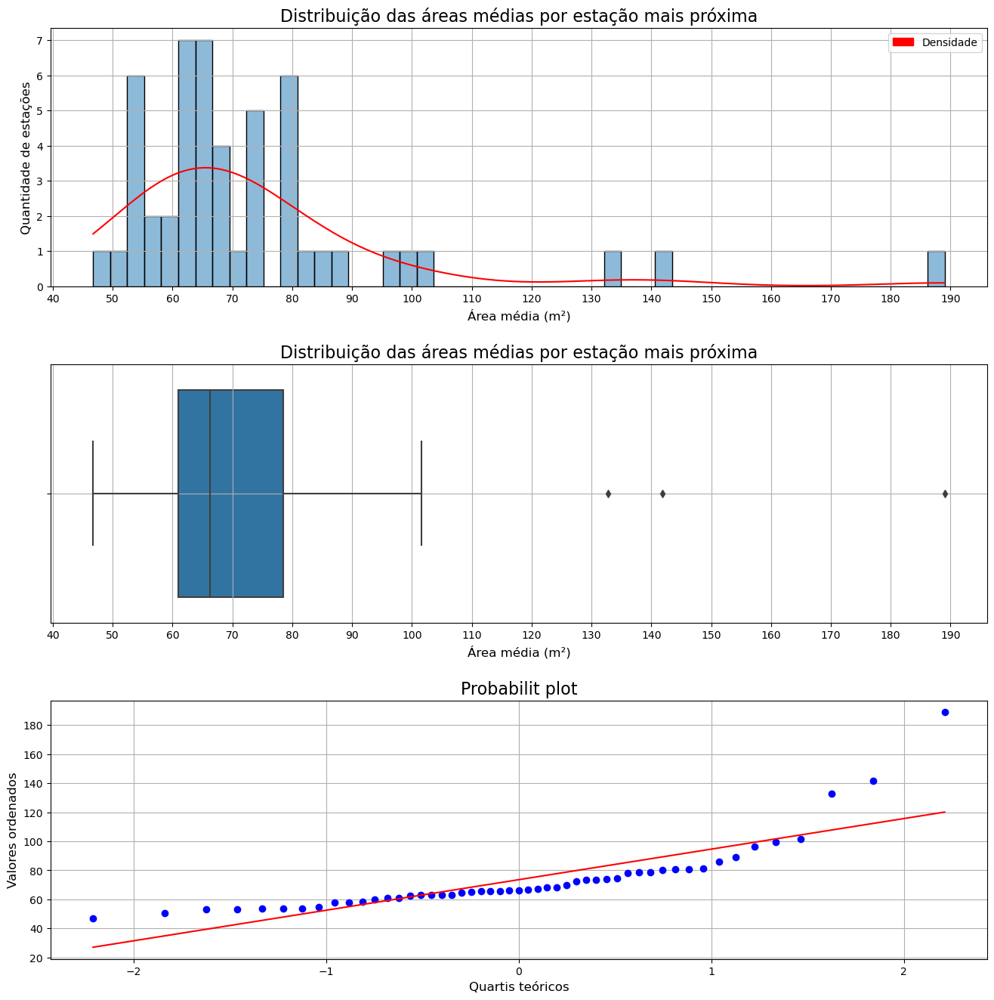

In [261]:
_, axes = plt.subplots(3, figsize=(16, 16))
plt.subplots_adjust(hspace=.3)

sns.histplot(x=area_estacao.values, kde=True, bins=50, ax=axes[0])
axes[0].set_title('Distribuição das áreas médias por estação mais próxima', fontsize=16)
axes[0].set_xlabel('Área média (m²)', fontsize=12)
axes[0].set_ylabel('Quantidade de estações', fontsize=12)
axes[0].grid()
axes[0].lines[0].set_color('red')
axes[0].yaxis.set_major_locator(ticker.MultipleLocator(base=1))
axes[0].xaxis.set_major_locator(ticker.MultipleLocator(base=10))
leg_patch = mpatches.Patch(color='red')
axes[0].legend(handles=[leg_patch], labels=['Densidade'])


sns.boxplot(x=area_estacao.values, ax=axes[1])
axes[1].set_title('Distribuição das áreas médias por estação mais próxima', fontsize=16)
axes[1].set_xlabel('Área média (m²)', fontsize=12)
axes[1].grid()
axes[1].xaxis.set_major_locator(ticker.MultipleLocator(base=10))


(_, (_, _, _)) = probplot(area_estacao.values, plot=axes[2])
axes[2].set_title('Probabilit plot', fontsize=16)
axes[2].set_xlabel('Quartis teóricos', fontsize=12)
axes[2].set_ylabel('Valores ordenados', fontsize=12)
axes[2].grid()

#### As 15 áreas médias mais altas por estação mais próxima

In [262]:
estacoes_mais_area = area_estacao.nlargest(15)
estacoes_mais_area

Estação próxima
CAMPO BELO                      189.00
MOEMA                           141.86
EUCALIPTOS                      132.71
MARECHAL DEODORO                101.61
SÃO PAULO-MORUMBI                99.31
VILA MADALENA                    96.19
CARRÃO                           89.26
GIOVANNI GRONCHI                 86.13
ADOLFO PINHEIRO                  81.12
VILA DAS BELEZAS                 80.80
VILA PRUDENTE                    80.71
SANTANA                          80.40
TATUAPÉ                          78.57
TAMANDUATEÍ                      78.55
AYRTON SENNA-JARDIM SÃO PAULO    78.06
Name: Área, dtype: float64

In [263]:
area_media_estacao = area_estacao.mean()

print(f'{area_media_estacao.round(2)}m²')

73.55m²


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'CAMPO BELO'),
  Text(1, 0, 'MOEMA'),
  Text(2, 0, 'EUCALIPTOS'),
  Text(3, 0, 'MARECHAL DEODORO'),
  Text(4, 0, 'SÃO PAULO-MORUMBI'),
  Text(5, 0, 'VILA MADALENA'),
  Text(6, 0, 'CARRÃO'),
  Text(7, 0, 'GIOVANNI GRONCHI'),
  Text(8, 0, 'ADOLFO PINHEIRO'),
  Text(9, 0, 'VILA DAS BELEZAS'),
  Text(10, 0, 'VILA PRUDENTE'),
  Text(11, 0, 'SANTANA'),
  Text(12, 0, 'TATUAPÉ'),
  Text(13, 0, 'TAMANDUATEÍ'),
  Text(14, 0, 'AYRTON SENNA-JARDIM SÃO PAULO')])

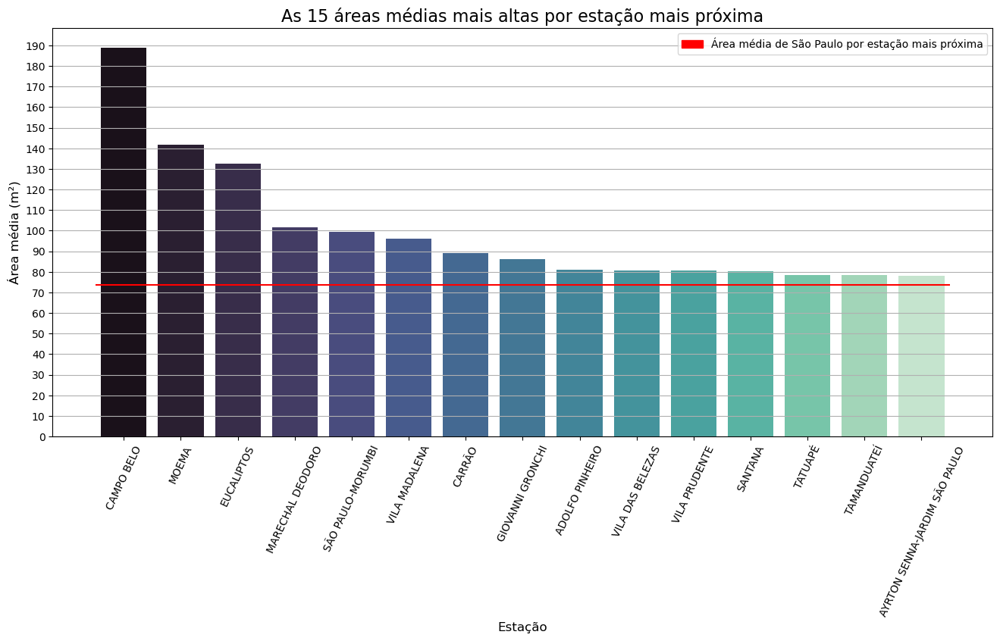

In [264]:
ax = sns.barplot(x=estacoes_mais_area.index, y=estacoes_mais_area.values, palette='mako')
ax.hlines(y=area_media_estacao, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('As 15 áreas médias mais altas por estação mais próxima', fontsize=16)
ax.set_xlabel('Estação', fontsize=12)
ax.set_ylabel('Área média (m²)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=10))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo por estação mais próxima'])
plt.xticks(rotation=65)

#### As 15 áreas médias mais baixas por estação mais próxima

In [265]:
estacoes_menos_area = area_estacao.nsmallest(15).sort_values(ascending=False)
estacoes_menos_area

Estação próxima
JABAQUARA               62.53
CARANDIRU               61.00
SANTO AMARO             61.00
SACOMÃ                  60.00
GUILHERMINA-ESPERANÇA   58.43
CAPÃO REDONDO           58.07
BRÁS                    57.95
VILA TOLSTÓI            54.58
PEDRO II                53.82
JARDIM PLANALTO         53.73
REPÚBLICA               53.68
ARTUR ALVIM             53.37
PATRIARCA               53.00
CORINTHIANS-ITAQUERA    50.40
SÃO MATEUS              46.73
Name: Área, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'JABAQUARA'),
  Text(1, 0, 'CARANDIRU'),
  Text(2, 0, 'SANTO AMARO'),
  Text(3, 0, 'SACOMÃ'),
  Text(4, 0, 'GUILHERMINA-ESPERANÇA'),
  Text(5, 0, 'CAPÃO REDONDO'),
  Text(6, 0, 'BRÁS'),
  Text(7, 0, 'VILA TOLSTÓI'),
  Text(8, 0, 'PEDRO II'),
  Text(9, 0, 'JARDIM PLANALTO'),
  Text(10, 0, 'REPÚBLICA'),
  Text(11, 0, 'ARTUR ALVIM'),
  Text(12, 0, 'PATRIARCA'),
  Text(13, 0, 'CORINTHIANS-ITAQUERA'),
  Text(14, 0, 'SÃO MATEUS')])

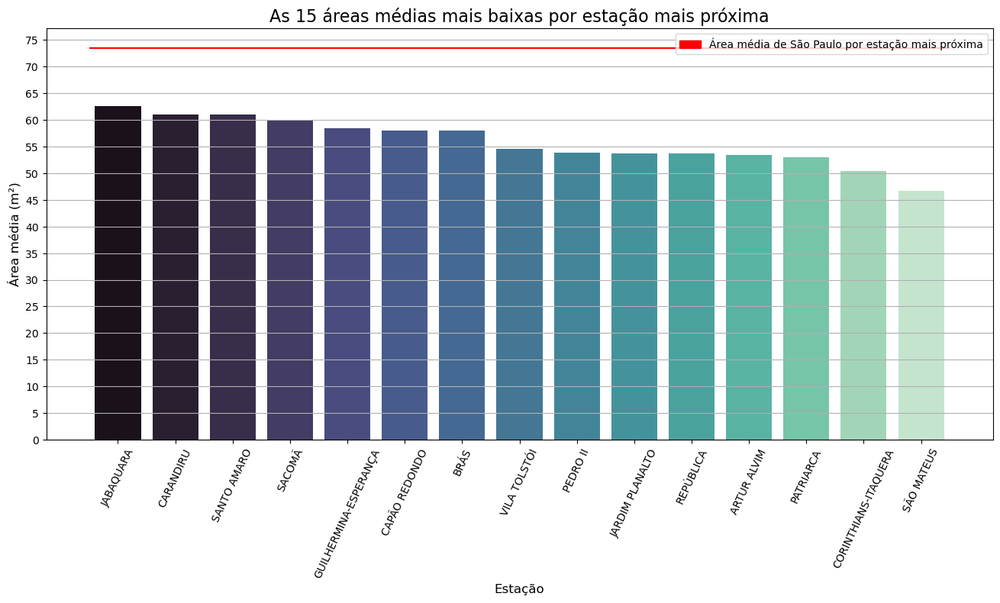

In [266]:
ax = sns.barplot(x=estacoes_menos_area.index, y=estacoes_menos_area.values, palette='mako')
ax.hlines(y=area_media_estacao, xmin=-.5, xmax=14.5, color='red')
ax.grid(axis='y')
ax.set_title('As 15 áreas médias mais baixas por estação mais próxima', fontsize=16)
ax.set_xlabel('Estação', fontsize=12)
ax.set_ylabel('Área média (m²)', fontsize=12)
ax.yaxis.set_major_locator(ticker.MultipleLocator(base=5))
leg_patch = mpatches.Patch(color='red')
ax.legend(handles=[leg_patch], labels=['Área média de São Paulo por estação mais próxima'])
plt.xticks(rotation=65)

> <h4>Conclusões</h4>
>
> - O valor médio por estação mais próxima é R$589.342,58
>
> - A estação com mais apartamentos próximos a venda é Corinthians Itaquera - 270 apartamentos
>
> - O valor médio dos apartamentos próximos a estação Campo Belo é o MAIOR - R$2.073.497,39
>
> - O valor médio dos apartamentos próximos a estação São Mateus é o MENOR - R$189.832,42
>
> - A área média por estação mais próxima é de 73.55m²
>
> - A área média dos apartamentos proximos a estação Campo Belo é a MAIOR - 189m²
>
> - A área média dos apartamentos proximos a estação São Mateus é a MENOR - 46,73m²

### Salvando o dataset tratado

In [269]:
df.to_excel('./data/Apartamentos_tratado.xlsx', index=False)